## Overview

This notebook is set to create social ratings on a circular rating scale

- load circular rating image
- select a mean High or Low rating
- select a standard deviation
- splash random dots based on the mean + sd
- save image

## import libraries

In [104]:
# Python program to read  
# image using matplotlib 
  
# importing matplotlib modules 
import os, shutil
import matplotlib.image as mpimg 
import matplotlib.pyplot as plt 
import matplotlib as mpl
import math
from math import pi, cos, sin, sqrt
import random
import numpy as np
import pandas as pd
from scipy.stats import loggamma
from scipy.stats import johnsonsu

%matplotlib inline

## functions : display image in actual size

In [4]:
def display_image_in_actual_size(im_path):

    dpi = mpl.rcParams['figure.dpi']
    im_data = plt.imread(im_path)
    height, width, depth = im_data.shape

    # What size does the figure need to be in inches to fit the image?
    figsize = width / float(dpi), height / float(dpi)

    # Create a figure of the right size with one axes that takes up the full figure
    fig = plt.figure(figsize=figsize)
    ax = fig.add_axes([0, 0, 1, 1])

    # Hide spines, ticks, etc.
    ax.axis('off')

    # Display the image.
    ax.imshow(im_data, cmap='gray')

    plt.show()

## parameters

In [1]:
main_dir = '/Users/h/Documents/projects_local/social_influence'

## scale example

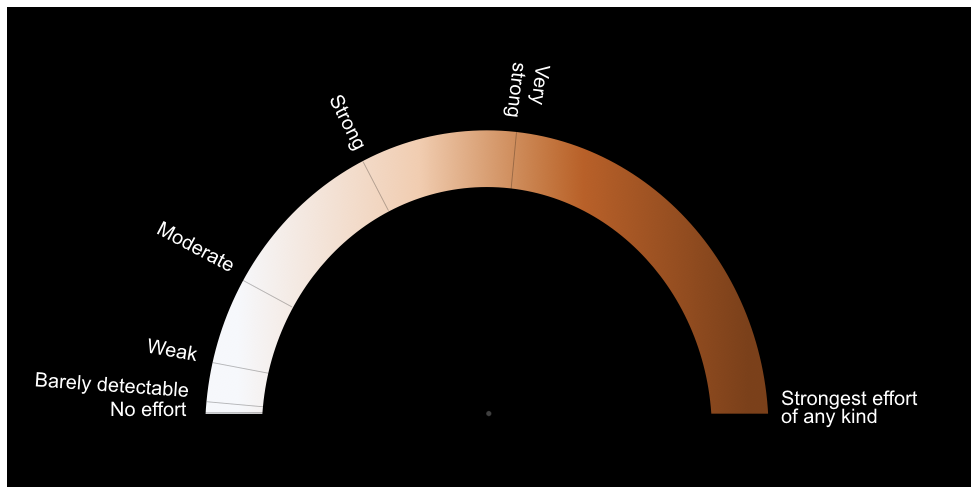

In [7]:
condition = 'cognitive'
img_scale = os.sep.join([main_dir, 'stimuli', 'ratingscale', 'task-'+ condition + '_scale.png'])
display_image_in_actual_size(img_scale)

# after fitting it to the pilot data

* Sep 2019
* We ran 5 particpants and fitted the rating distribution of the mental rotation task. 
* loggamma(c = 0.17, loc = 177.11, scale = 2.22)

In [ ]:
def make_pdf(dist, params, size=10000):
    """Generate distributions's Probability Distribution Function """

    # Separate parts of parameters
    arg = params[:-2]
    loc = params[-2]
    scale = params[-1]

    # Get sane start and end points of distribution
    start = dist.ppf(0.01, *arg, loc=loc, scale=scale) if arg else dist.ppf(0.01, loc=loc, scale=scale)
    end = dist.ppf(0.99, *arg, loc=loc, scale=scale) if arg else dist.ppf(0.99, loc=loc, scale=scale)

    # Build PDF and turn into pandas Series
    x = np.linspace(start, end, size)
    y = dist.pdf(x, loc=loc, scale=scale, *arg)
    pdf = pd.Series(y, x)

    return pdf



## johnsonsu low

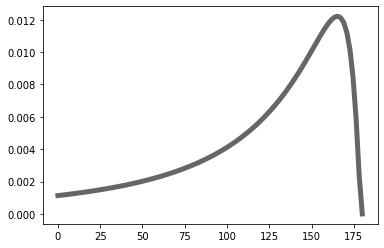

In [90]:
# johnsonsu
# loggammacombined data low
# low 5.74, 0.877, 180.82, 0.019
# (6.064444072172332,
#  1.0514702513247631,
#  183.13906303642042,
#  0.17941739969742476)

x = np.linspace(0,180,100)
fig, ax = plt.subplots(1, 1)
# (c = 0.17, loc = 177.11, scale = 2.22)
dist_low = johnsonsu.pdf(x,6.064444072172332, 1.0514702513247631, 183.13906303642042, 0.17941739969742476)
ax.plot(x, johnsonsu.pdf(x,5.74, 0.87, 180, 0.15), 'k-', lw=5, alpha=0.6, label='loggamma pdf')

In [115]:
r = johnsonsu.rvs( a=5.74, b=0.87,loc = 180, scale = 0.15,size=1000)

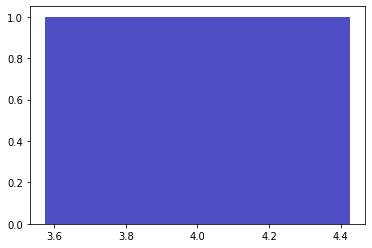

In [107]:
n, bins, patches = plt.hist(x=4, bins='auto', color='#0504aa',
                            alpha=0.7, rwidth=0.85)

In [91]:
# random sdelect
np.random.choice(dist_low, 10, replace=True)

array([0.0016449 , 0.01376694, 0.00113893, 0.00075426, 0.00109531,
       0.00113893, 0.0055524 , 0.00075426, 0.01957836, 0.00042559])

## johnsonsu med

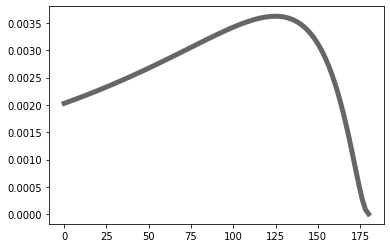

In [87]:
# johnsonsu
# loggammacombined data low
# low 5.74, 0.877, 180.82, 0.019
# (6.064444072172332,
#  1.0514702513247631,
#  183.13906303642042,
#  0.17941739969742476)

x = np.linspace(0,180,100)
fig, ax = plt.subplots(1, 1)
# (c = 0.17, loc = 177.11, scale = 2.22)
johnsonsu.pdf(x,6.064444072172332, 1.0514702513247631, 183.13906303642042, 0.17941739969742476)
ax.plot(x, johnsonsu.pdf(x,5.90, 0.92, 181, 0.6), 'k-', lw=5, alpha=0.6, label='loggamma pdf')

## johnson su high

In [89]:
 johnsonsu.pdf(x,6.06, 1.05, 183, 1.7)

array([2.09623142e-03, 2.10786122e-03, 2.11943729e-03, 2.13095318e-03,
       2.14240213e-03, 2.15377708e-03, 2.16507062e-03, 2.17627500e-03,
       2.18738210e-03, 2.19838341e-03, 2.20927007e-03, 2.22003274e-03,
       2.23066171e-03, 2.24114678e-03, 2.25147729e-03, 2.26164209e-03,
       2.27162951e-03, 2.28142735e-03, 2.29102285e-03, 2.30040265e-03,
       2.30955280e-03, 2.31845869e-03, 2.32710507e-03, 2.33547596e-03,
       2.34355469e-03, 2.35132379e-03, 2.35876503e-03, 2.36585934e-03,
       2.37258679e-03, 2.37892655e-03, 2.38485685e-03, 2.39035494e-03,
       2.39539705e-03, 2.39995835e-03, 2.40401288e-03, 2.40753354e-03,
       2.41049203e-03, 2.41285880e-03, 2.41460298e-03, 2.41569234e-03,
       2.41609328e-03, 2.41577070e-03, 2.41468799e-03, 2.41280699e-03,
       2.41008789e-03, 2.40648919e-03, 2.40196769e-03, 2.39647835e-03,
       2.38997432e-03, 2.38240683e-03, 2.37372519e-03, 2.36387670e-03,
       2.35280666e-03, 2.34045829e-03, 2.32677275e-03, 2.31168910e-03,
      

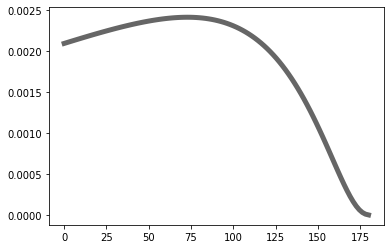

In [88]:
# johnsonsu
# loggammacombined data low
# low 5.74, 0.877, 180.82, 0.019
# (6.064444072172332,
#  1.0514702513247631,
#  183.13906303642042,
#  0.17941739969742476)

x = np.linspace(0,180,100)
fig, ax = plt.subplots(1, 1)
# (c = 0.17, loc = 177.11, scale = 2.22)
johnsonsu.pdf(x,6.064444072172332, 1.0514702513247631, 183.13906303642042, 0.17941739969742476)
ax.plot(x, johnsonsu.pdf(x,6.06, 1.05, 183, 1.7), 'k-', lw=5, alpha=0.6, label='loggamma pdf')

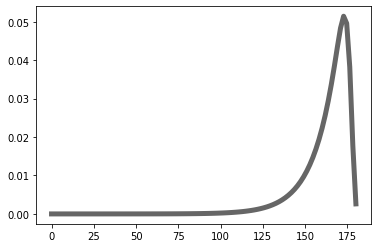

In [56]:
# loggammacombined data low
# low 5.74, 0.877, 180.82, 0.019

x = np.linspace(0,180,100)
fig, ax = plt.subplots(1, 1)
# (c = 0.17, loc = 177.11, scale = 2.22)
loggamma.pdf(x,c = 0.17, loc = 177.11, scale = 2.22)
ax.plot(x, loggamma.pdf(x,  c = 0.17, loc = 177.11, scale = 2.22), 'k-', lw=5, alpha=0.6, label='loggamma pdf')

In [ ]:
x = np.linspace(0,180,100)
fig, ax = plt.subplots(1, 1)
# (c = 0.17, loc = 177.11, scale = 2.22)
loggamma.pdf(x, 0.17, loc=177.11, scale=2.22)
ax.plot(x, loggamma.pdf(x, 0.17, loc=177.11, scale=2.22),'k-', lw=5, alpha=0.6, label='loggamma pdf')

In [ ]:
x = np.linspace(0,180,100)
fig, ax = plt.subplots(1, 1)
# (c = 0.17, loc = 177.11, scale = 2.22)
loggamma.pdf(x, 0.17, loc=177.11, scale=2.22)
ax.plot(x, loggamma.pdf(x, 0.17, loc=177.11, scale=2.22),'k-', lw=5, alpha=0.6, label='loggamma pdf')

In [9]:
# Separate parts of parameters
x = (x + np.roll(x, -1))[:-1] / 2.0
# Calculate fitted PDF and error with fit in distribution
pdf = distribution.pdf(x, loc=177.11, scale=2.22, arg = 0.17)

NameError: name 'x' is not defined

# in radians

## create radian distribution

In [6]:
# try if this works
high_mu = 0.3*pi # mean 
low_mu = 0.7*pi # mean 
sigma = 0.15*pi # standard deviation

low_dist = np.random.normal(low_mu, sigma, 1000)
high_dist = np.random.normal(high_mu, sigma, 1000)


## higher rating distribution

<IPython.core.display.Javascript object>


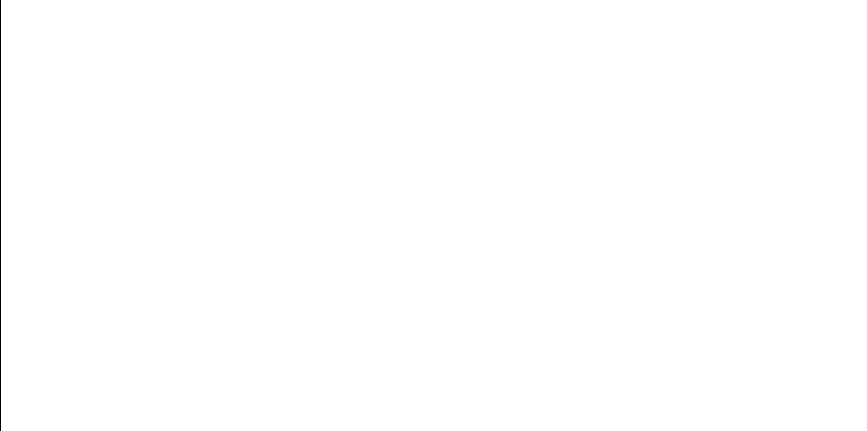

697.375618818 276.534555237
694.857783442 272.543854681
653.070182265 223.042657837
573.620634048 173.857701201
662.526323481 232.154589606
641.771735433 213.307547341
639.626206556 211.586141774
697.871786789 277.3409128
717.880382512 317.702651128
683.327101663 256.11752115


<IPython.core.display.Javascript object>


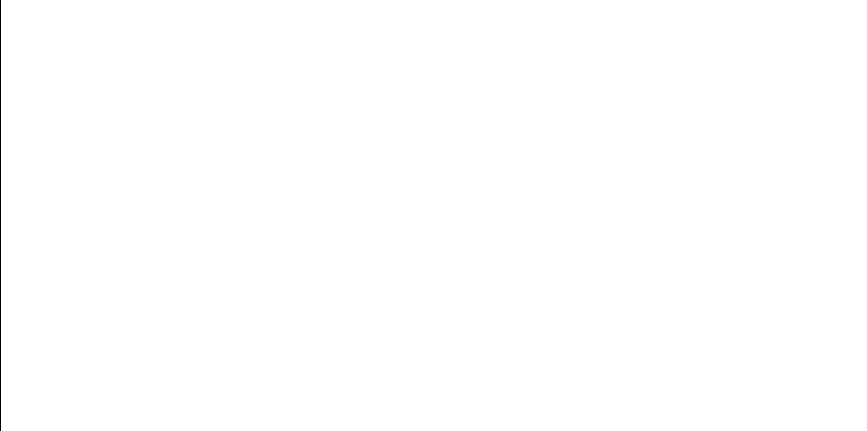

498.314745943 157.465790484
707.566348876 294.658603506
667.407531033 237.250582247
595.758713623 183.634801928
517.288523359 159.343641848
634.312893877 207.484719818
663.059464165 232.697449353
704.978866881 289.713023937
716.882650701 315.176198644
572.618175048 173.473817377


<IPython.core.display.Javascript object>


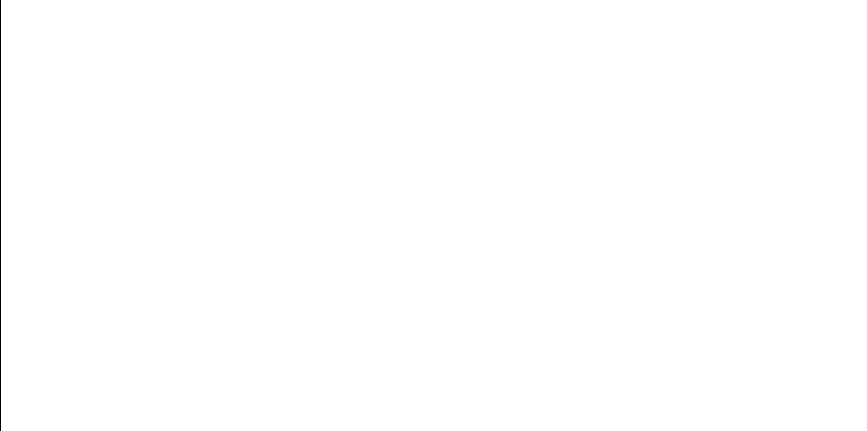

667.091060941 236.911414435
441.40548903 160.456449174
676.350393675 247.384328526
416.592082074 165.907448825
710.805749253 301.257062379
629.551739149 203.996127469
582.835450322 177.61961436
586.523200534 179.245898946
581.947447242 177.238478853
352.227656738 193.587386076


<IPython.core.display.Javascript object>


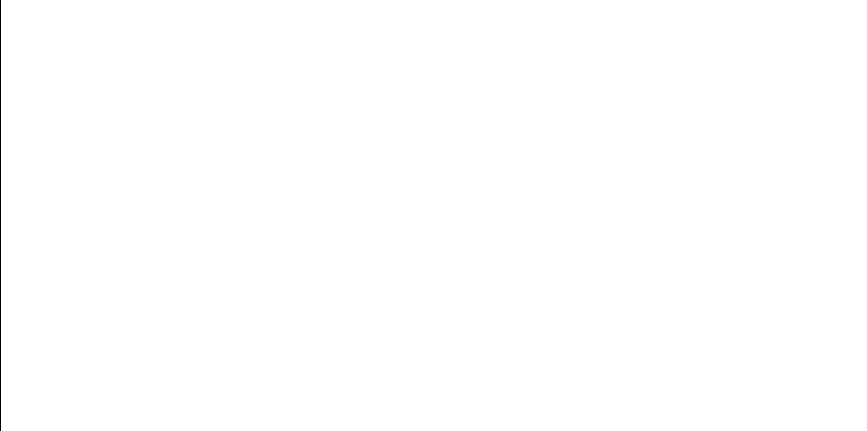

730.362655393 360.878105641
321.912809437 215.209089386
630.086911272 204.379765095
607.469418182 189.885044012
619.092046807 196.90814538
690.943704365 266.650374728
491.383487952 157.139488745
697.481096732 276.705407727
634.066084144 207.29963257
535.573696979 162.545123022


<IPython.core.display.Javascript object>


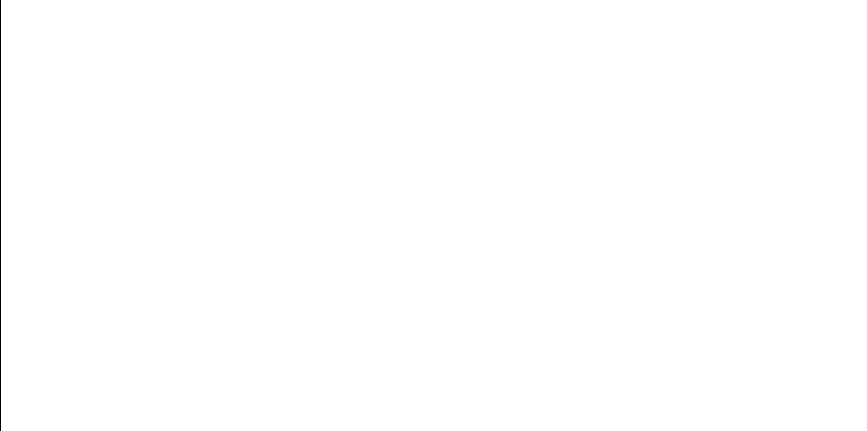

695.15989631 273.014050734
612.265103746 192.679559557
507.252907103 158.169785518
581.521813214 177.057221882
689.281996479 264.252848288
481.250657621 157.006071896
699.734226869 280.429883319
707.1852797 293.913248521
545.43803645 164.857640701
584.490254789 178.340666387


<IPython.core.display.Javascript object>


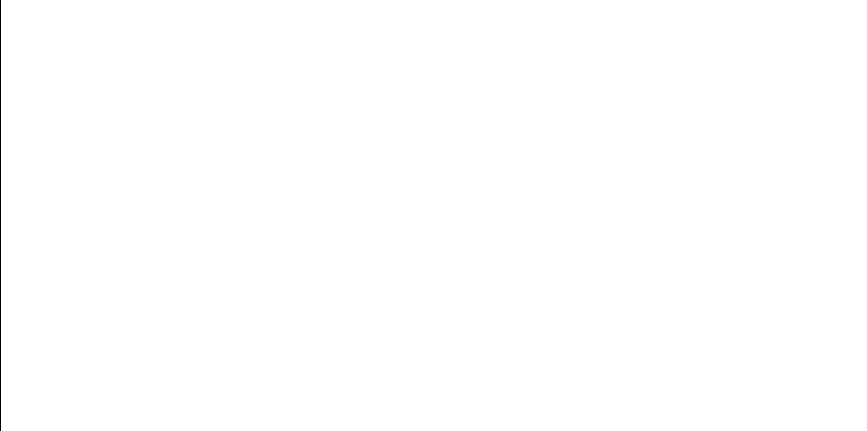

501.464420481 157.677368356
673.005818703 243.46514307
569.989919254 172.490478103
707.448187578 294.426830833
626.701898618 201.988492268
607.449945871 189.873983807
634.714515168 207.786914225
556.185779478 167.861364186
732.163216634 371.294675756
498.314745943 157.465790484


<IPython.core.display.Javascript object>

652.161753665 222.215897097
678.419497399 249.892426213
481.379279485 157.00521183
606.931223306 189.580192576
596.375570693 183.944495802
645.883274133 216.716253917
665.652974008 235.385798144
511.272377128 158.590989197
700.139474492 281.115487187
613.144331135 193.207384108


<IPython.core.display.Javascript object>

496.326433551 157.352615414
704.554104037 288.925943749
612.265103746 192.679559557
654.568397225 224.424039827
724.428860763 336.777391415
699.228089986 279.580476353
654.248214753 224.126938296
606.169125215 189.151491718
435.50470737 161.516268862
731.390977539 366.503855737


<IPython.core.display.Javascript object>


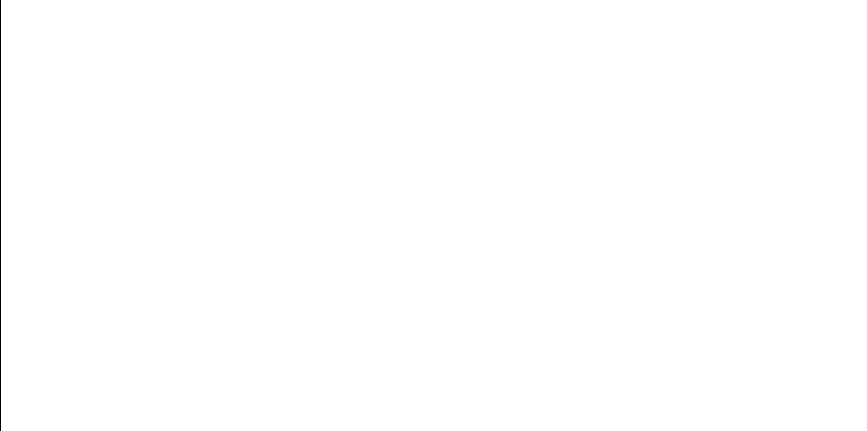

589.315330712 180.524507976
623.311861101 199.675893327
641.595703319 213.164857881
683.222822328 255.980976937
584.842113771 178.495805108
675.099422446 245.899381068
689.026753691 263.889777192
627.807976408 202.760697323
586.523200534 179.245898946
536.311947973 162.703763319


<IPython.core.display.Javascript object>


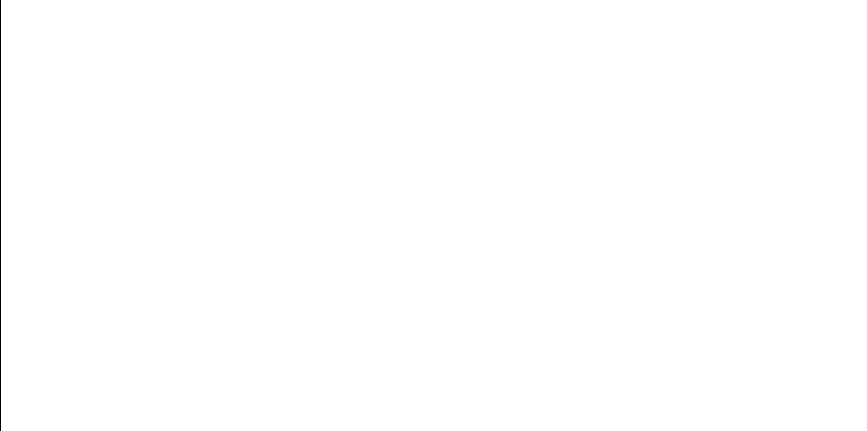

357.246804789 190.619291387
572.20306267 173.3162848
567.310852589 171.522253388
716.882650701 315.176198644
629.551739149 203.996127469
732.163216634 371.294675756
603.212880047 187.521189567
685.081865169 258.444628891
706.72014994 293.011662178
643.675070759 214.867257691


<IPython.core.display.Javascript object>


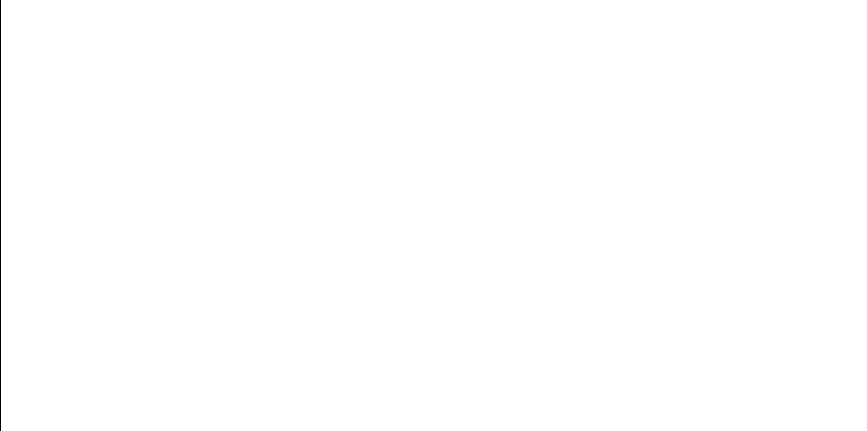

600.431741102 186.034114309
734.692153087 396.547687993
644.97373897 215.949468055
685.639737364 259.196339027
620.15678393 197.595135765
383.974213457 177.271940414
598.34603594 184.948014977
536.72342536 162.793189437
713.870389656 307.990776758
567.449671069 171.571583301


<IPython.core.display.Javascript object>


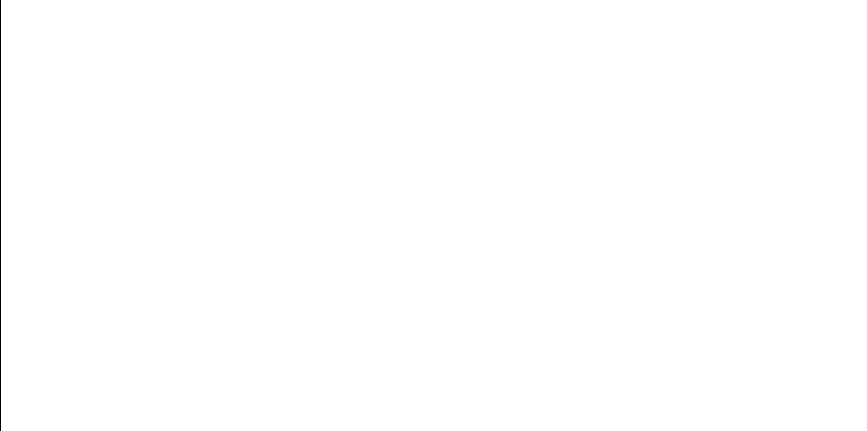

495.101502795 157.290735907
714.148529982 308.628903129
635.659777239 208.503136151
600.431741102 186.034114309
573.129370379 173.668963808
594.268577374 182.89537004
721.093001036 326.442608704
654.487255532 224.348649639
404.371340065 169.580840706
673.856002366 244.446098919


<IPython.core.display.Javascript object>


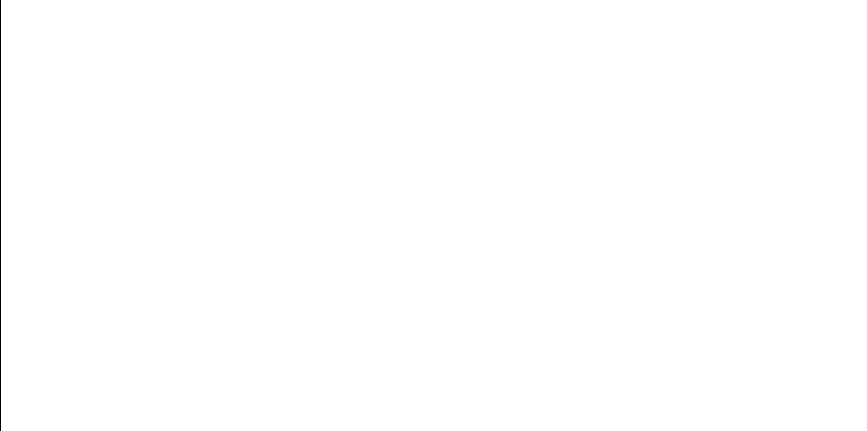

616.280064339 195.129888835
684.837069327 258.116609776
676.445106783 247.497706946
517.463580038 159.367747174
697.481096732 276.705407727
511.272377128 158.590989197
734.764793908 398.11475546
613.265041897 193.280230717
671.083339292 241.283997541
600.431741102 186.034114309


<IPython.core.display.Javascript object>


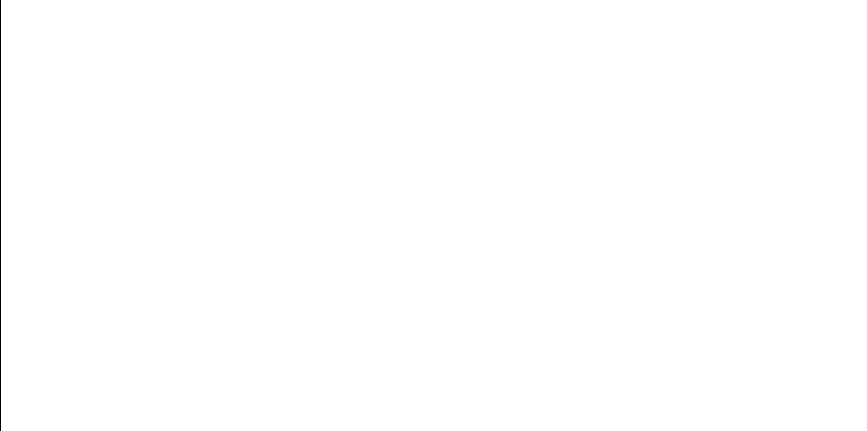

323.792163697 213.6621776
711.602136329 302.957257364
605.124416296 188.569450973
717.26329987 316.130702954
566.852491449 171.360020877
661.57567011 231.194684993
643.528358023 214.745923414
683.787823227 256.723113888
593.348185822 182.444757541
698.064798453 277.65643348


<IPython.core.display.Javascript object>


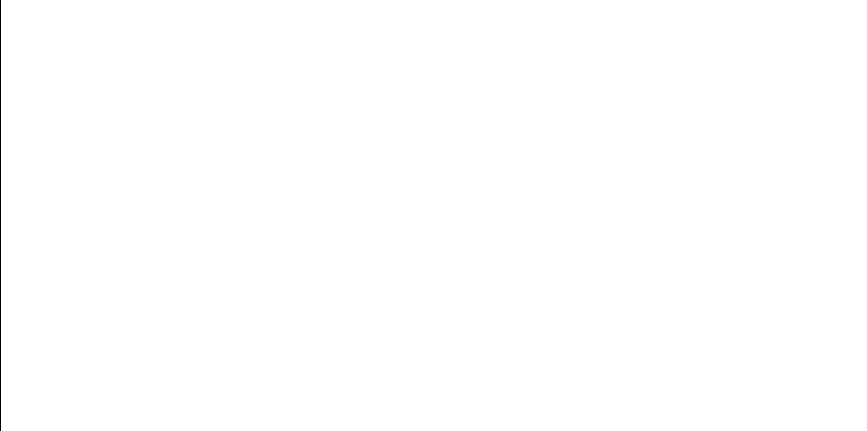

560.948932287 169.358676445
653.046380858 223.020892687
603.83519106 187.86009722
707.337166261 294.209600428
325.896691897 211.965610659
642.659621843 214.031271346
647.008793654 217.675365924
645.822366379 216.664675614
709.700621434 298.950791726
493.447327468 157.216653949


<IPython.core.display.Javascript object>


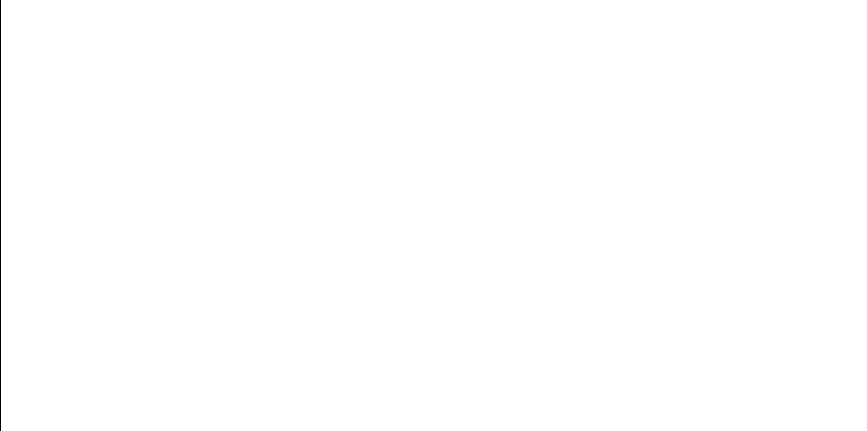

589.815547506 180.75793812
603.333358743 187.586624673
680.272392497 252.195653254
718.030422701 318.089602328
643.627407908 214.827819117
646.402501195 217.157297238
679.869649694 251.690302176
666.342683626 236.114314182
702.670719123 285.514068979
417.331678418 165.706614269


<IPython.core.display.Javascript object>


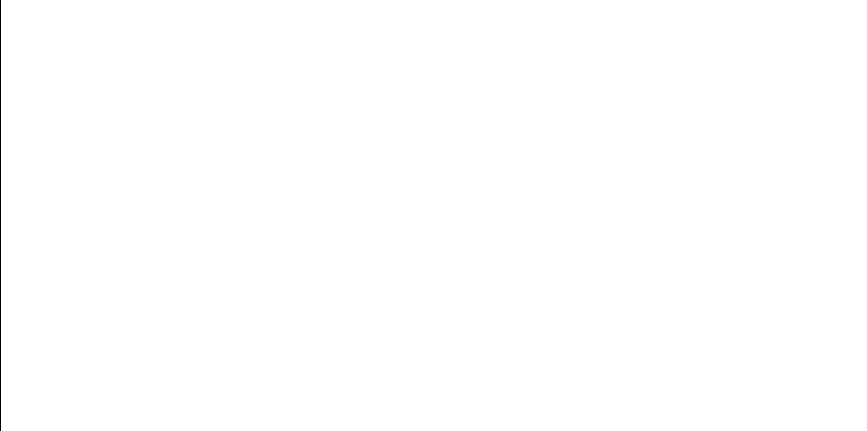

696.709746794 275.462948493
394.588072659 173.01836702
590.872260073 181.255459985
607.654571403 189.990324807
472.66162822 157.21215663
607.804108847 190.075505219
605.679657191 188.877984492
635.198081042 208.152435596
721.093001036 326.442608704
713.937117189 308.143429046


<IPython.core.display.Javascript object>


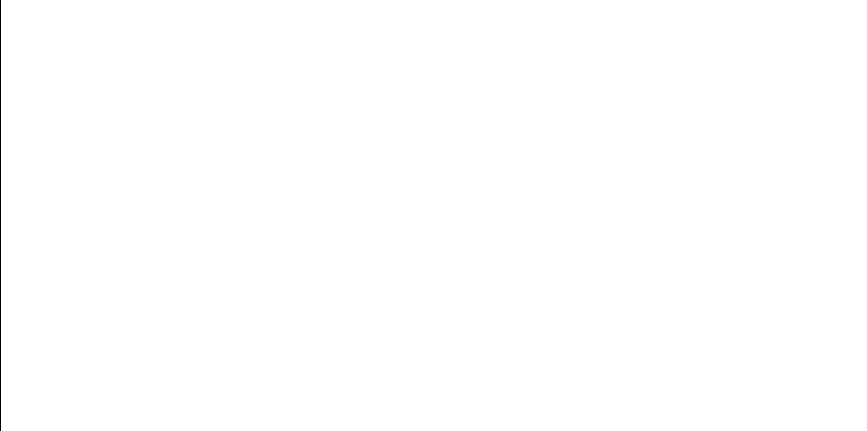

650.479321419 220.705876626
511.272377128 158.590989197
619.982976134 197.48247295
487.712469532 157.044066093
730.705710885 362.676347348
632.855450014 206.398558492
686.742117195 260.699124477
493.447327468 157.216653949
629.007899189 203.608438892
592.75692365 182.157725036


<IPython.core.display.Javascript object>


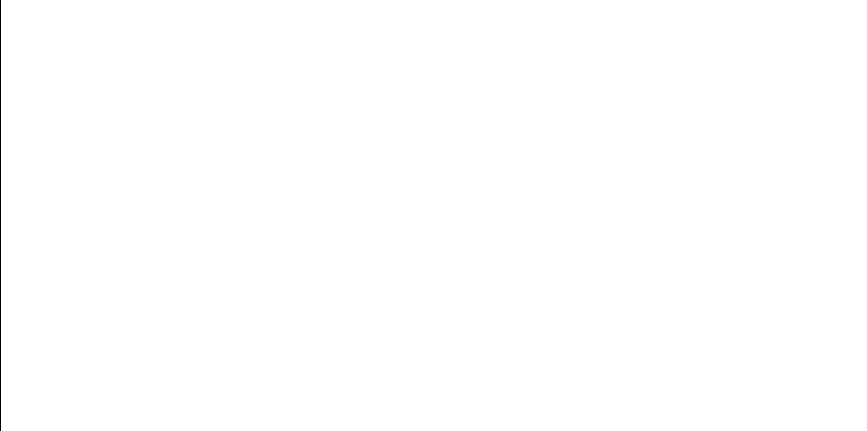

544.626253292 164.651468379
647.296691022 217.922535816
731.652164027 368.059783532
574.959629309 174.378119994
631.295028821 205.253627205
637.118184867 209.622004491
527.245085038 160.914586382
644.97373897 215.949468055
635.659777239 208.503136151
594.268577374 182.89537004


<IPython.core.display.Javascript object>


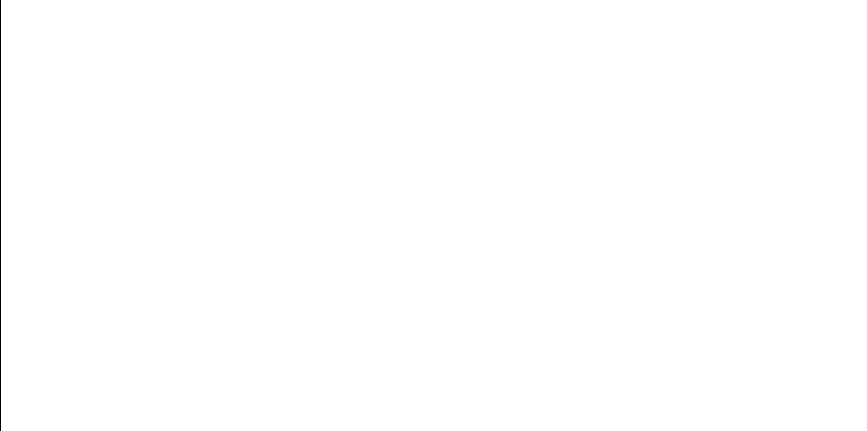

472.66162822 157.21215663
545.202739884 164.797585698
640.807925601 212.529496826
596.895070928 184.206955583
670.446779652 240.572850175
725.526478744 340.553618737
690.360611938 265.802316301
690.360611938 265.802316301
683.222822328 255.980976937
667.091060941 236.911414435


<IPython.core.display.Javascript object>


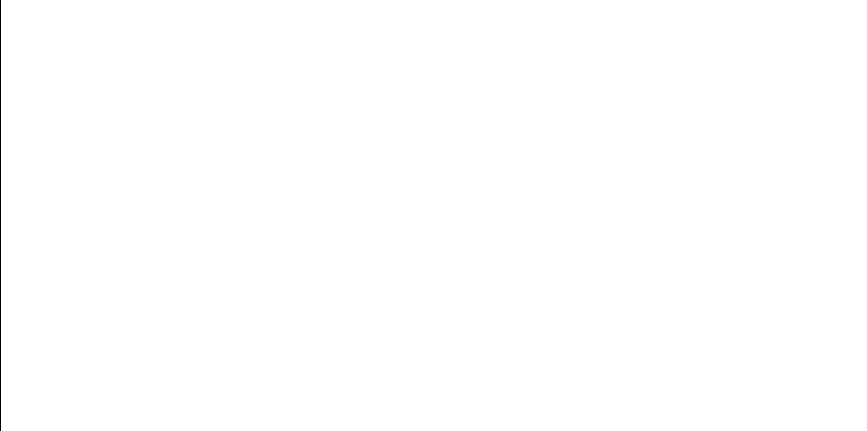

580.588257484 176.662891467
666.927367141 236.736470439
572.320781766 173.360873485
727.71244347 348.835059953
465.973668408 157.575848351
554.140923388 167.250193341
692.986392264 269.681246546
500.531963591 157.610600357
630.318402381 204.546366332
365.151284314 186.254225155


<IPython.core.display.Javascript object>


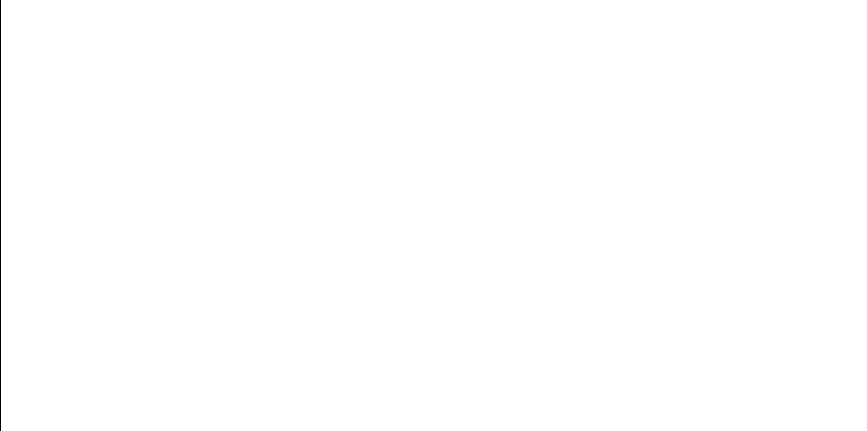

461.366009446 157.930347408
696.186720357 274.629533515
732.446341514 373.215608076
321.912809437 215.209089386
653.027191058 223.003348684
340.291030159 201.302744537
637.069450509 209.584342591
729.870267514 358.412738584
629.603033546 204.032806149
640.807925601 212.529496826


<IPython.core.display.Javascript object>


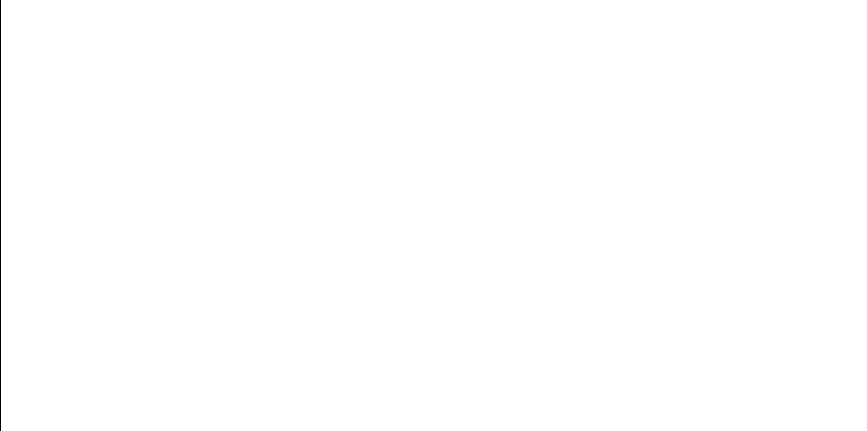

493.21570729 157.207149973
596.963964626 184.241874971
638.232693642 210.488512109
655.917638921 225.687452284
490.211441631 157.10320544
635.673489605 208.513577588
646.402501195 217.157297238
654.466143509 224.329044975
531.506839312 161.712542696
571.081880316 172.894975996


<IPython.core.display.Javascript object>


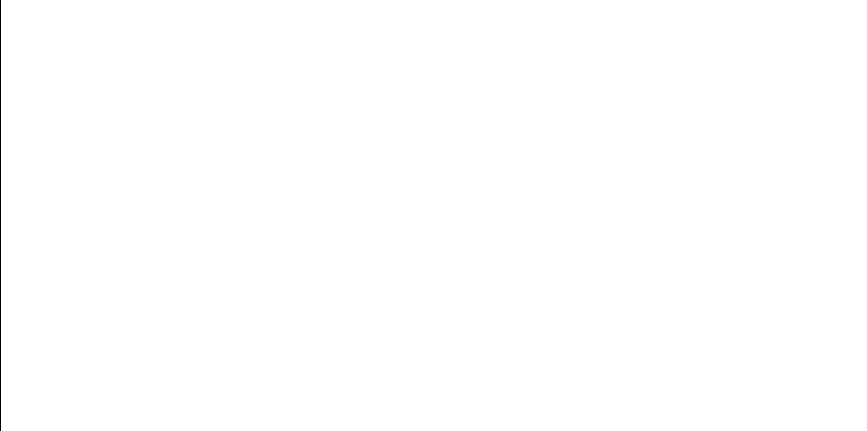

321.912809437 215.209089386
642.007965392 213.499445162
633.191470537 206.647529845
545.43803645 164.857640701
324.76478965 212.87346379
390.306249382 174.667184124
588.180729351 179.999969054
446.915775801 159.596854944
562.782697846 169.962929393
658.750972252 228.402115869


<IPython.core.display.Javascript object>


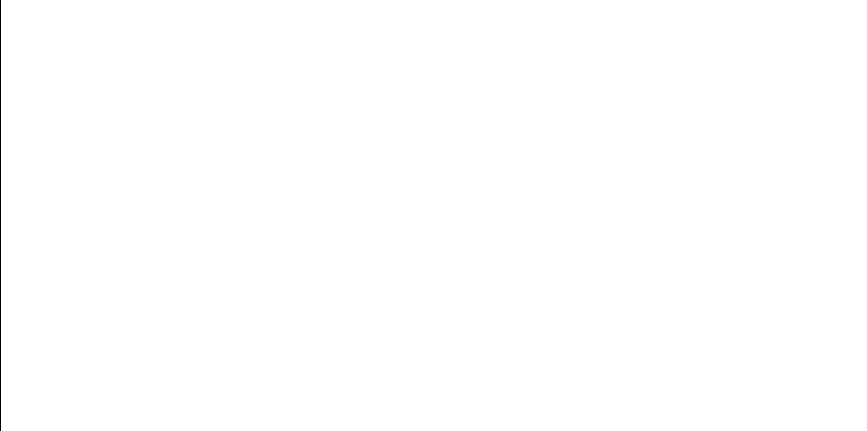

710.744875268 301.12844773
607.469418182 189.885044012
506.47193647 158.095499844
505.340209252 157.992201216
572.20306267 173.3162848
628.021746508 202.910958468
716.070870594 313.177407255
645.883274133 216.716253917
508.065217963 158.249656334
619.834123617 197.386147396


<IPython.core.display.Javascript object>


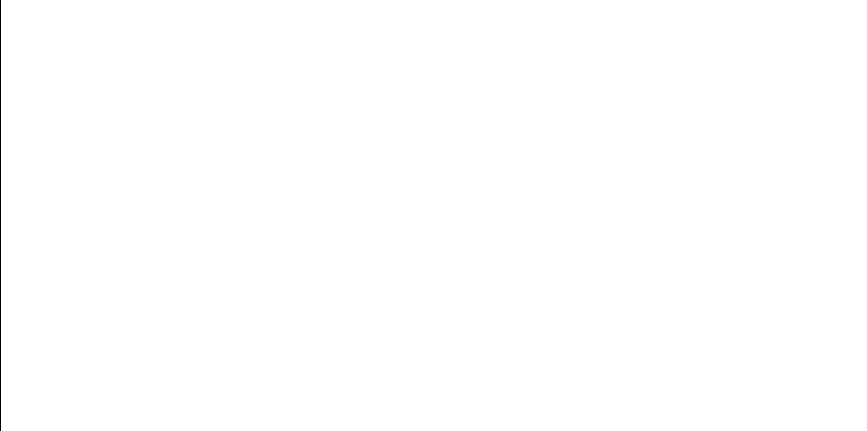

370.920292692 183.296346485
704.695400204 289.187022705
636.931285915 209.477672386
629.603033546 204.032806149
683.835227905 256.785640518
729.889984076 358.509052662
580.515987364 176.632549163
690.205079895 265.577355813
658.750972252 228.402115869
535.804801635 162.594535523


<IPython.core.display.Javascript object>


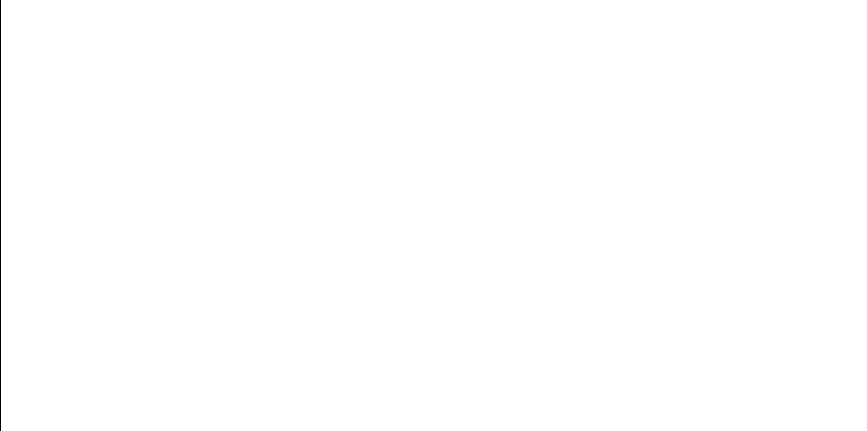

435.50470737 161.516268862
698.730141374 278.7521359
413.919907182 166.653263327
496.421060272 157.357644382
688.249323357 262.792218876
642.007965392 213.499445162
500.531963591 157.610600357
675.951318767 246.908085995
487.15246586 157.03421457
677.586775587 248.875090112


<IPython.core.display.Javascript object>


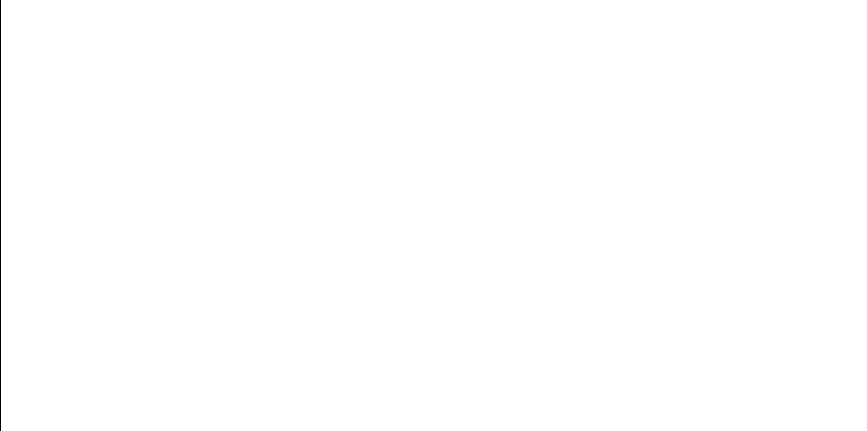

716.626998846 314.541409019
673.522075937 244.05959082
562.626254829 169.910770753
534.94755658 162.412386026
730.225129548 360.176488042
555.016184742 167.509484378
461.366009446 157.930347408
595.765090842 183.637992804
446.915775801 159.596854944
632.731180699 206.306700835


<IPython.core.display.Javascript object>


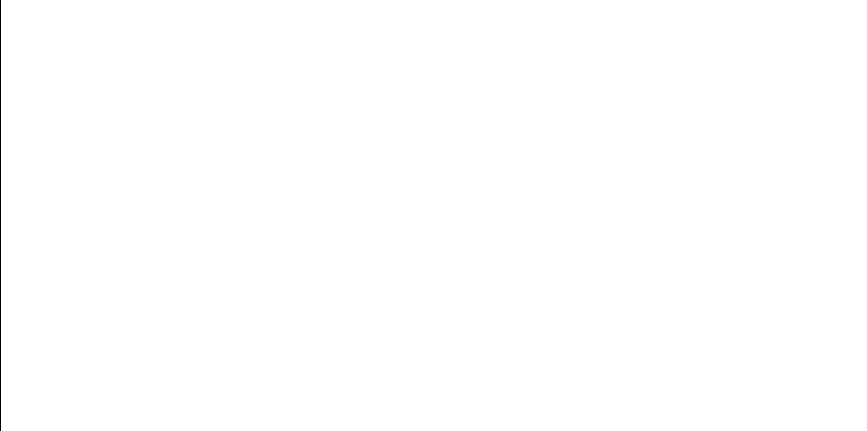

702.898457304 285.920072818
636.478979068 209.129534488
697.56494517 276.841442562
685.150740122 258.537119965
695.786035176 273.99591401
638.28148234 210.526673726
707.877203781 295.271185622
619.092046807 196.90814538
647.008793654 217.675365924
495.101502795 157.290735907


<IPython.core.display.Javascript object>


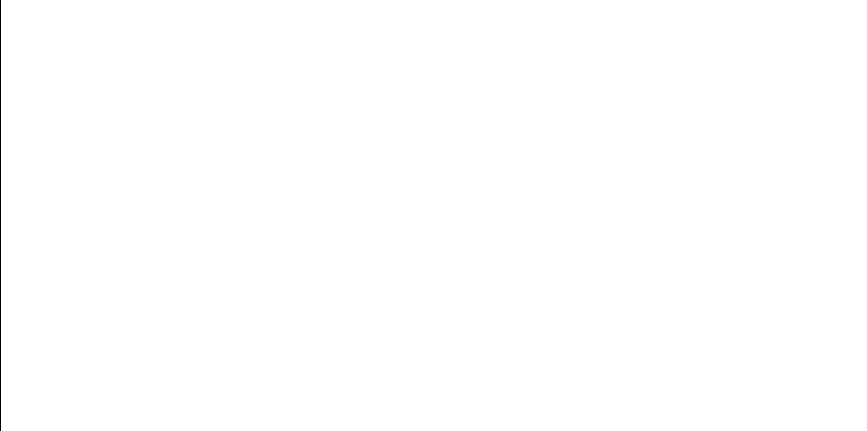

621.396831279 198.404850265
468.25948423 157.431486082
723.99006996 335.326489289
652.161753665 222.215897097
589.315330712 180.524507976
678.018198622 249.400807626
731.652164027 368.059783532
607.654571403 189.990324807
600.431741102 186.034114309
605.124416296 188.569450973


<IPython.core.display.Javascript object>


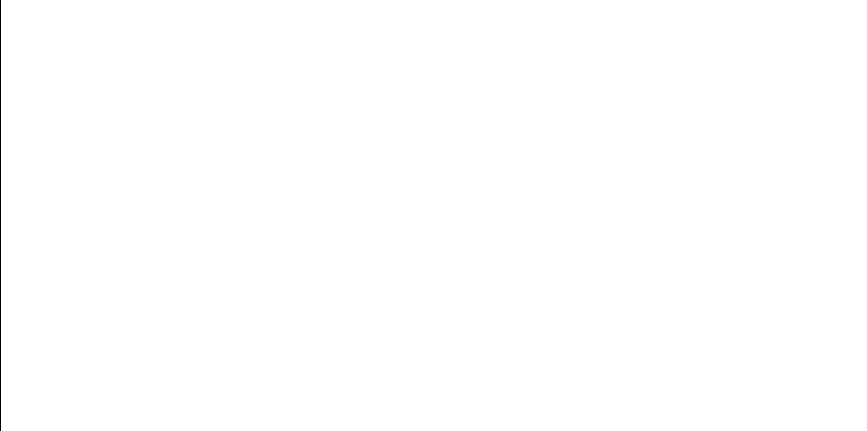

726.987397925 345.959142982
655.346528475 225.150403529
445.195922083 159.851747562
598.449676864 185.00140154
453.373361502 158.747602826
682.191014417 254.640226174
619.800957022 197.364704839
453.371087371 158.747872064
603.333358743 187.586624673
446.915775801 159.596854944


<IPython.core.display.Javascript object>


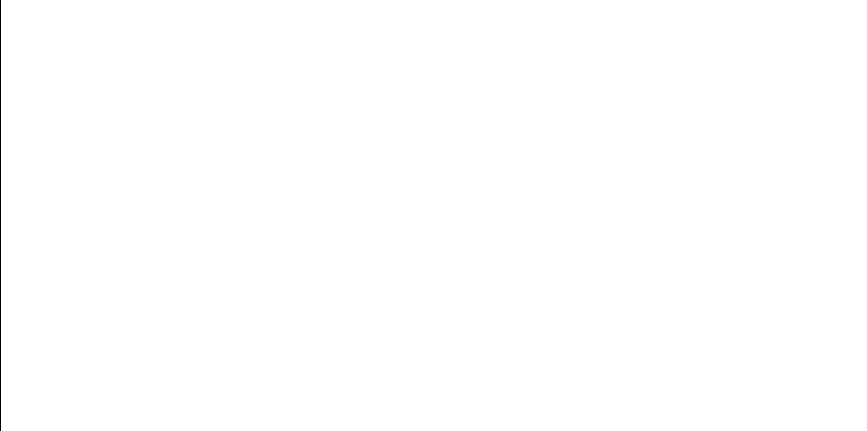

417.160337338 165.752926388
517.288523359 159.343641848
518.820779184 159.558881139
598.449676864 185.00140154
582.63214297 177.531997704
594.497801764 183.008318291
577.762082992 175.495936594
357.246804789 190.619291387
587.6041506 179.73602185
613.98821256 193.718583779


<IPython.core.display.Javascript object>


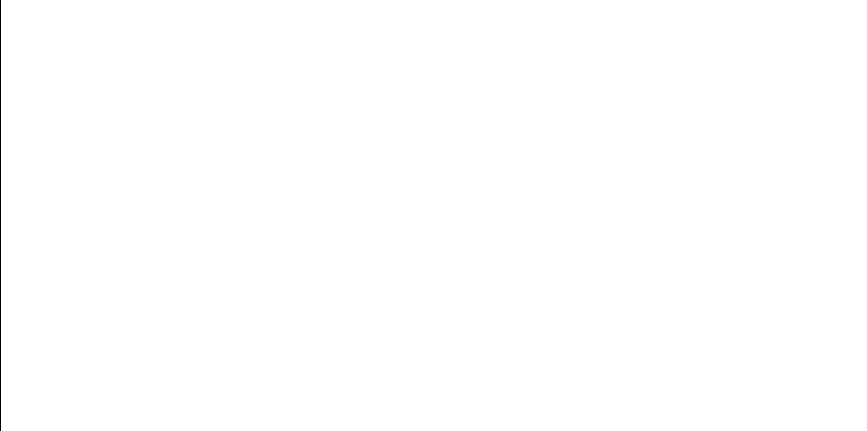

709.700621434 298.950791726
650.513184699 220.736001976
673.19204469 243.679141858
719.238098515 321.275654404
394.588072659 173.01836702
514.205847633 158.939617145
684.837069327 258.116609776
421.808430449 164.542249426
623.328466728 199.687025186
544.401715614 164.594948253


<IPython.core.display.Javascript object>


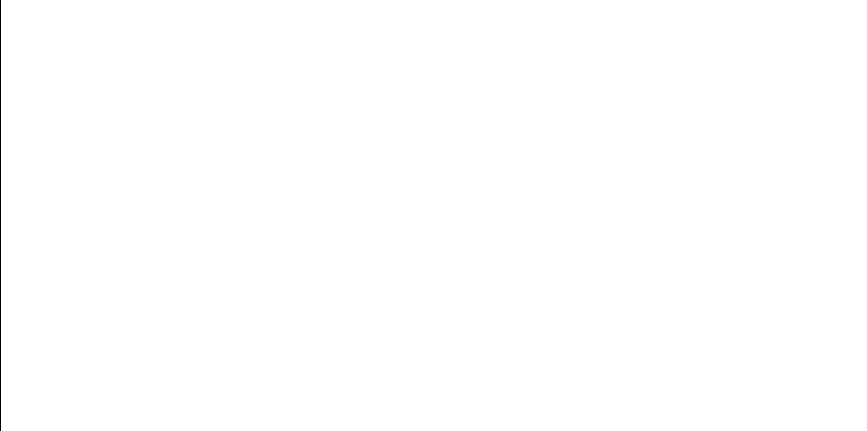

679.145768893 250.788630796
465.973668408 157.575848351
631.436441074 205.356627996
648.637435693 219.083597609
595.758713623 183.634801928
634.312893877 207.484719818
658.25979686 227.925419772
638.059749891 210.353394281
524.684929676 160.471597925
596.375570693 183.944495802


<IPython.core.display.Javascript object>


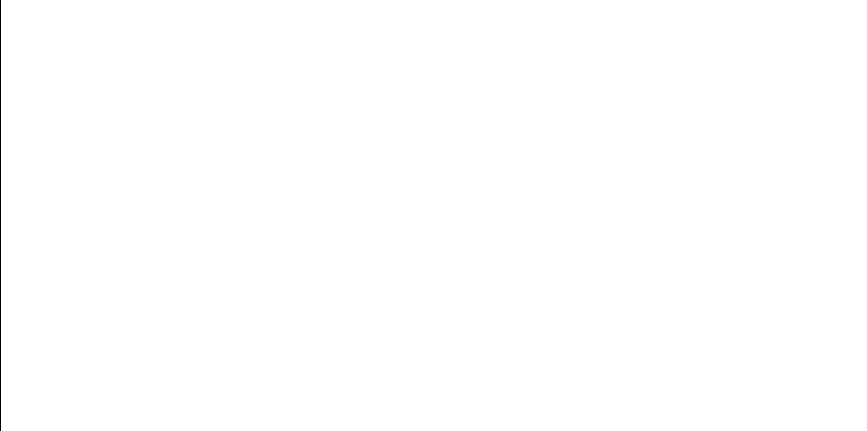

429.319817733 162.783757579
660.982594415 230.601019943
713.870389656 307.990776758
610.453336018 191.607159414
565.278744761 170.81056245
695.639899725 273.765858435
700.683684841 282.044049553
542.70051951 164.173841328
727.890520859 349.564044607
648.637435693 219.083597609


<IPython.core.display.Javascript object>


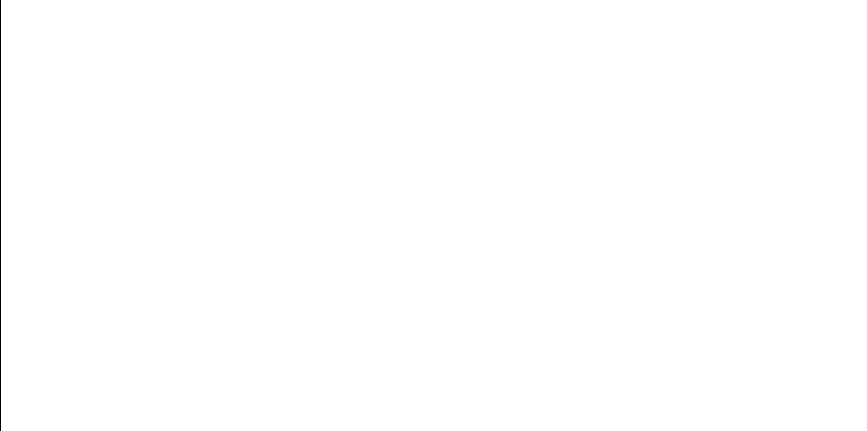

689.380041809 264.392675348
730.705710885 362.676347348
663.270467195 232.913207034
635.832695398 208.634915174
679.145768893 250.788630796
496.421060272 157.357644382
734.985157528 406.26497066
686.388998893 260.215205316
722.683332906 331.180337143
675.951318767 246.908085995


<IPython.core.display.Javascript object>


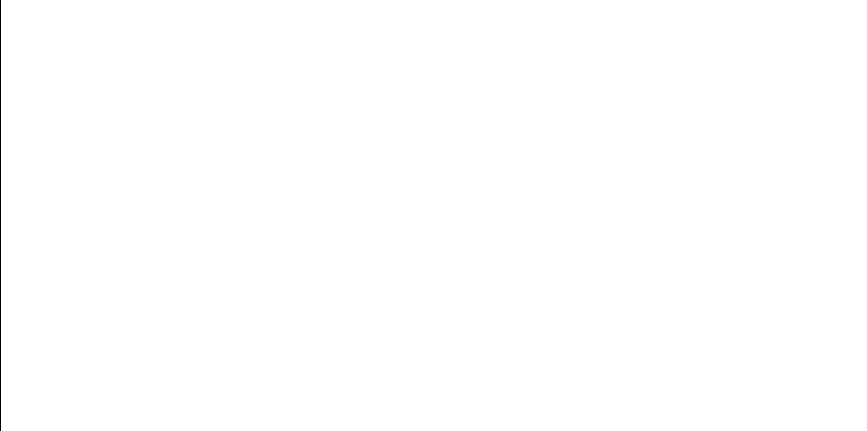

526.343843251 160.755541346
487.15246586 157.03421457
539.616723234 163.442376111
606.931223306 189.580192576
555.30266294 167.595101682
605.218351733 188.621519881
457.244599914 158.319607136
686.388998893 260.215205316
534.94755658 162.412386026
658.559642502 228.216118184


<IPython.core.display.Javascript object>


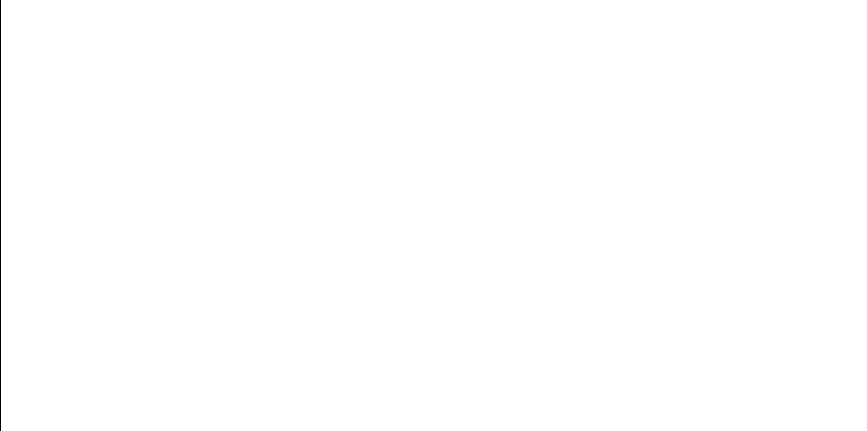

656.433579456 226.175511713
710.216306183 300.019496218
394.588072659 173.01836702
671.747716244 242.032040161
682.975883966 255.658401496
654.487255532 224.348649639
654.568397225 224.424039827
534.786282932 162.378466268
493.673570243 157.226143338
731.652164027 368.059783532


<IPython.core.display.Javascript object>


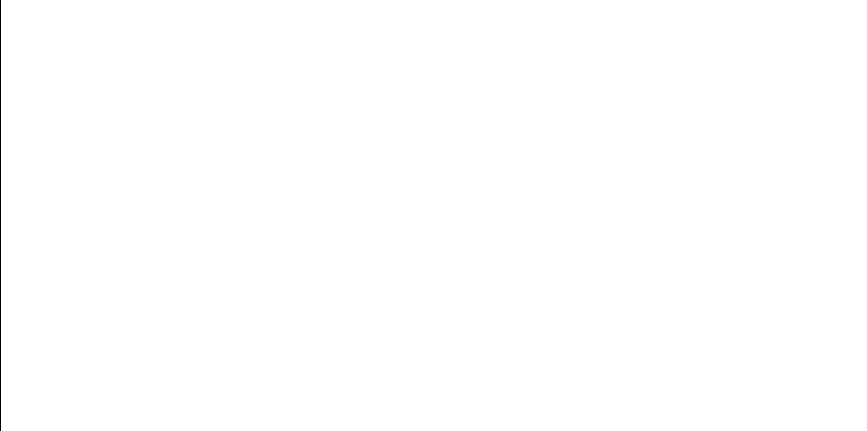

644.868230834 215.860993461
619.092046807 196.90814538
656.646241184 226.37748517
616.99485817 195.576997528
666.631604885 236.42122469
703.530839905 287.056781039
553.489430056 167.059428267
713.7360472 307.684273074
585.033927092 178.580648117
525.645489569 160.634619523


<IPython.core.display.Javascript object>


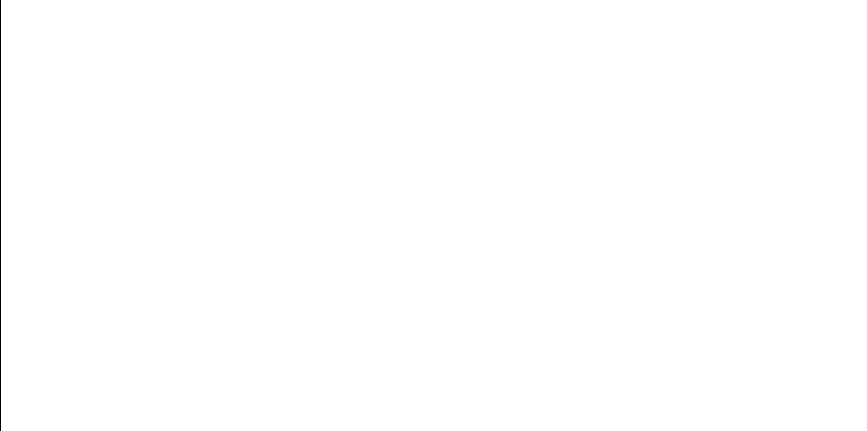

733.820499135 384.646823332
493.21570729 157.207149973
730.705710885 362.676347348
683.744488055 256.665990287
583.873355888 178.070213978
620.15678393 197.595135765
581.521813214 177.057221882
501.464420481 157.677368356
644.97373897 215.949468055
728.772502514 353.323460883


<IPython.core.display.Javascript object>


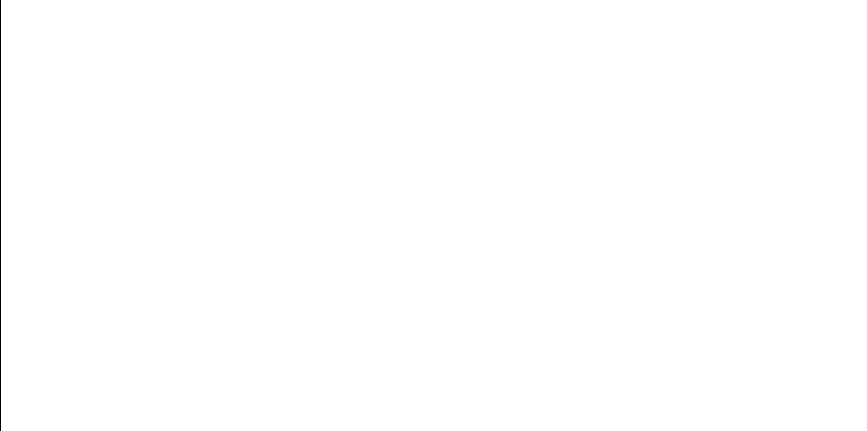

466.677406109 157.529180761
635.198081042 208.152435596
592.47654486 182.02227835
536.055374147 162.64836661
521.942076996 160.02708051
724.947030755 338.532743002
689.281996479 264.252848288
685.639737364 259.196339027
619.220602998 196.99069049
585.005016644 178.567848208


<IPython.core.display.Javascript object>


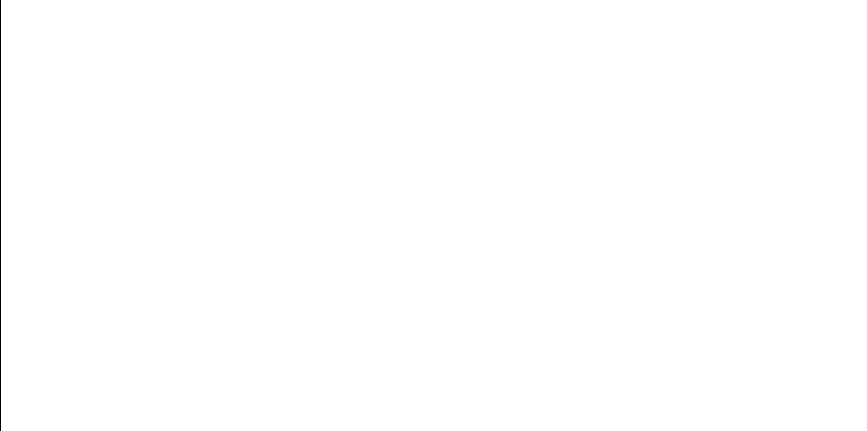

660.667488864 230.287204149
688.57638859 263.252449577
442.011281126 160.355826682
484.159884092 157.002669322
697.56494517 276.841442562
469.973700028 157.33690078
468.25948423 157.431486082
598.298168472 184.923378402
699.683371386 280.344193428
528.088046039 161.066403841


<IPython.core.display.Javascript object>


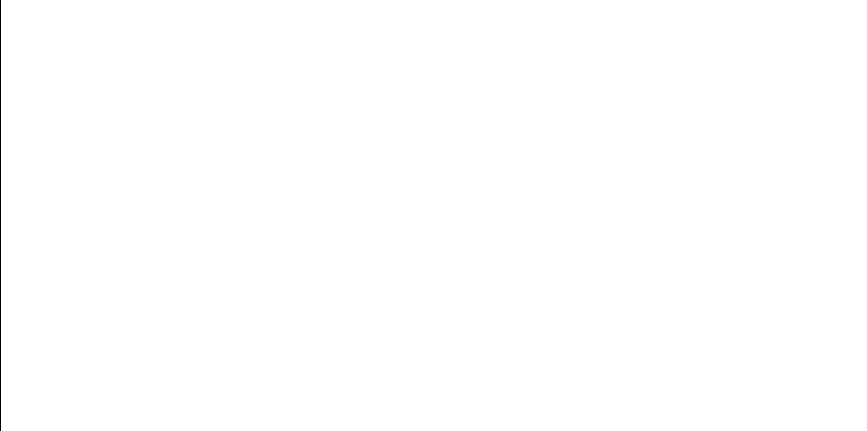

733.681199596 383.252453141
461.687049728 157.902890995
603.333358743 187.586624673
618.556610402 196.565526865
677.663374309 248.96821971
456.856568265 158.359777815
555.407348018 167.626480423
503.782210332 157.858407002
679.869649694 251.690302176
722.574150889 330.844857969


<IPython.core.display.Javascript object>


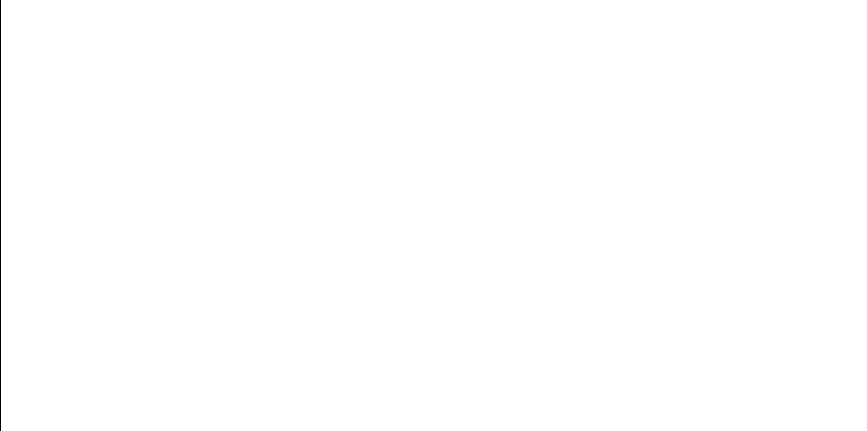

525.645489569 160.634619523
675.099422446 245.899381068
713.650583114 307.489860067
658.559642502 228.216118184
627.863669533 202.799812684
545.133989149 164.780083956
402.580204013 170.176516202
687.928122247 262.342355425
620.15678393 197.595135765
732.045940878 370.527680961


<IPython.core.display.Javascript object>


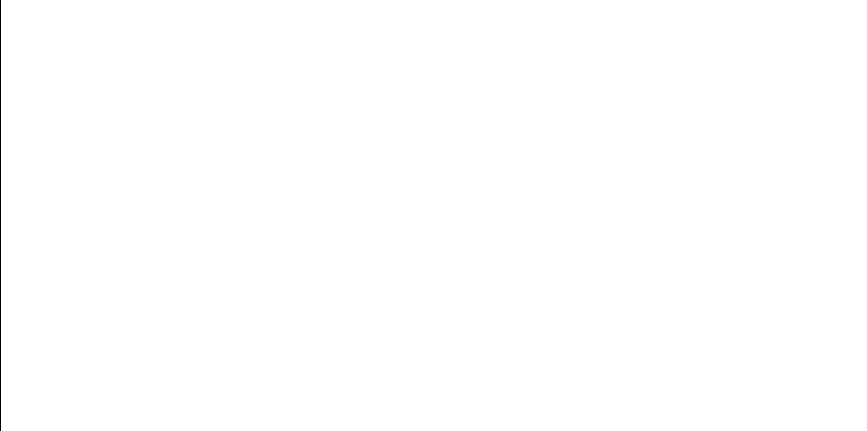

715.711655036 312.308296063
613.265041897 193.280230717
651.136713581 221.29265985
731.885823736 369.505104843
685.150740122 258.537119965
606.723154346 189.462802517
643.528358023 214.745923414
598.449676864 185.00140154
584.098175667 178.16854877
704.554104037 288.925943749


<IPython.core.display.Javascript object>


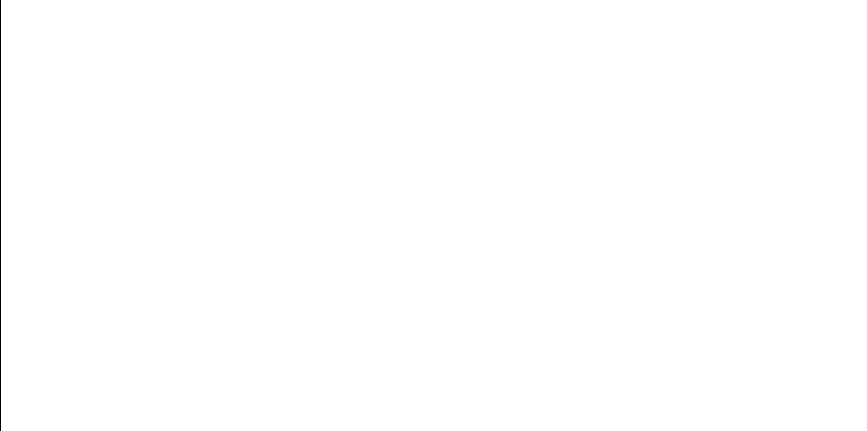

720.30978926 324.217549448
660.576043839 230.196340489
566.99142152 171.409088745
365.151284314 186.254225155
536.72342536 162.793189437
550.22999548 166.133518764
489.88214846 157.093993655
634.216741558 207.412557255
503.289631004 157.818131877
573.129370379 173.668963808


<IPython.core.display.Javascript object>


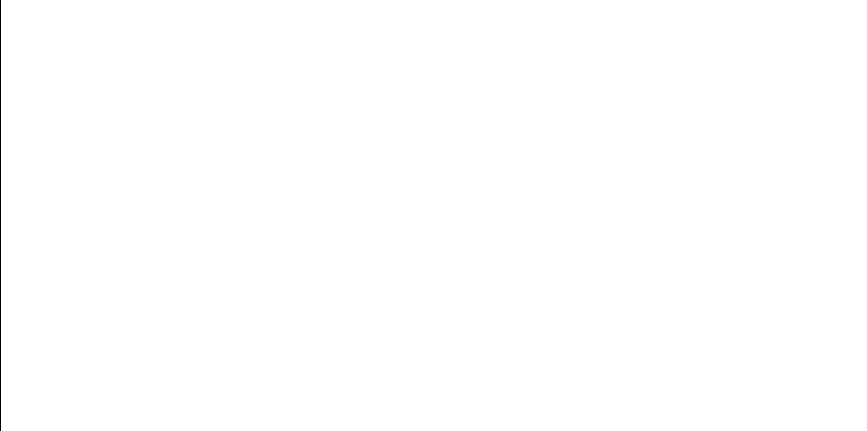

394.588072659 173.01836702
715.840437364 312.618825863
716.626998846 314.541409019
727.734617768 348.92532259
724.428860763 336.777391415
732.871937535 376.319503787
715.711655036 312.308296063
692.979042809 269.670169809
676.145278095 247.139252598
491.383487952 157.139488745


<IPython.core.display.Javascript object>


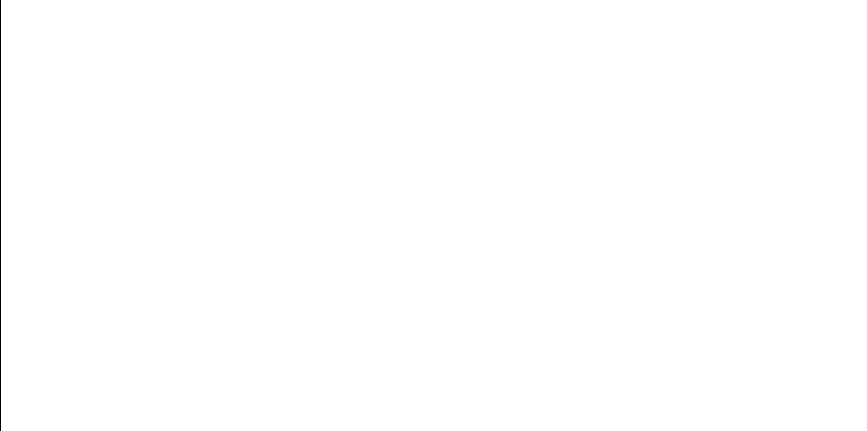

637.118184867 209.622004491
615.640230497 194.732482038
701.156951155 282.859028612
715.711655036 312.308296063
481.250657621 157.006071896
469.914149595 157.339990227
634.714515168 207.786914225
591.545958539 181.575782106
733.467474367 381.25032821
603.793337058 187.837232513


<IPython.core.display.Javascript object>


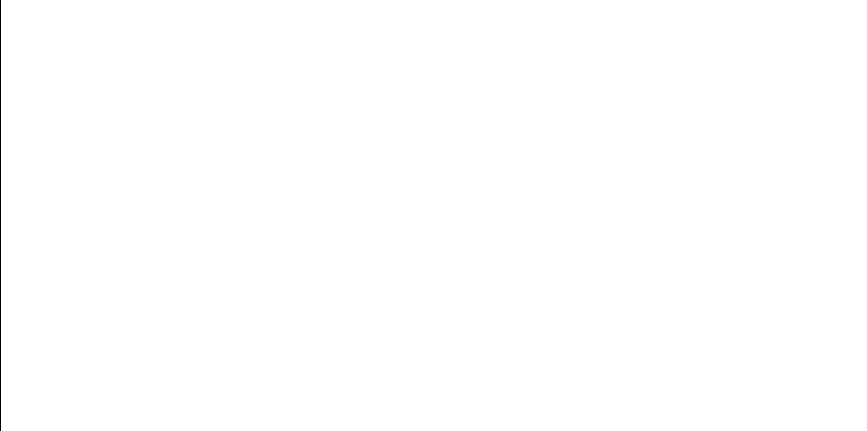

723.99006996 335.326489289
703.305241878 286.649681647
673.005818703 243.46514307
603.83519106 187.86009722
485.026911919 157.008151663
541.180938088 163.80828227
655.869881025 225.642414298
625.968449796 201.481272259
713.177530541 306.421715581
496.421060272 157.357644382


<IPython.core.display.Javascript object>


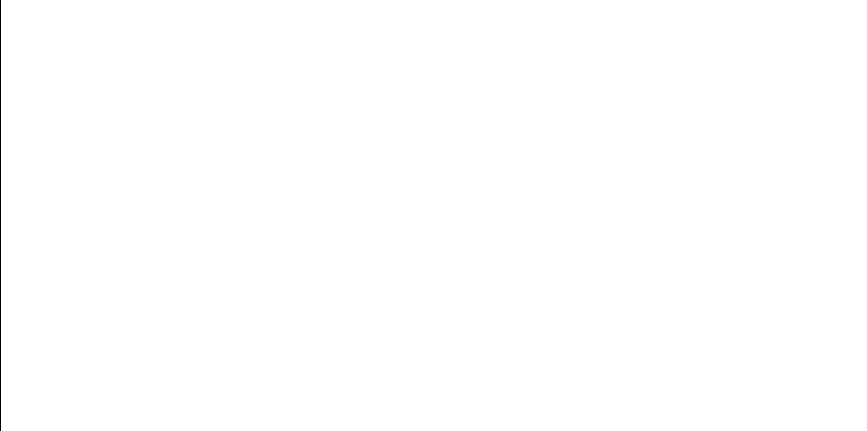

635.25497884 208.195564246
731.264234634 365.769573199
539.616723234 163.442376111
734.692153087 396.547687993
522.721430079 160.150230074
504.478833786 157.917026266
676.731756661 247.841672691
689.281996479 264.252848288
663.665365067 233.318396338
679.49155761 251.218290705


<IPython.core.display.Javascript object>


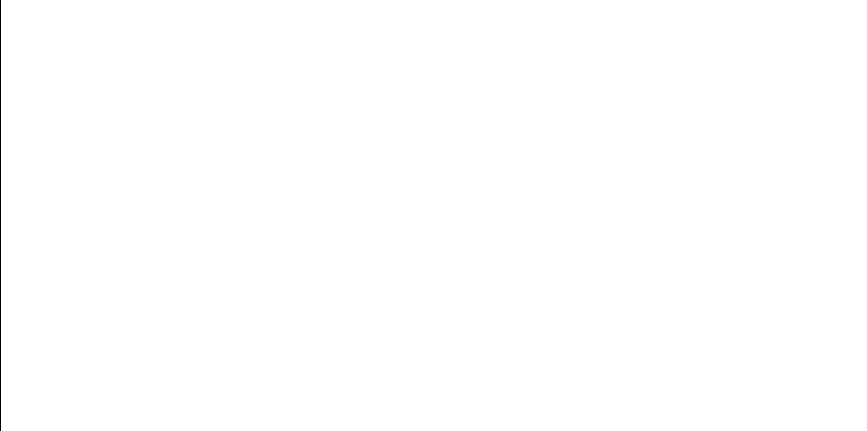

664.135349384 233.80301029
696.186720357 274.629533515
576.804090629 175.109443155
664.09701249 233.76338263
465.588843977 157.602204373
660.144060312 229.768356878
620.15678393 197.595135765
561.181859296 169.434566606
420.191466579 164.952692845
660.667488864 230.287204149


<IPython.core.display.Javascript object>


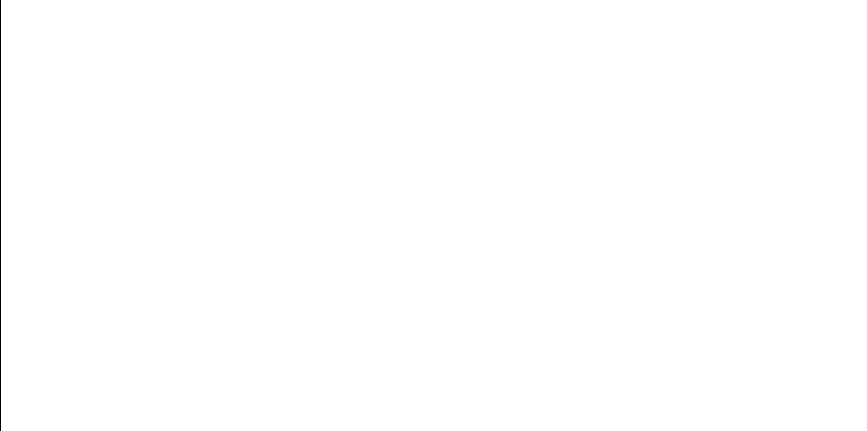

573.129370379 173.668963808
539.616723234 163.442376111
683.514428176 256.363293755
634.066084144 207.29963257
565.278744761 170.81056245
697.375618818 276.534555237
572.20306267 173.3162848
642.007965392 213.499445162
627.164517861 202.31039748
732.828322885 375.987743422


<IPython.core.display.Javascript object>


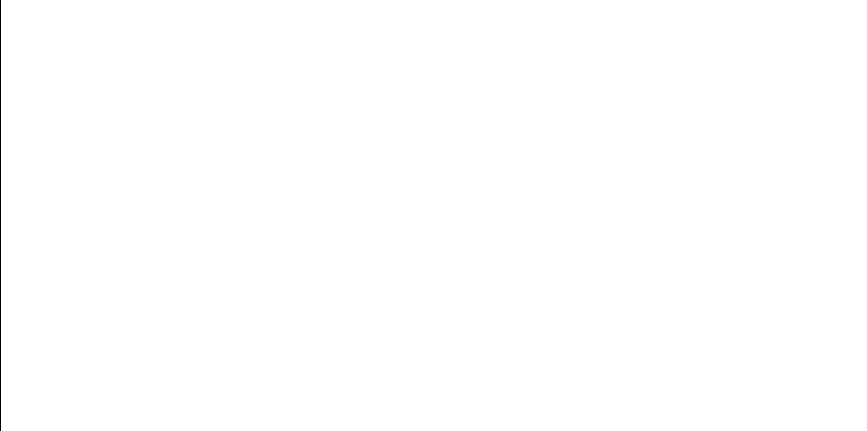

496.326433551 157.352615414
577.565777282 175.416366654
557.664194933 168.315023329
631.487982468 205.394206707
730.499583501 361.587383887
485.433162465 157.01174686
522.397667766 160.098767029
691.65006625 267.687757593
695.057238994 272.854021763
557.664194933 168.315023329


<IPython.core.display.Javascript object>


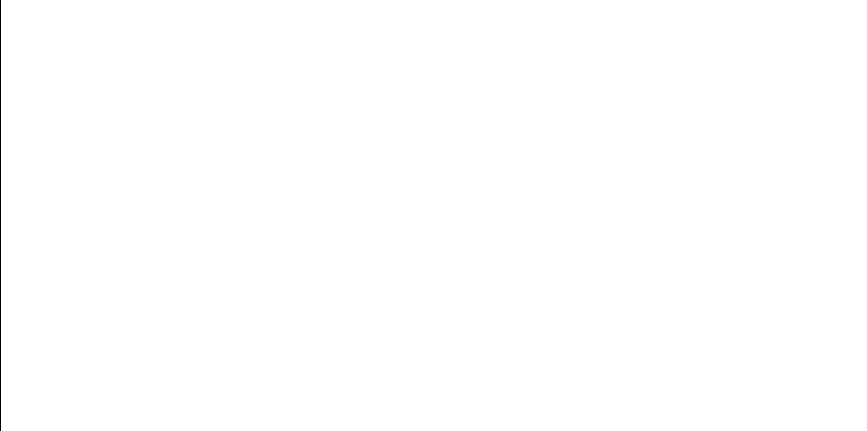

584.060938249 178.152243329
728.772502514 353.323460883
633.745582704 207.059985899
631.436441074 205.356627996
651.763696912 221.856165999
704.978866881 289.713023937
600.431741102 186.034114309
573.620634048 173.857701201
723.99006996 335.326489289
413.919907182 166.653263327


<IPython.core.display.Javascript object>


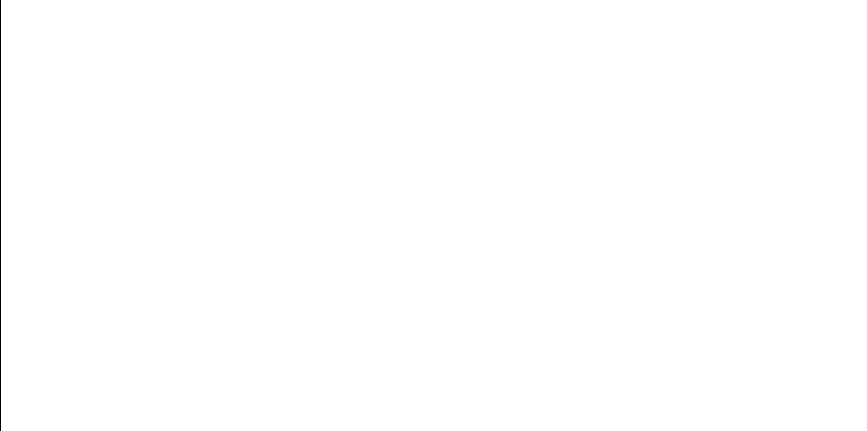

498.690552147 157.488953377
671.747716244 242.032040161
591.176327494 181.399731613
663.460969694 233.108446999
639.537746435 211.51599067
718.378710479 318.99520761
610.991383036 191.923502266
690.587498376 266.131422217
531.002718404 161.614189926
620.15678393 197.595135765


<IPython.core.display.Javascript object>


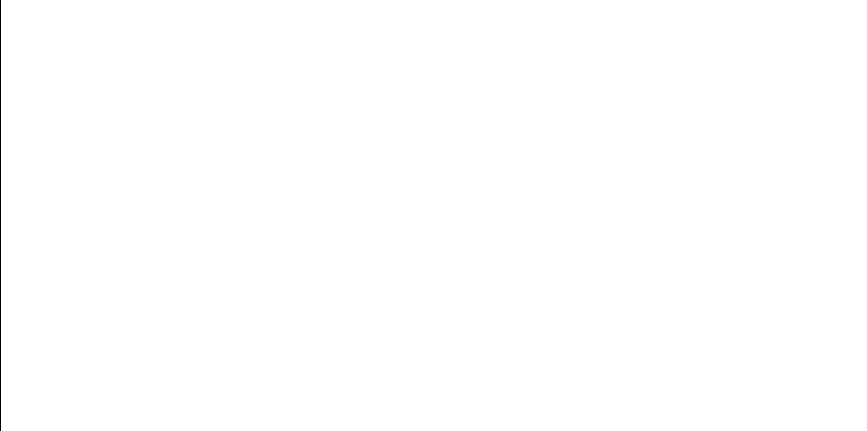

626.519226947 201.8618058
679.109726202 250.743956549
649.606342959 219.933010587
621.331416614 198.361876248
634.066084144 207.29963257
571.905829366 173.204000236
547.568843487 165.412511711
648.186870299 218.691571703
677.637132926 248.936304909
457.540803871 158.289351378


<IPython.core.display.Javascript object>


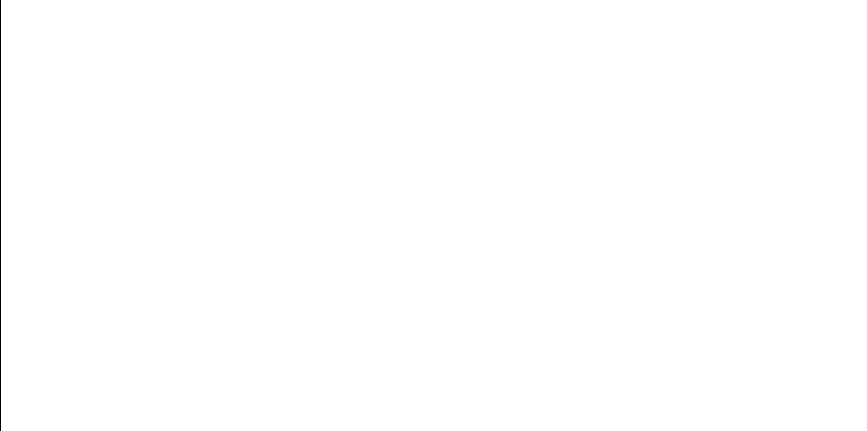

714.563524292 309.590069824
595.31716857 183.414420575
540.081077342 163.549901997
719.238098515 321.275654404
516.409998341 159.22455683
617.259289614 195.743245939
733.681199596 383.252453141
574.773207946 174.305137885
602.164977238 186.955616599
628.021746508 202.910958468


<IPython.core.display.Javascript object>


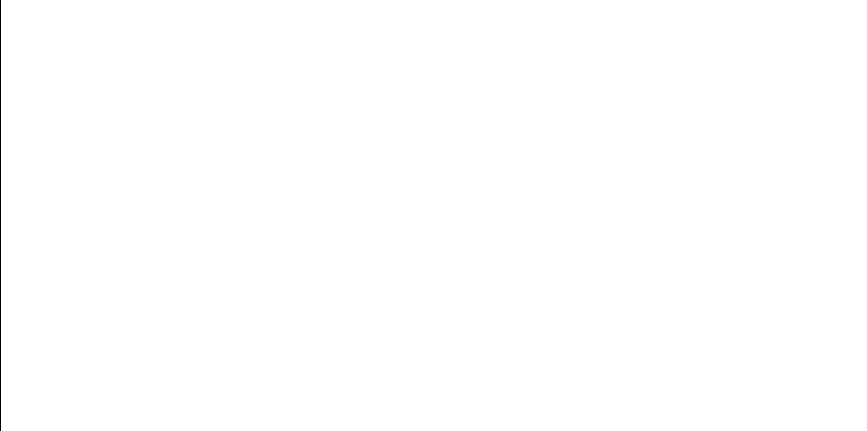

442.552365111 160.267234101
733.436912002 380.975847792
569.156224878 172.185505269
391.45654793 174.215425585
717.26329987 316.130702954
695.057238994 272.854021763
608.088218225 190.237714262
596.963964626 184.241874971
732.937920721 376.828027947
635.25497884 208.195564246


<IPython.core.display.Javascript object>


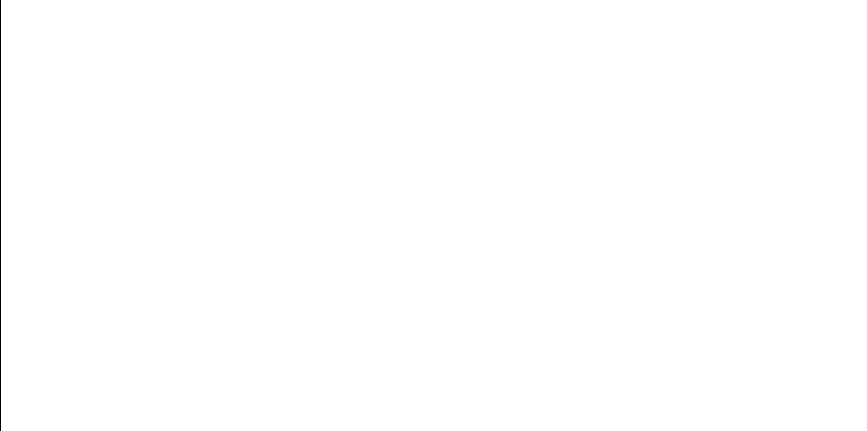

697.871786789 277.3409128
723.053108358 332.328589633
677.637132926 248.936304909
718.030422701 318.089602328
546.842777652 165.221207359
524.386492682 160.421726164
573.081961171 173.650812044
630.00766747 204.322825638
670.491693027 240.622848801
670.446779652 240.572850175


<IPython.core.display.Javascript object>


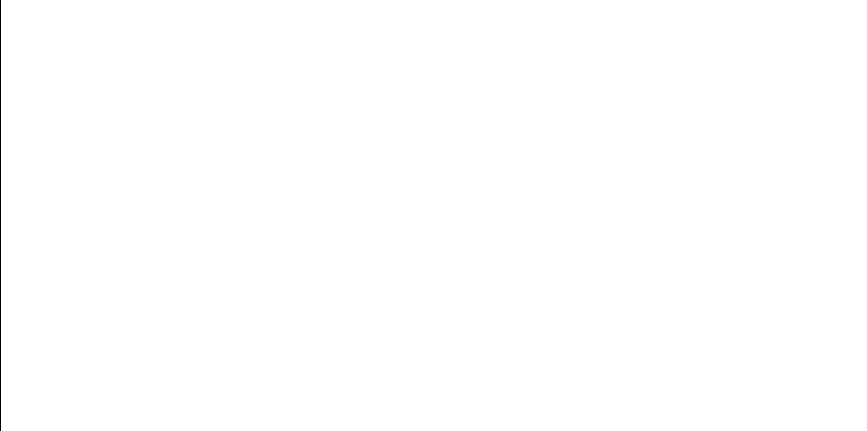

596.375570693 183.944495802
534.805916558 162.382589808
656.156378267 225.912947848
677.637132926 248.936304909
600.138943943 185.88014922
547.018952472 165.267413495
673.67855792 244.240516056
679.71613339 251.498371868
445.234141625 159.845951385
625.70728929 201.301589839


<IPython.core.display.Javascript object>


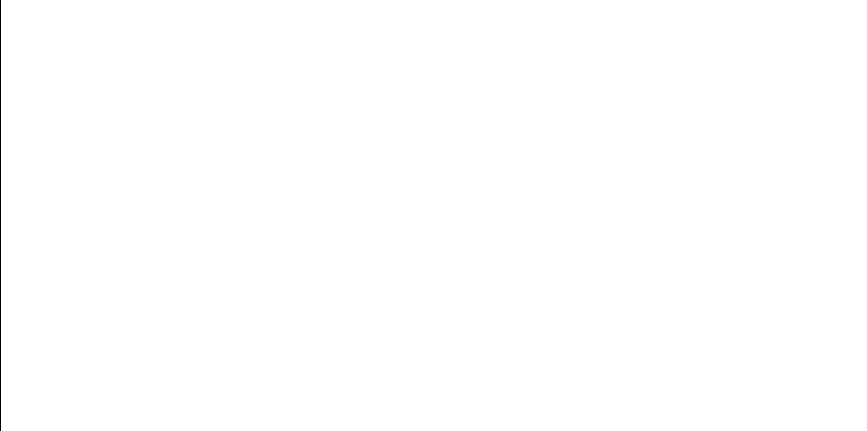

675.951318767 246.908085995
701.156951155 282.859028612
454.732603572 158.590426902
481.866501482 157.002549257
606.845804254 189.531968686
700.683684841 282.044049553
618.556610402 196.565526865
733.587845972 382.359214522
573.315075269 173.740170919
448.481754203 159.375300286


<IPython.core.display.Javascript object>


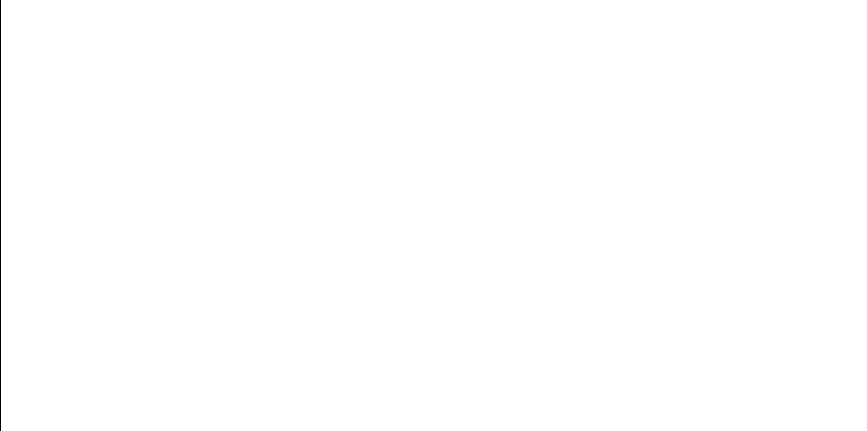

612.60641272 192.883878941
634.183784871 207.387839672
574.959629309 174.378119994
673.522075937 244.05959082
466.677406109 157.529180761
619.161241227 196.952560998
718.378710479 318.99520761
635.25497884 208.195564246
731.885823736 369.505104843
733.820499135 384.646823332


<IPython.core.display.Javascript object>


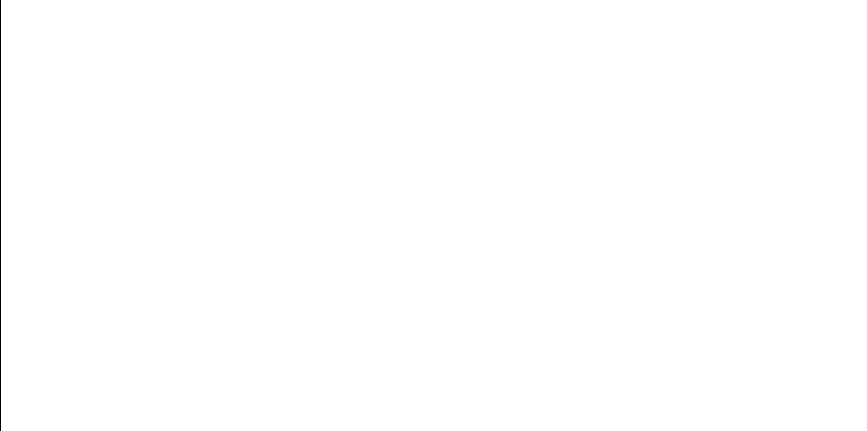

637.93832128 210.258669123
734.95305123 404.135847881
631.790624535 205.615265936
560.247590196 169.131682357
647.747486778 218.311076356
531.002718404 161.614189926
695.057238994 272.854021763
734.764793908 398.11475546
630.29904263 204.532418119
596.375570693 183.944495802


<IPython.core.display.Javascript object>


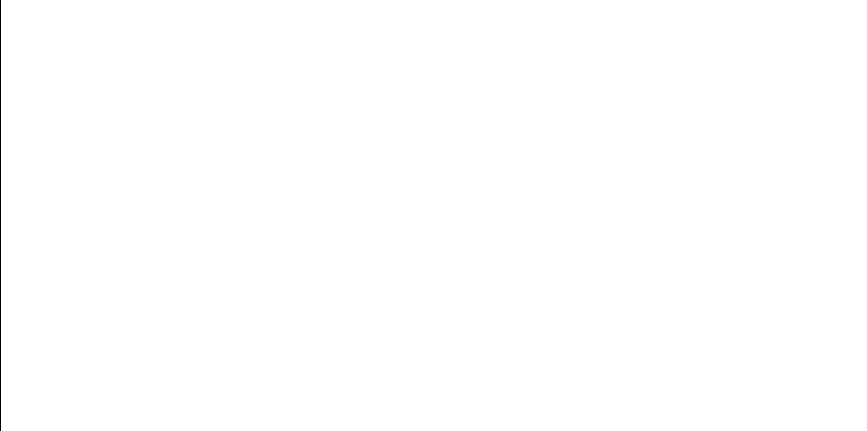

646.345523957 217.108781328
501.694504553 157.694378297
678.651193333 250.177424314
409.850662398 167.850307053
510.480888879 158.502892738
732.937920721 376.828027947
683.744488055 256.665990287
519.568559884 159.667410016
587.6041506 179.73602185
616.99485817 195.576997528


<IPython.core.display.Javascript object>


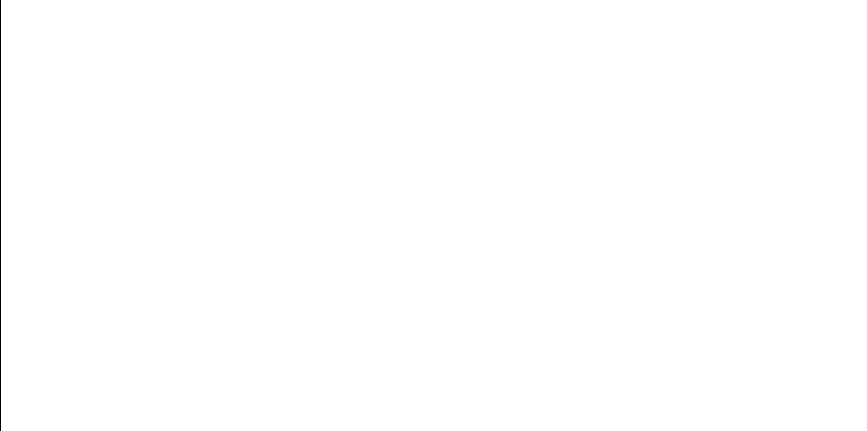

448.9413233 159.312181832
734.764793908 398.11475546
547.568843487 165.412511711
615.771995257 194.814105797
687.643595473 261.945592273
679.71613339 251.498371868
654.927801526 224.758769374
590.552475553 181.104267257
730.362655393 360.878105641
582.120189596 177.312305


<IPython.core.display.Javascript object>


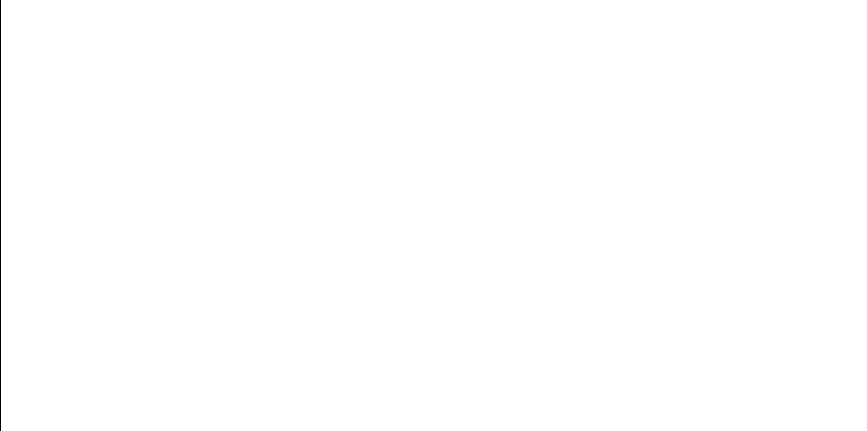

441.447737971 160.449382378
649.738656172 220.049687648
588.180729351 179.999969054
534.786282932 162.378466268
622.96459906 199.443537418
652.161753665 222.215897097
555.016184742 167.509484378
719.158100618 321.060523584
586.523200534 179.245898946
553.469351025 167.053579142


<IPython.core.display.Javascript object>


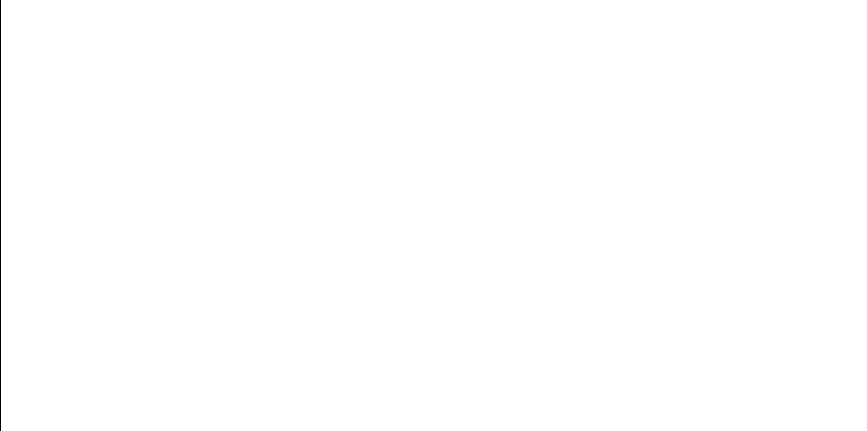

563.798607795 170.304409386
723.952065486 335.202289073
520.914606866 159.868543563
683.222822328 255.980976937
685.310013116 258.751344122
734.878001515 401.159569342
556.185779478 167.861364186
573.521237493 173.819419248
667.091060941 236.911414435
503.112403957 157.803878997


<IPython.core.display.Javascript object>


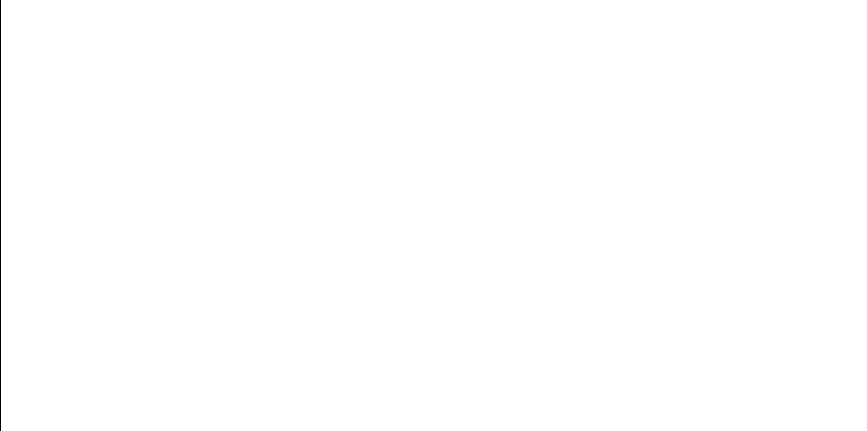

548.61690485 165.692741995
493.447327468 157.216653949
651.136713581 221.29265985
544.239780611 164.554322454
717.26329987 316.130702954
648.637435693 219.083597609
688.249323357 262.792218876
494.376273795 157.256915895
485.433162465 157.01174686
489.88214846 157.093993655


<IPython.core.display.Javascript object>


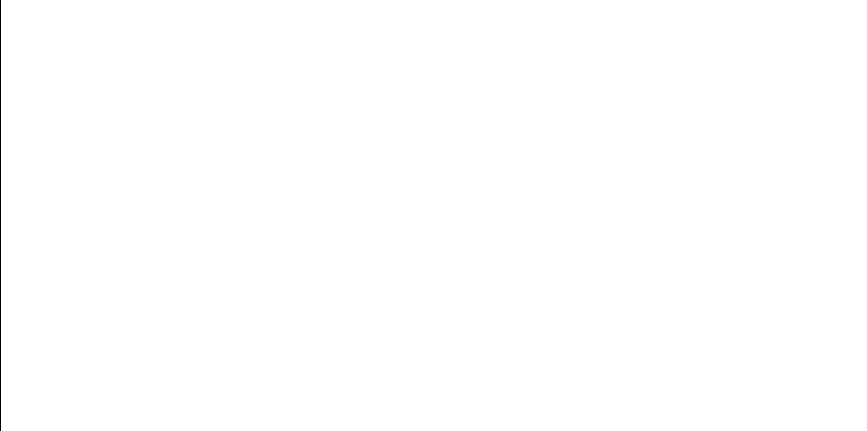

561.181859296 169.434566606
580.588257484 176.662891467
672.359496714 242.726186655
603.333358743 187.586624673
710.51089356 300.635830131
656.433579456 226.175511713
408.349921663 168.310644597
685.150740122 258.537119965
733.681199596 383.252453141
469.973700028 157.33690078


<IPython.core.display.Javascript object>


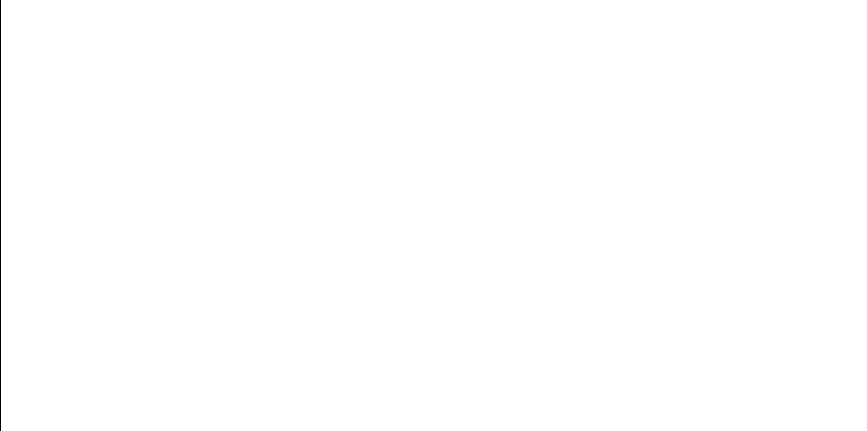

647.296691022 217.922535816
642.557003589 213.947282496
675.241380112 246.066726012
611.253983831 192.078549628
651.957267326 222.030906785
608.684406605 190.579694313
487.712469532 157.044066093
586.540183982 179.253552147
594.497801764 183.008318291
502.579690085 157.761794832


<IPython.core.display.Javascript object>


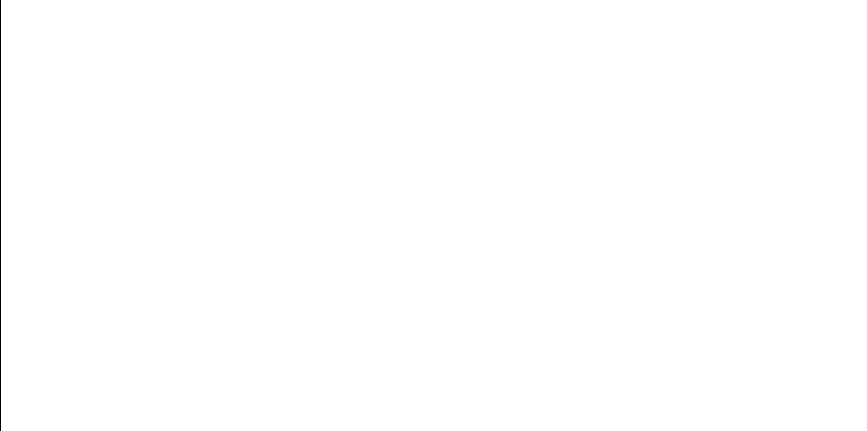

677.354714963 248.593501467
603.212880047 187.521189567
472.66162822 157.21215663
547.568843487 165.412511711
613.98821256 193.718583779
690.30562391 265.722722334
688.57638859 263.252449577
608.684406605 190.579694313
536.055374147 162.64836661
711.234950359 302.169258009


<IPython.core.display.Javascript object>


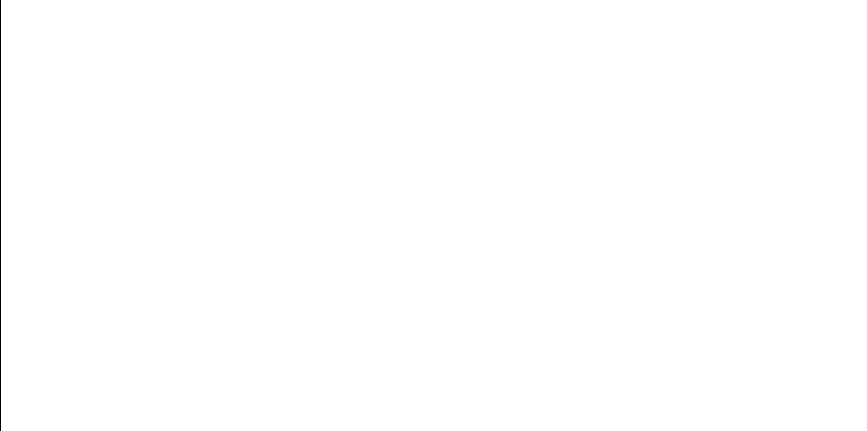

602.023066827 186.879515661
650.479321419 220.705876626
656.646241184 226.37748517
621.396831279 198.404850265
534.805916558 162.382589808
733.587845972 382.359214522
643.493542871 214.717157997
726.446804013 343.902737264
525.645489569 160.634619523
612.265103746 192.679559557


<IPython.core.display.Javascript object>


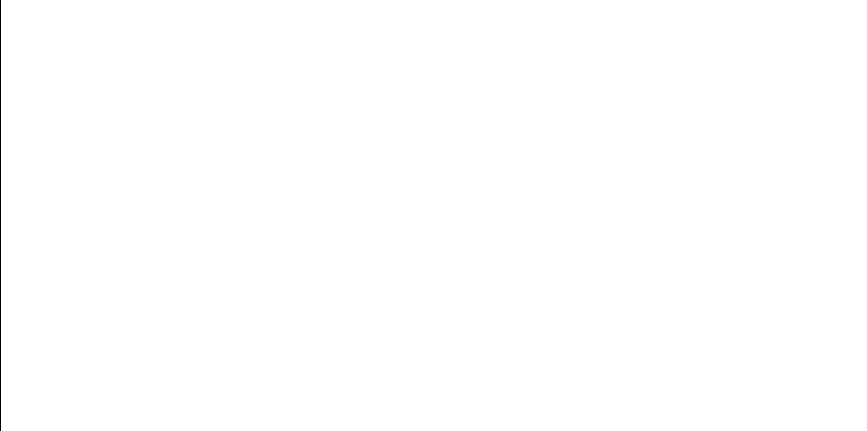

571.905829366 173.204000236
456.570591086 158.389772067
734.782729145 398.537815507
590.12076919 180.901028481
536.311947973 162.703763319
637.93832128 210.258669123
639.537746435 211.51599067
323.792163697 213.6621776
624.828892716 200.700779668
498.369226152 157.469113452


<IPython.core.display.Javascript object>


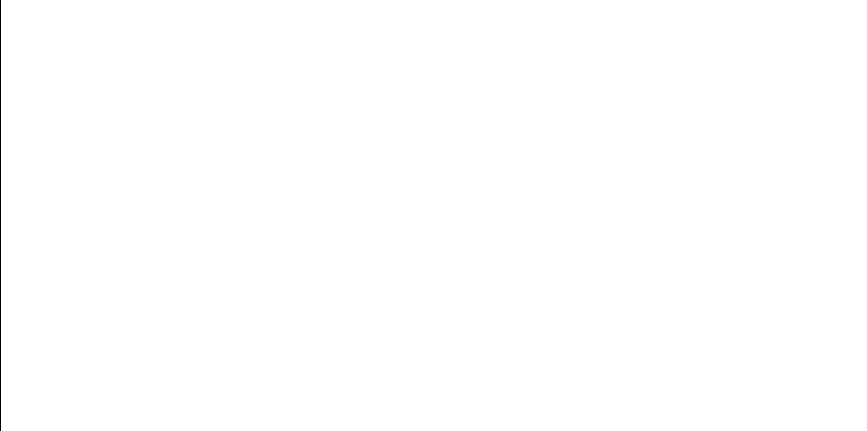

484.123215938 157.002503215
555.393811982 167.62242029
613.98821256 193.718583779
396.443400709 172.331550224
488.604019077 157.062319273
720.30978926 324.217549448
489.88214846 157.093993655
671.747716244 242.032040161
611.317844832 192.116319891
601.885257221 186.805725512


<IPython.core.display.Javascript object>


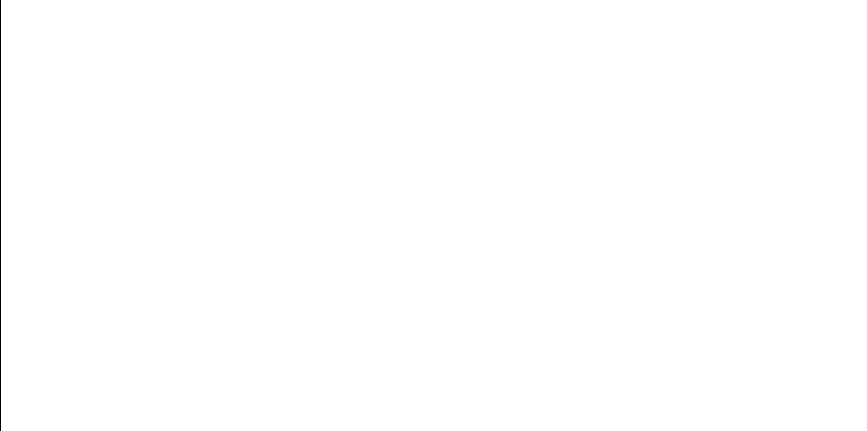

522.117781582 160.054626144
667.091060941 236.911414435
702.286569493 284.833174963
621.172630646 198.257683081
724.947030755 338.532743002
650.479321419 220.705876626
703.530839905 287.056781039
591.176327494 181.399731613
514.426090786 158.967200516
734.782729145 398.537815507


<IPython.core.display.Javascript object>


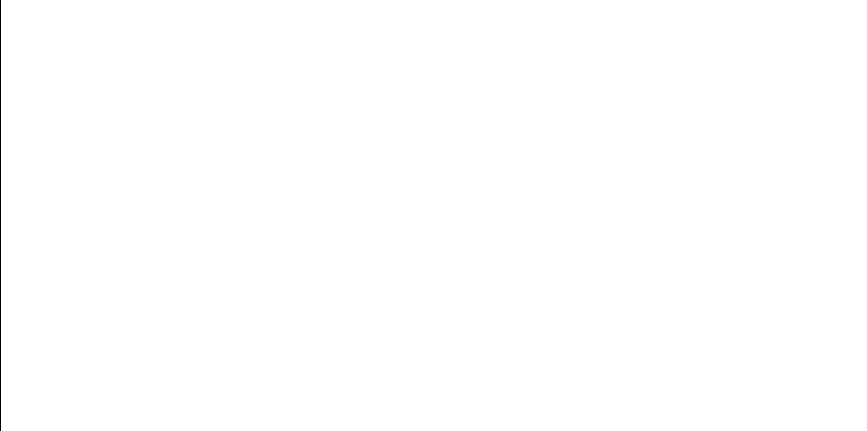

671.714536693 241.994540087
429.319817733 162.783757579
648.345016089 218.828956845
734.317931857 390.471720881
647.296691022 217.922535816
732.828322885 375.987743422
718.503026303 319.320991296
588.459895764 180.128397599
550.22999548 166.133518764
619.220602998 196.99069049


<IPython.core.display.Javascript object>


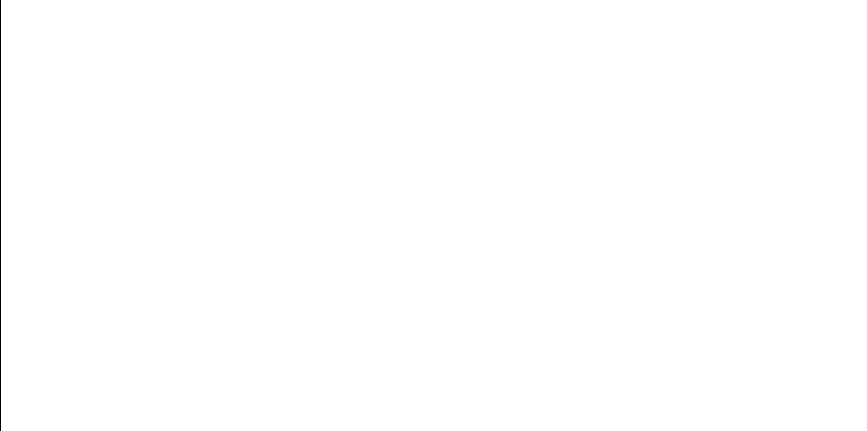

473.871709135 157.165383027
553.469351025 167.053579142
679.109726202 250.743956549
654.248214753 224.126938296
713.177530541 306.421715581
723.312414294 333.145247108
621.331416614 198.361876248
690.943704365 266.650374728
365.151284314 186.254225155
711.882282402 303.563285321


<IPython.core.display.Javascript object>


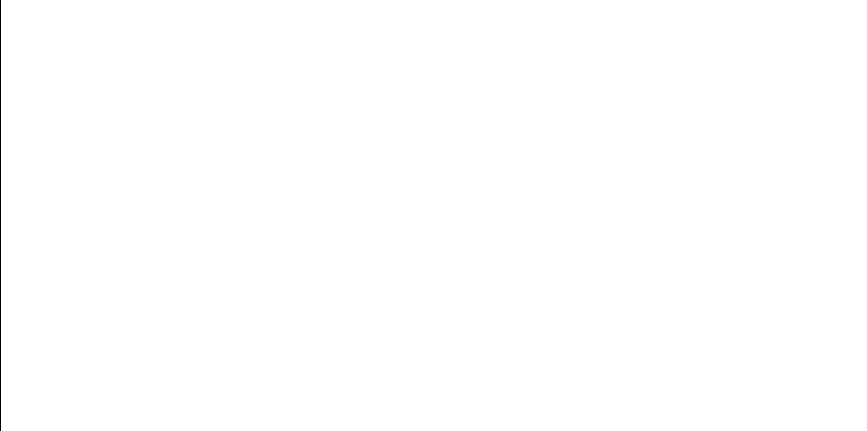

729.710735646 357.640357119
633.946788724 207.210339774
722.574150889 330.844857969
585.033927092 178.580648117
507.252907103 158.169785518
603.333358743 187.586624673
525.645489569 160.634619523
375.883630961 180.898962116
619.834123617 197.386147396
730.16823917 359.889292964


<IPython.core.display.Javascript object>


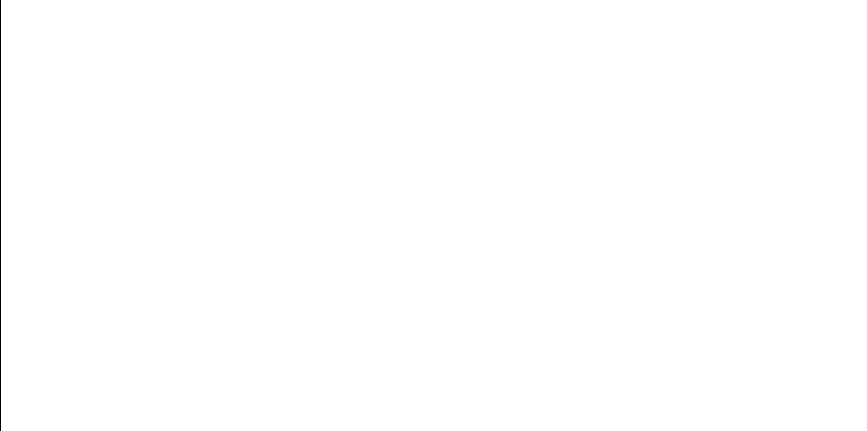

507.252907103 158.169785518
713.981514866 308.245150041
652.161753665 222.215897097
414.672895628 166.43989032
579.913103284 176.380459953
396.443400709 172.331550224
581.947447242 177.238478853
725.220572517 339.478821576
591.176327494 181.399731613
731.520553708 367.268304798


<IPython.core.display.Javascript object>


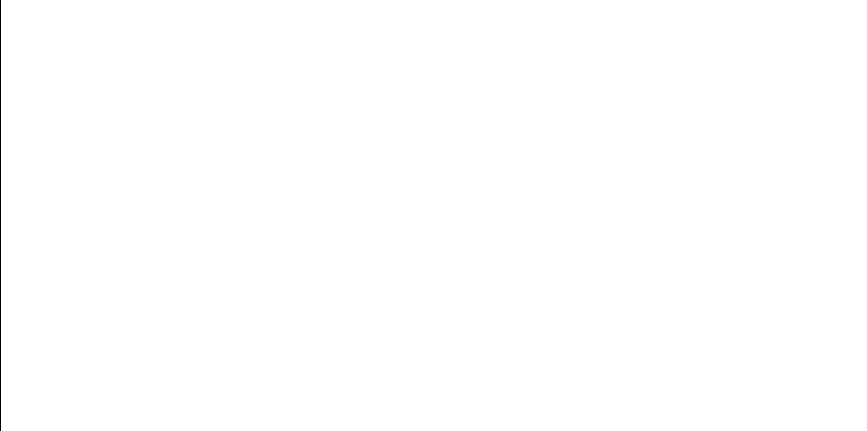

718.503026303 319.320991296
539.616723234 163.442376111
675.241380112 246.066726012
659.710849131 229.341223984
732.163216634 371.294675756
640.51897156 212.297753957
481.866501482 157.002549257
425.287610692 163.697574165
417.160337338 165.752926388
715.982455437 312.962635092


<IPython.core.display.Javascript object>


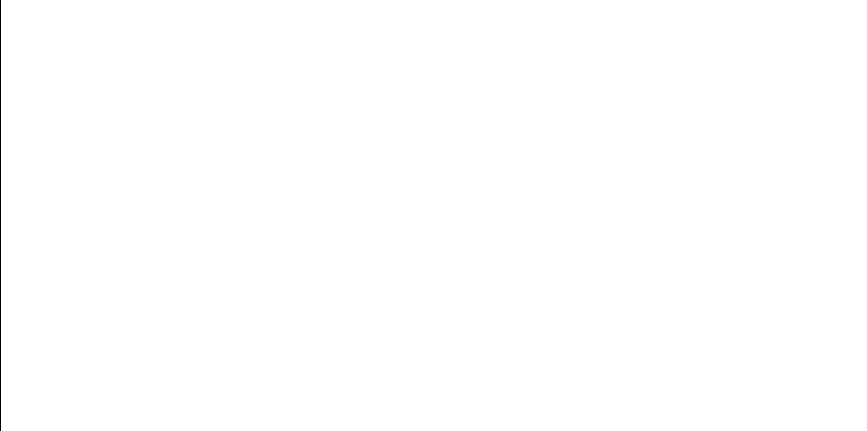

503.782210332 157.858407002
498.369226152 157.469113452
489.88214846 157.093993655
617.998802096 196.2106125
619.161241227 196.952560998
613.297927308 193.300092399
681.928162824 254.301628853
654.466143509 224.329044975
613.297927308 193.300092399
477.100527066 157.069064585


<IPython.core.display.Javascript object>


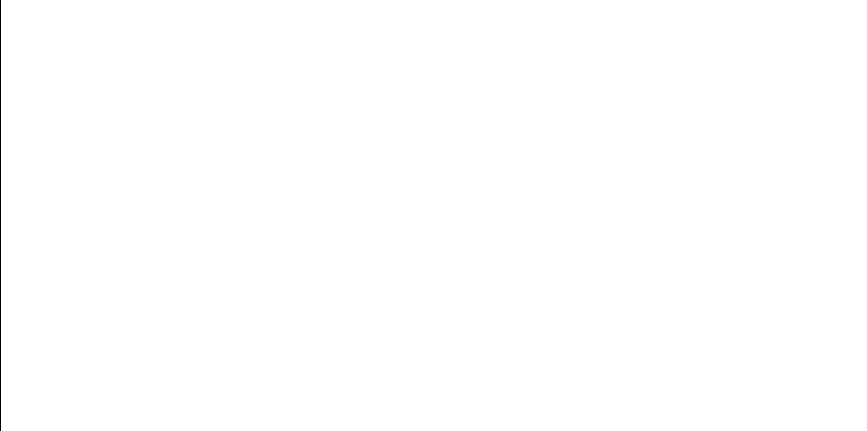

723.030355136 332.25738724
678.419497399 249.892426213
615.640230497 194.732482038
564.58405574 170.571725987
733.520000951 381.728602467
522.117781582 160.054626144
692.986392264 269.681246546
707.83786474 295.193433498
626.345981441 201.741876867
704.184189733 288.245893602


<IPython.core.display.Javascript object>


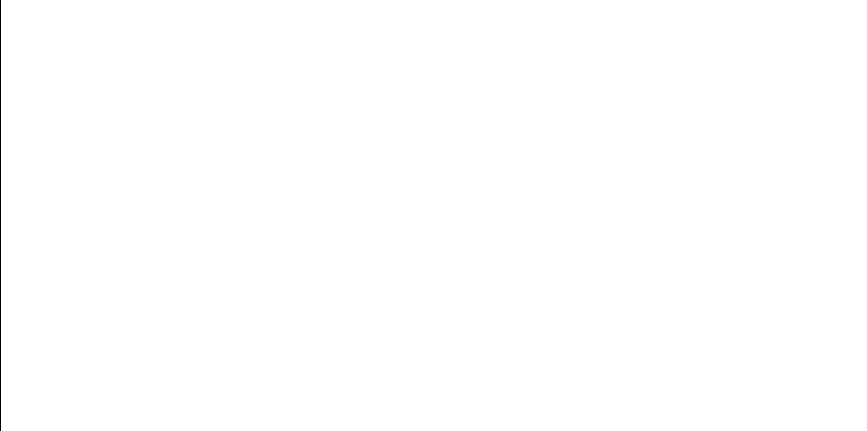

487.712469532 157.044066093
664.252553404 233.924268145
529.215713252 161.274127616
429.319817733 162.783757579
519.568559884 159.667410016
678.018198622 249.400807626
484.159884092 157.002669322
424.793809646 163.814275692
692.426946303 268.841681795
711.510598458 302.760146874


<IPython.core.display.Javascript object>


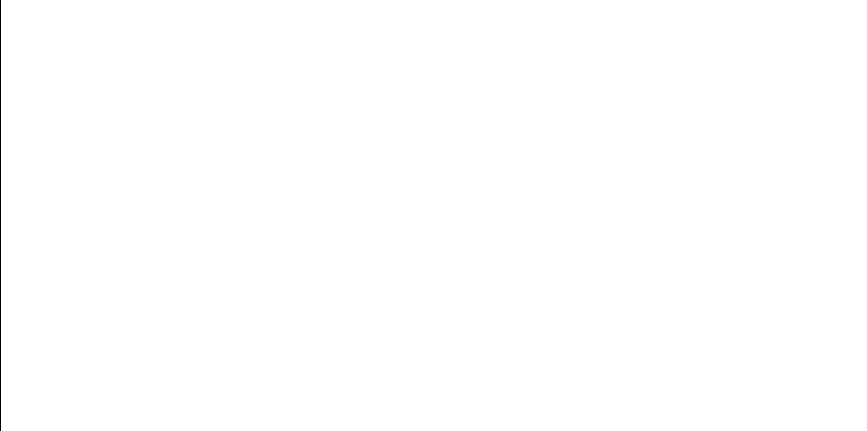

597.485933597 184.507302995
690.587498376 266.131422217
710.044920963 299.662888894
498.314745943 157.465790484
640.470278903 212.258770812
676.71386972 247.820172856
725.220572517 339.478821576
722.574150889 330.844857969
675.953263008 246.910400413
690.360611938 265.802316301


<IPython.core.display.Javascript object>


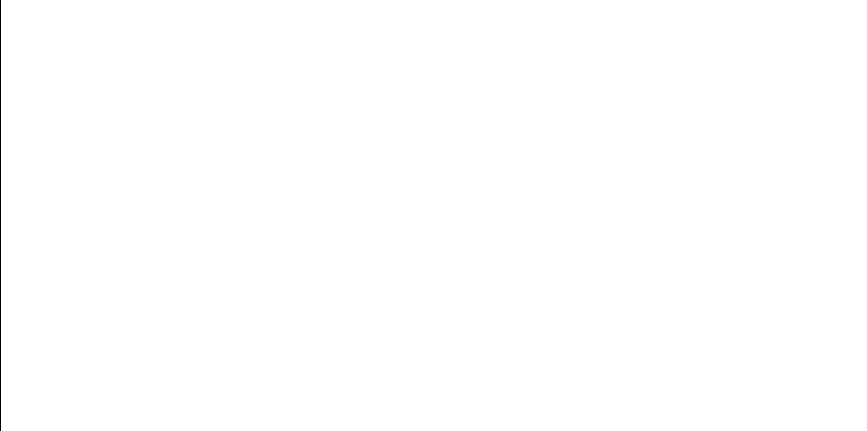

689.026753691 263.889777192
660.372990676 229.994910188
686.388998893 260.215205316
489.88214846 157.093993655
731.607095334 367.786990532
456.570591086 158.389772067
534.992745492 162.421910105
630.29904263 204.532418119
448.481754203 159.375300286
553.273850088 166.996723175


<IPython.core.display.Javascript object>


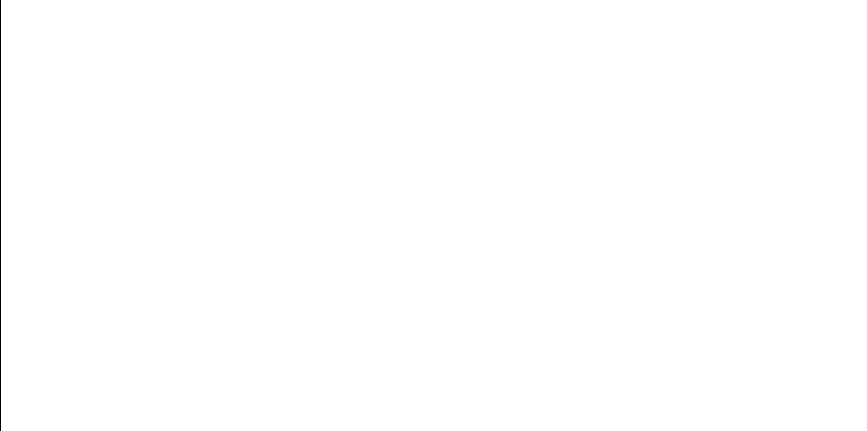

402.580204013 170.176516202
733.869288941 385.154667832
539.946778622 163.518708646
677.663374309 248.96821971
402.580204013 170.176516202
531.20410641 161.653352306
565.419853936 170.859353161
692.426946303 268.841681795
734.921029113 402.691664986
683.514428176 256.363293755


<IPython.core.display.Javascript object>


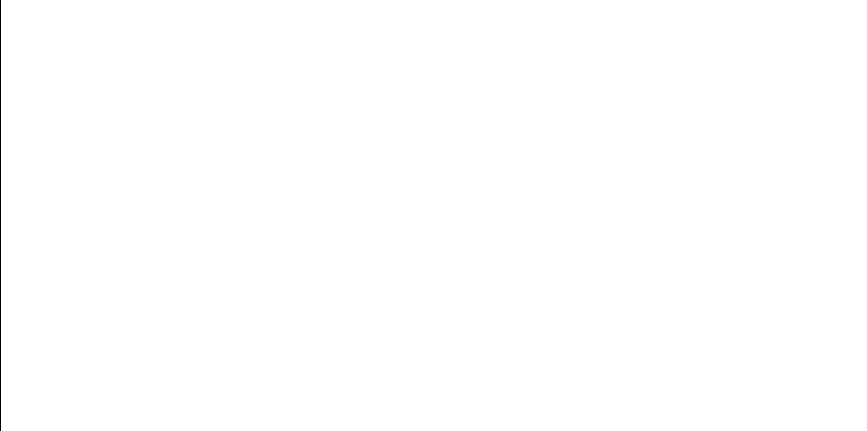

408.349921663 168.310644597
531.20410641 161.653352306
626.345981441 201.741876867
732.778601262 375.613620265
677.586775587 248.875090112
590.031172581 180.858973229
571.905829366 173.204000236
481.379279485 157.00521183
631.436441074 205.356627996
659.03649575 228.680416582


<IPython.core.display.Javascript object>


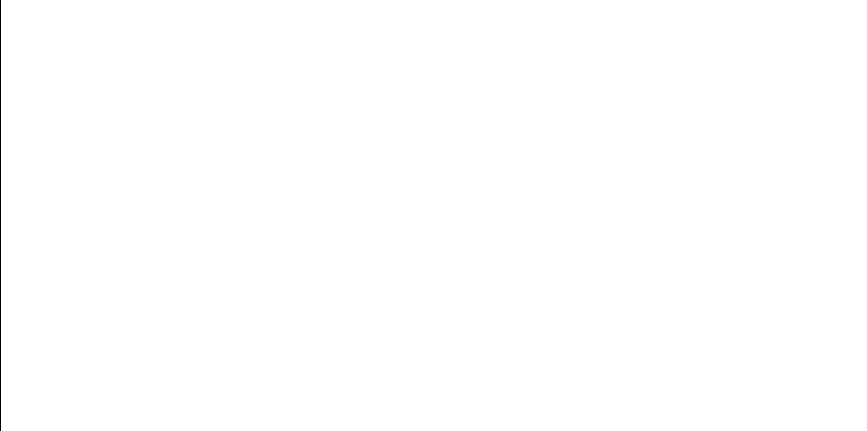

632.384840254 206.05131313
621.172630646 198.257683081
538.258955943 163.133272304
716.626998846 314.541409019
678.433684759 249.909853034
589.815547506 180.75793812
722.064887259 329.300692098
702.898457304 285.920072818
609.424646589 191.007319538
638.059749891 210.353394281


<IPython.core.display.Javascript object>


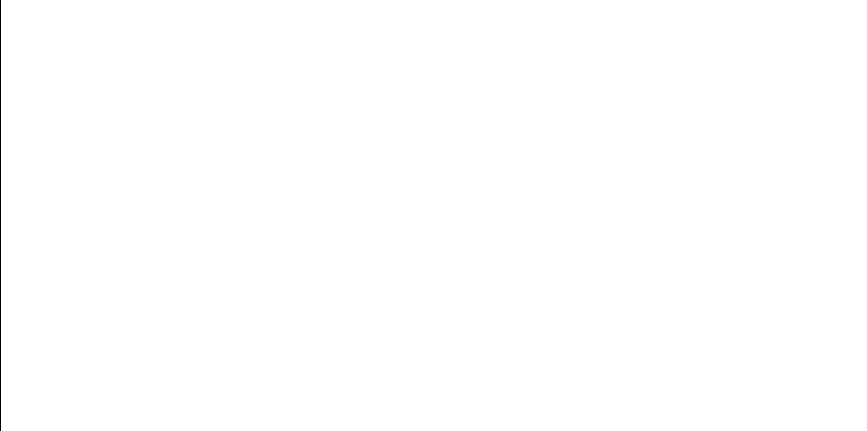

606.387916675 189.274211758
547.018952472 165.267413495
731.885823736 369.505104843
524.684929676 160.471597925
435.50470737 161.516268862
675.953263008 246.910400413
614.299323616 193.908187934
461.366009446 157.930347408
675.241380112 246.066726012
690.45830559 265.943887088


<IPython.core.display.Javascript object>


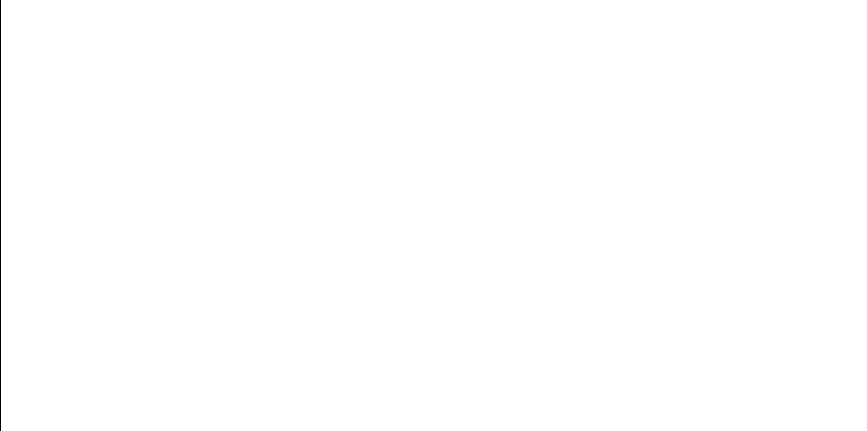

630.00766747 204.322825638
732.045940878 370.527680961
722.806778075 331.56157808
733.467474367 381.25032821
423.441712922 164.139201912
707.337166261 294.209600428
676.145278095 247.139252598
527.245085038 160.914586382
706.31113119 292.226121558
641.147435016 212.802678923


<IPython.core.display.Javascript object>


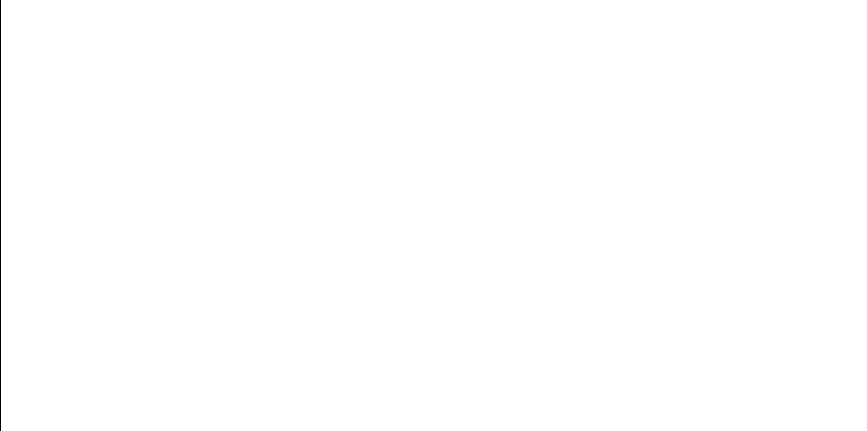

722.064887259 329.300692098
672.209559319 242.55558687
408.349921663 168.310644597
466.677406109 157.529180761
626.345981441 201.741876867
588.180729351 179.999969054
695.15989631 273.014050734
690.587498376 266.131422217
659.710849131 229.341223984
622.48522083 199.124148197


<IPython.core.display.Javascript object>


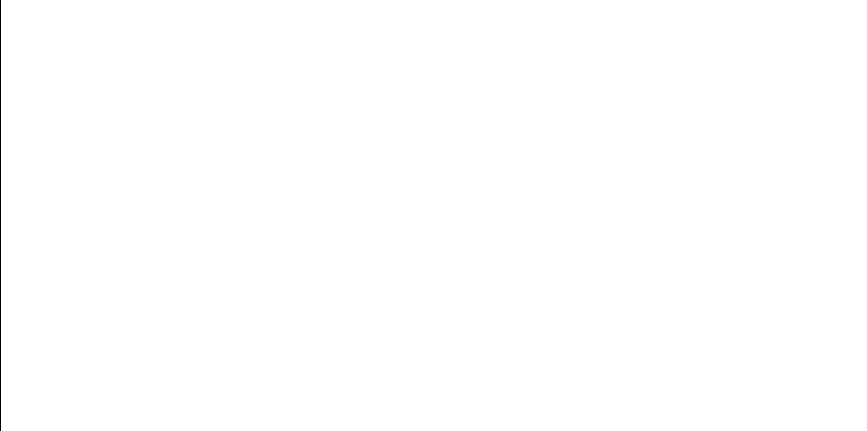

733.436912002 380.975847792
573.315075269 173.740170919
716.610755723 314.501244397
507.252907103 158.169785518
603.793337058 187.837232513
731.377286917 366.423911128
636.825711499 209.396266363
637.118184867 209.622004491
678.651193333 250.177424314
565.278744761 170.81056245


<IPython.core.display.Javascript object>


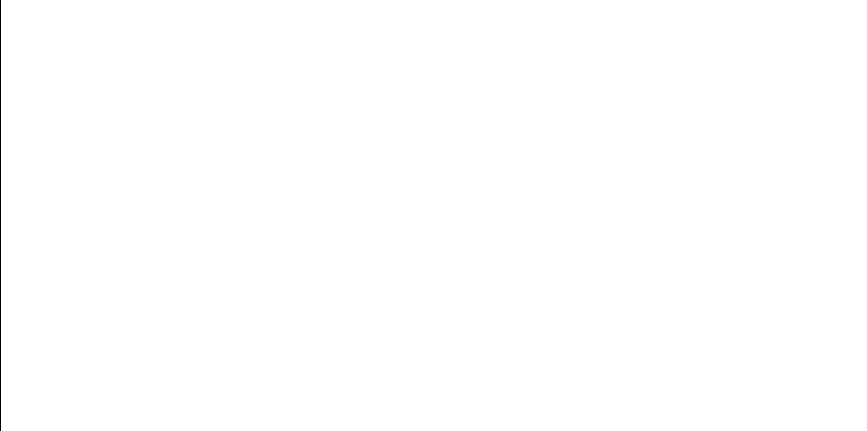

541.180938088 163.80828227
563.567922487 170.226446468
716.248178304 313.609815401
589.315330712 180.524507976
608.581237587 190.520360752
435.50470737 161.516268862
644.709150182 215.727780714
456.570591086 158.389772067
590.12076919 180.901028481
732.778601262 375.613620265


<IPython.core.display.Javascript object>


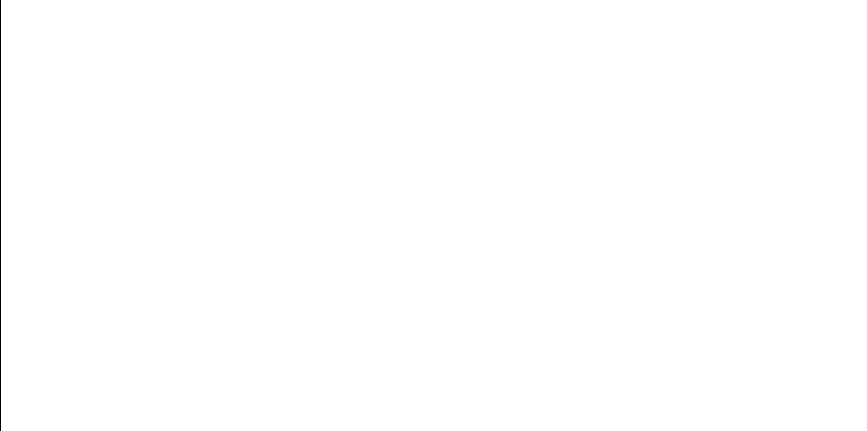

731.416569631 366.653714061
652.361864068 222.397323172
565.762091382 170.978076157
498.314745943 157.465790484
585.228956594 178.667109527
690.943704365 266.650374728
713.7360472 307.684273074
414.672895628 166.43989032
614.299323616 193.908187934
630.437612483 204.632315604


<IPython.core.display.Javascript object>


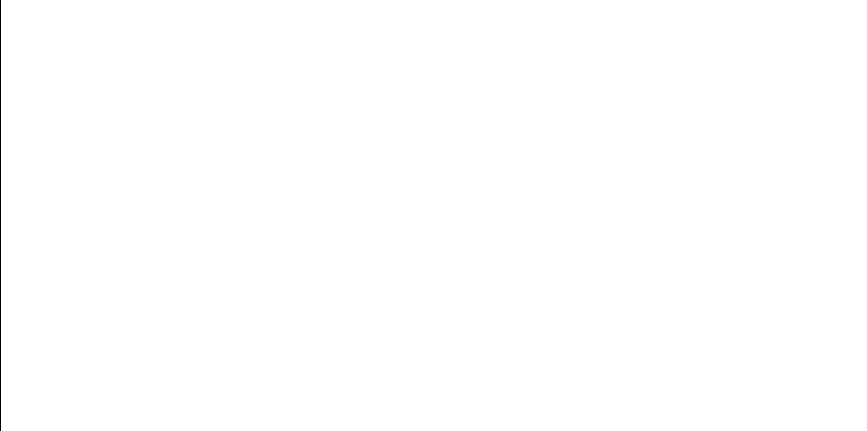

634.216741558 207.412557255
716.248178304 313.609815401
683.744488055 256.665990287
377.921262401 179.953151289
626.714658244 201.997350244
692.979042809 269.670169809
534.698113344 162.359968625
626.316772222 201.721677931
723.030355136 332.25738724
534.992745492 162.421910105


<IPython.core.display.Javascript object>


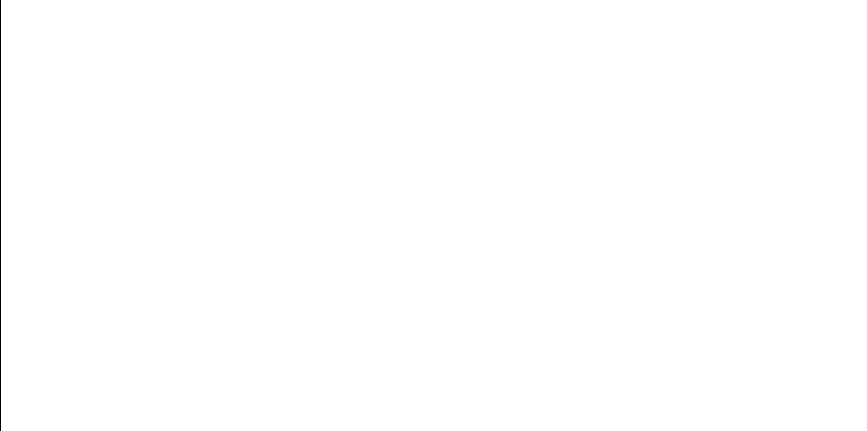

640.51897156 212.297753957
553.489430056 167.059428267
713.870389656 307.990776758
618.089448612 196.268147957
680.534780215 252.526326159
705.390216034 290.481681532
723.030355136 332.25738724
485.433162465 157.01174686
733.587845972 382.359214522
560.247590196 169.131682357


<IPython.core.display.Javascript object>


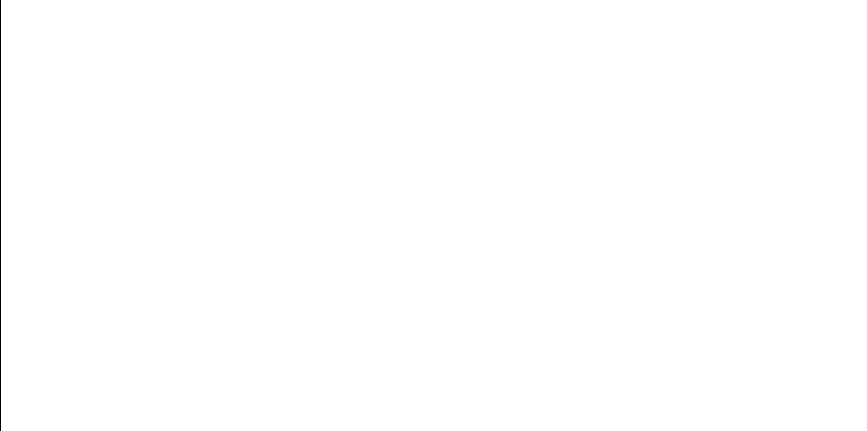

501.464420481 157.677368356
537.193942741 162.896329629
617.165420661 195.684178039
566.99142152 171.409088745
598.34603594 184.948014977
635.673489605 208.513577588
585.228956594 178.667109527
592.771381413 182.164720948
555.393811982 167.62242029
679.71613339 251.498371868


<IPython.core.display.Javascript object>


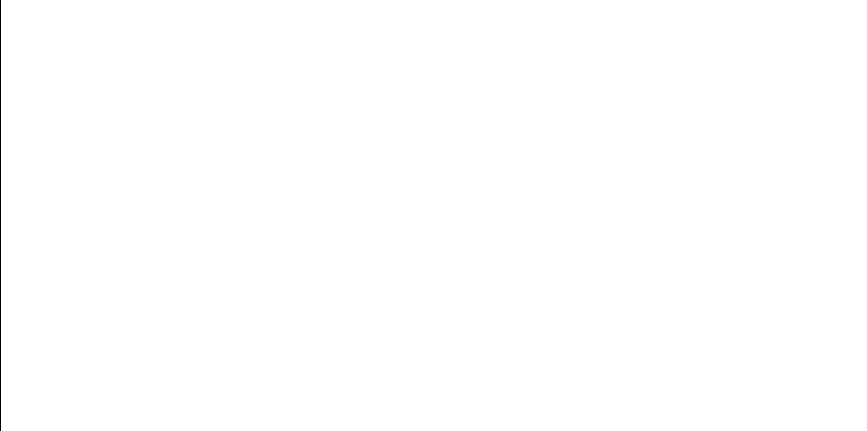

612.60641272 192.883878941
635.832695398 208.634915174
691.083980005 266.85550568
654.487255532 224.348649639
688.57638859 263.252449577
653.027191058 223.003348684
472.904721764 157.202292788
550.22999548 166.133518764
493.447327468 157.216653949
733.436912002 380.975847792


<IPython.core.display.Javascript object>


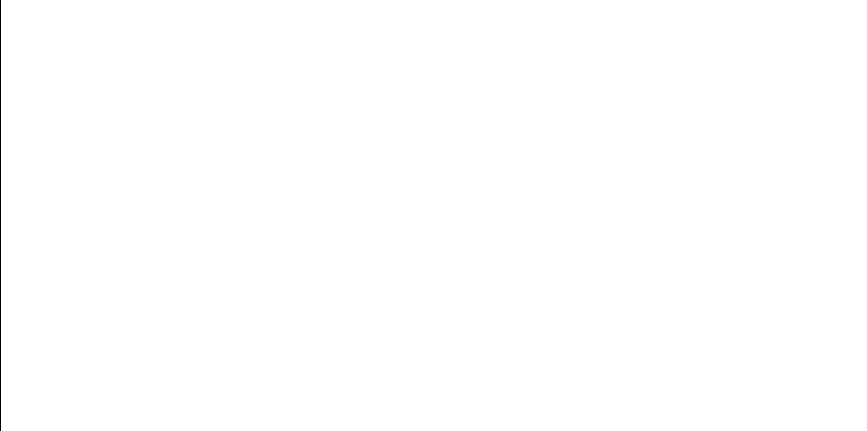

582.120189596 177.312305
605.218351733 188.621519881
453.583853503 158.722773059
637.979979494 210.291152798
664.252553404 233.924268145
650.32282742 220.566798509
467.092157977 157.50260327
531.506839312 161.712542696
707.877203781 295.271185622
702.901906576 285.926235598


<IPython.core.display.Javascript object>


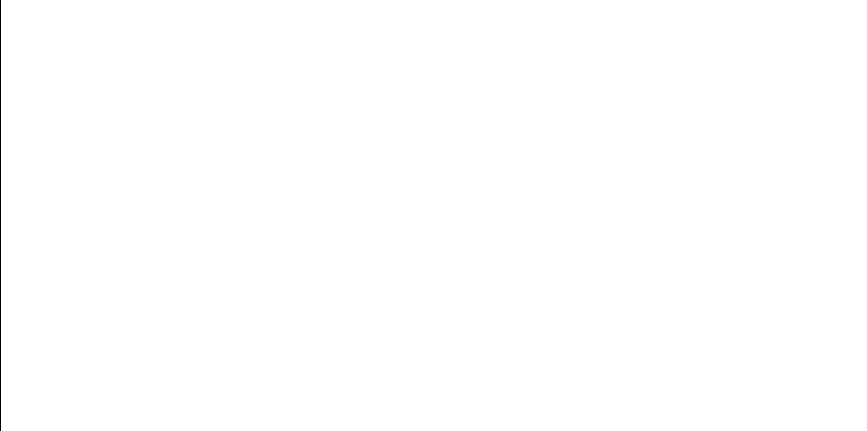

619.834123617 197.386147396
590.710679941 181.178996959
611.02170929 191.94138591
630.29904263 204.532418119
603.793337058 187.837232513
441.447737971 160.449382378
664.09701249 233.76338263
676.731756661 247.841672691
647.307665547 217.931972736
732.871937535 376.319503787


<IPython.core.display.Javascript object>


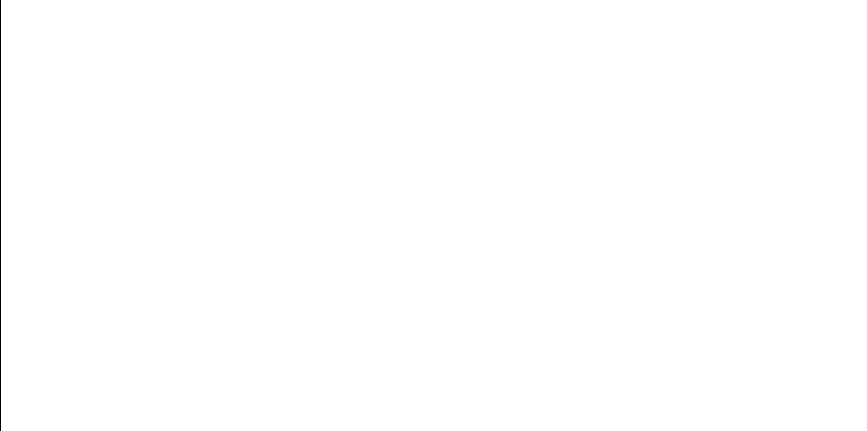

693.264557983 270.101419531
696.186720357 274.629533515
576.804090629 175.109443155
577.043049845 175.205421842
731.607095334 367.786990532
734.317931857 390.471720881
678.018198622 249.400807626
664.252553404 233.924268145
352.227656738 193.587386076
731.055692213 364.588587493


<IPython.core.display.Javascript object>


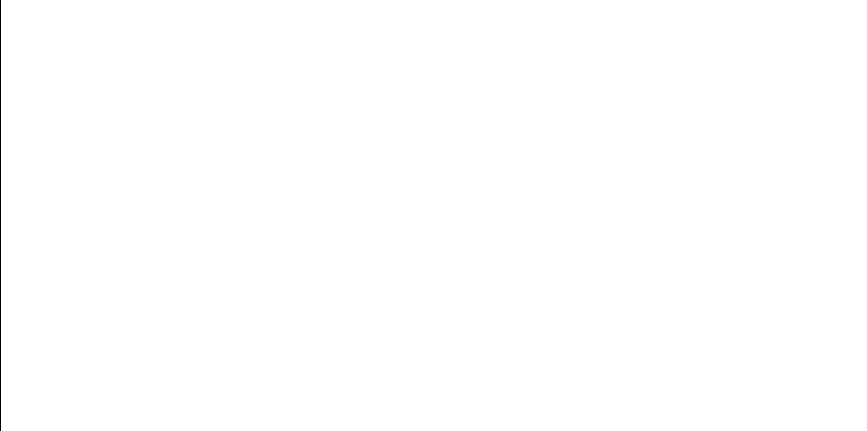

679.49155761 251.218290705
646.801837089 217.49815101
579.288837309 176.121362488
612.288242234 192.693387942
469.031967871 157.387412719
716.610755723 314.501244397
689.281996479 264.252848288
705.99003836 291.614128651
510.480888879 158.502892738
522.186345631 160.065409563


<IPython.core.display.Javascript object>


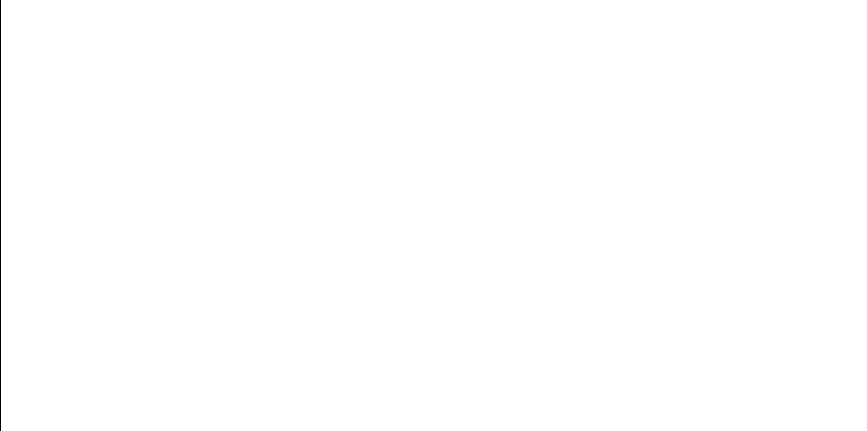

697.481096732 276.705407727
414.672895628 166.43989032
539.389365587 163.39006647
527.245085038 160.914586382
580.829430972 176.764338579
578.920651111 175.96946833
503.756858973 157.85631044
518.403791041 159.499355552
715.683889647 312.241499089
439.695324962 160.748705704


<IPython.core.display.Javascript object>


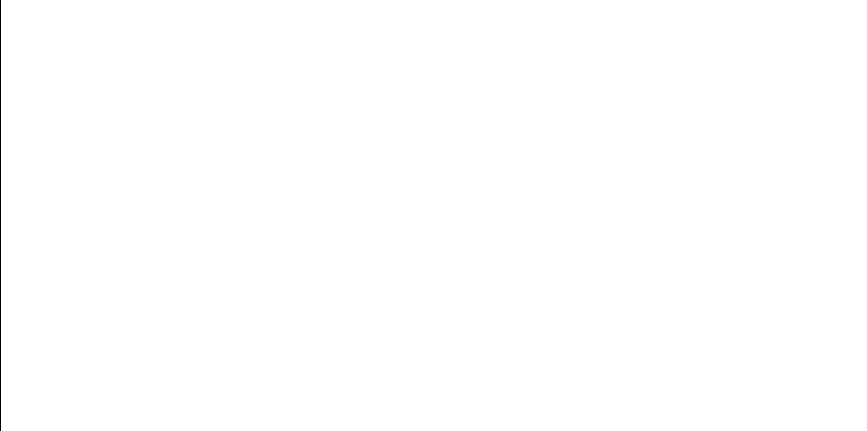

531.953474681 161.800571771
647.307665547 217.931972736
377.921262401 179.953151289
690.30562391 265.722722334
417.160337338 165.752926388
645.998004792 216.813500906
621.172630646 198.257683081
697.871786789 277.3409128
541.561703249 163.898945509
600.138943943 185.88014922


<IPython.core.display.Javascript object>


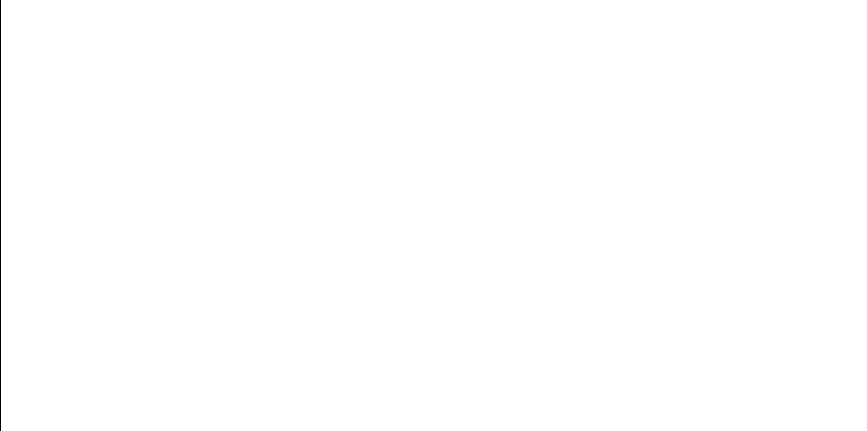

675.953263008 246.910400413
554.140923388 167.250193341
675.552638961 246.434686267
522.186345631 160.065409563
732.446341514 373.215608076
727.793680173 349.166446309
692.986392264 269.681246546
661.957433947 231.578927872
734.756771337 397.93075947
551.984086908 166.625917736


<IPython.core.display.Javascript object>


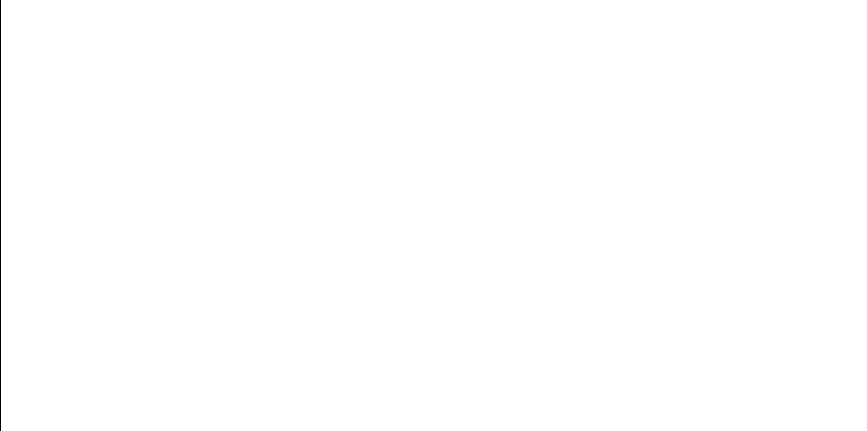

516.409998341 159.22455683
733.520000951 381.728602467
613.45583704 193.39555992
546.228290963 165.061107607
688.973051443 263.813560967
699.228089986 279.580476353
679.869649694 251.690302176
507.28900874 158.173278827
555.393811982 167.62242029
724.428860763 336.777391415


<IPython.core.display.Javascript object>


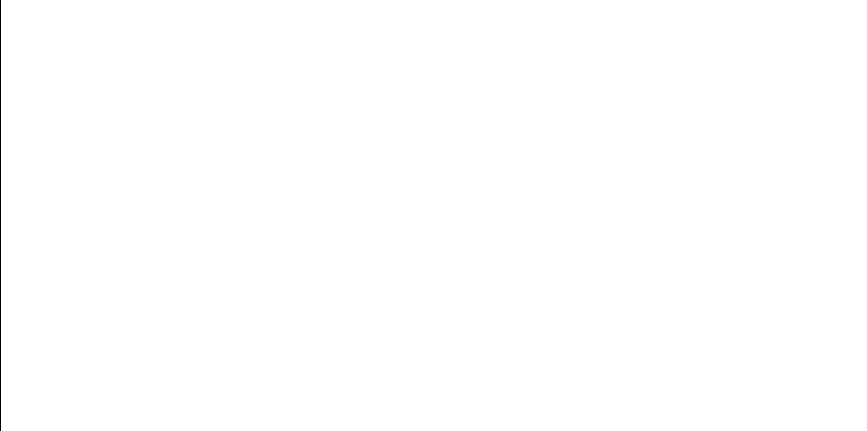

469.914149595 157.339990227
597.348390966 184.437212603
636.227612027 208.936762716
514.205847633 158.939617145
551.888129647 166.59862708
321.912809437 215.209089386
582.057981419 177.285701095
501.694504553 157.694378297
679.109726202 250.743956549
481.866501482 157.002549257


<IPython.core.display.Javascript object>


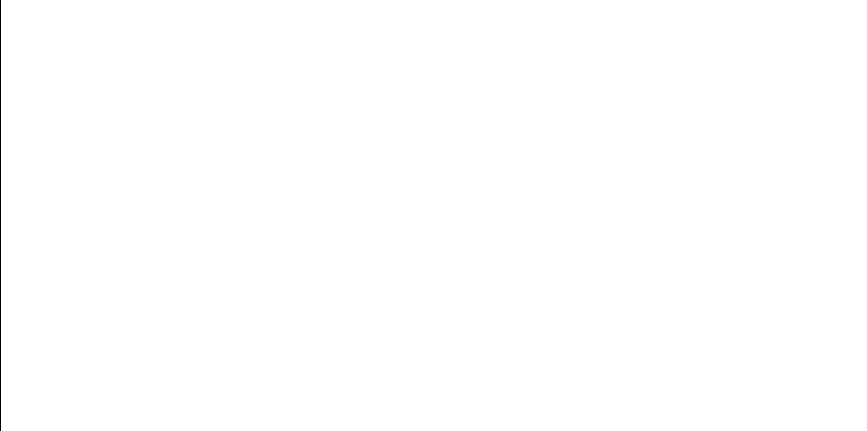

723.99006996 335.326489289
733.681199596 383.252453141
544.239780611 164.554322454
664.252553404 233.924268145
734.814513874 399.333014816
621.647874581 198.570042831
522.721430079 160.150230074
691.65006625 267.687757593
525.834380474 160.667126925
547.65013583 165.434074762


<IPython.core.display.Javascript object>


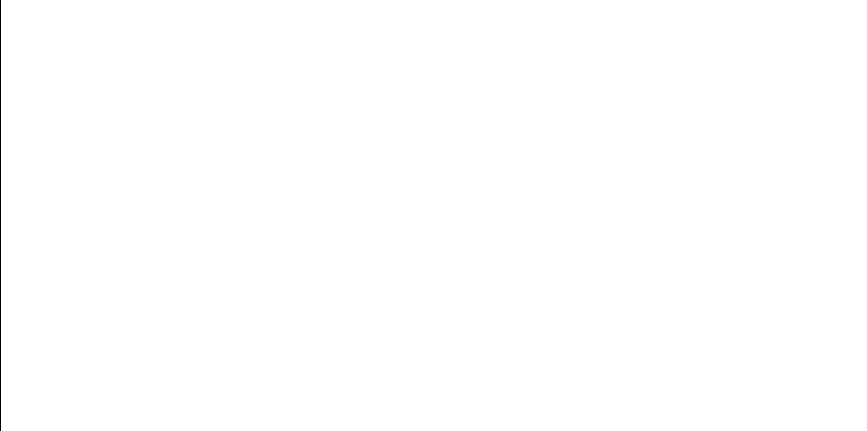

496.326433551 157.352615414
649.606342959 219.933010587
656.156378267 225.912947848
604.077099851 187.992452863
710.385713625 300.373404548
503.782210332 157.858407002
472.66162822 157.21215663
690.30562391 265.722722334
685.310013116 258.751344122
646.801837089 217.49815101


<IPython.core.display.Javascript object>


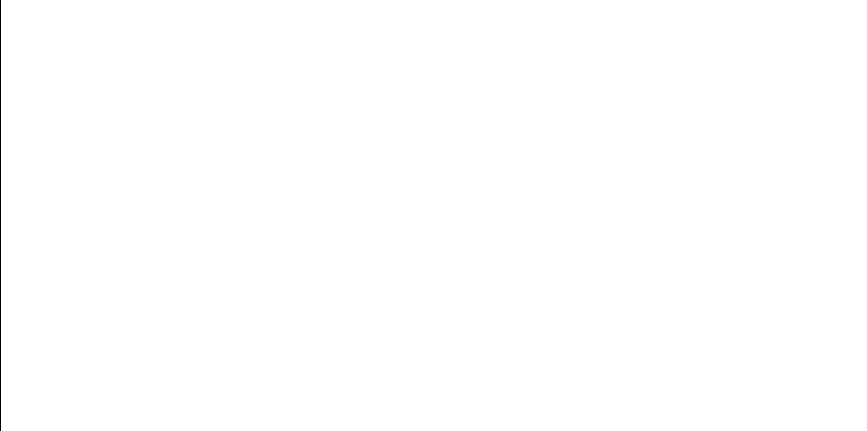

519.102819597 159.599546077
730.861023982 363.51469698
608.684406605 190.579694313
714.563524292 309.590069824
540.081077342 163.549901997
602.354816751 187.057602702
706.064199793 291.755116228
698.684261887 278.676175722
614.299323616 193.908187934
709.510513002 298.560027619


<IPython.core.display.Javascript object>


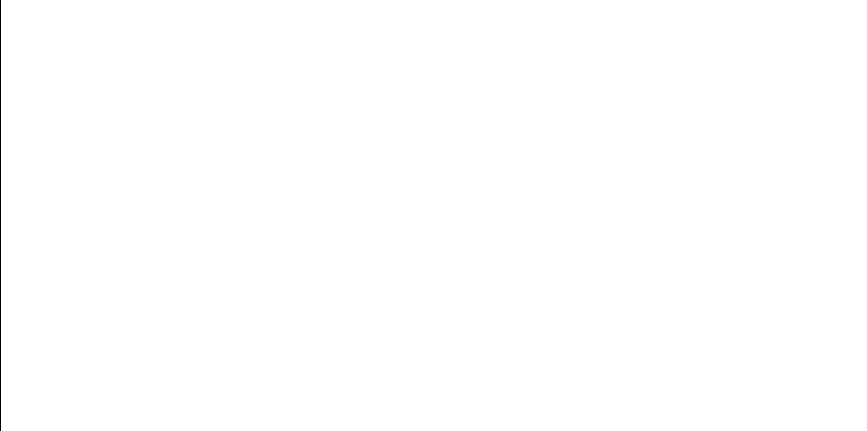

733.313955058 379.898042963
676.145278095 247.139252598
656.433579456 226.175511713
389.203180818 175.106527001
613.98821256 193.718583779
637.53706534 209.94650107
528.088046039 161.066403841
626.519226947 201.8618058
460.946371197 157.966859844
480.098621986 157.016702923


<IPython.core.display.Javascript object>


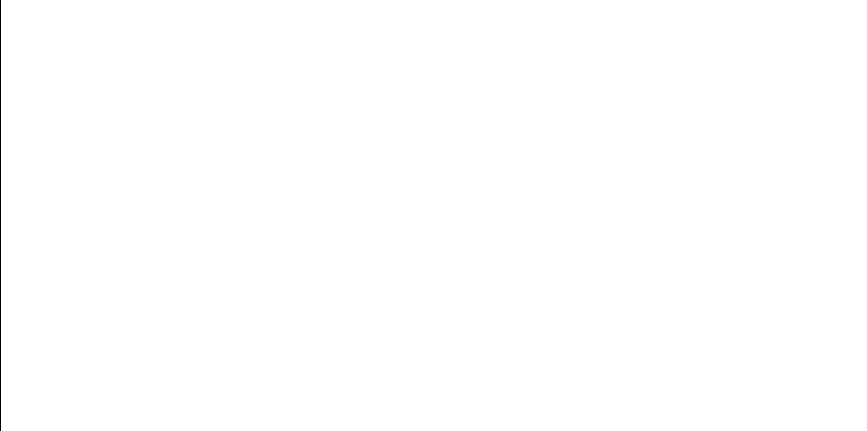

690.30562391 265.722722334
654.466143509 224.329044975
374.014128936 181.786268222
510.653118117 158.521847144
634.780806917 207.836915286
589.168791897 180.456376971
626.519226947 201.8618058
734.921029113 402.691664986
624.873667422 200.73127337
600.431741102 186.034114309


<IPython.core.display.Javascript object>


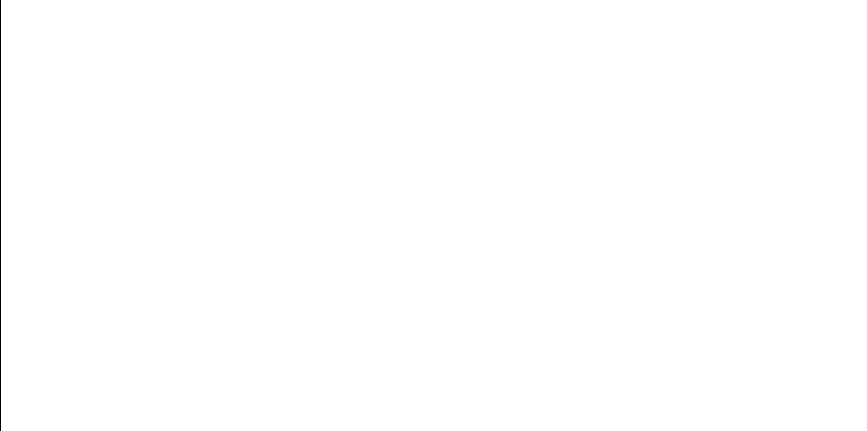

713.981514866 308.245150041
481.379279485 157.00521183
614.299323616 193.908187934
534.698113344 162.359968625
601.885257221 186.805725512
734.591125381 394.650587839
719.238098515 321.275654404
293.260282672 243.160198781
595.31716857 183.414420575
547.703071989 165.448131858


<IPython.core.display.Javascript object>


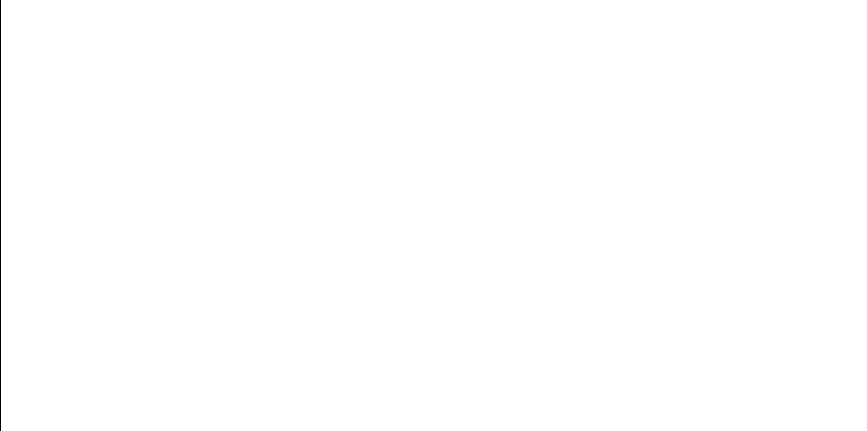

445.195922083 159.851747562
645.822366379 216.664675614
535.972019441 162.630429727
555.393811982 167.62242029
683.787823227 256.723113888
648.637435693 219.083597609
433.763432523 161.856801787
651.136713581 221.29265985
553.691560333 167.118410586
546.278783387 165.074200682


<IPython.core.display.Javascript object>


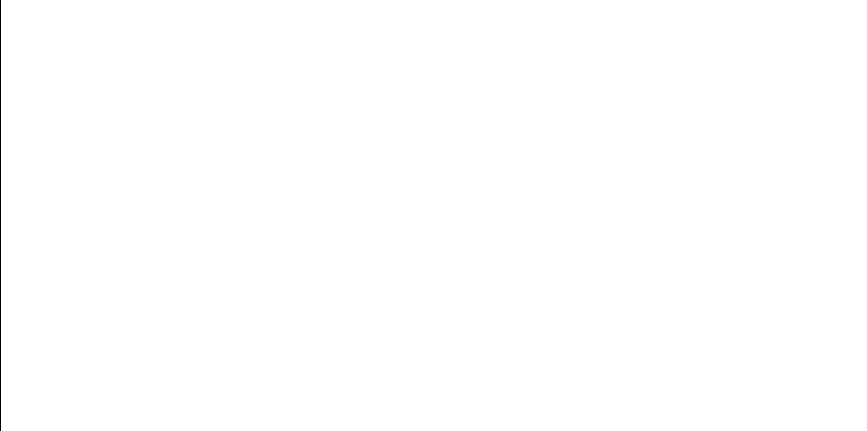

520.914606866 159.868543563
638.28148234 210.526673726
504.985863978 157.960915822
703.305241878 286.649681647
514.205847633 158.939617145
627.164517861 202.31039748
644.23597965 215.332865807
646.093452004 216.894492756
662.218131588 231.842269968
657.065840942 226.777380611


<IPython.core.display.Javascript object>


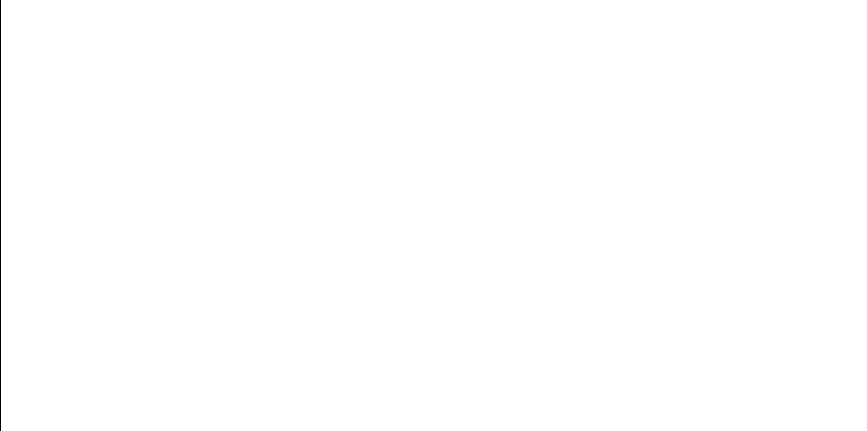

659.03649575 228.680416582
592.015465969 181.800466155
561.091196473 169.404997896
580.374343681 176.573157332
686.742117195 260.699124477
606.723154346 189.462802517
730.16823917 359.889292964
593.348185822 182.444757541
611.949907208 192.491521111
594.81734906 183.166254848


<IPython.core.display.Javascript object>


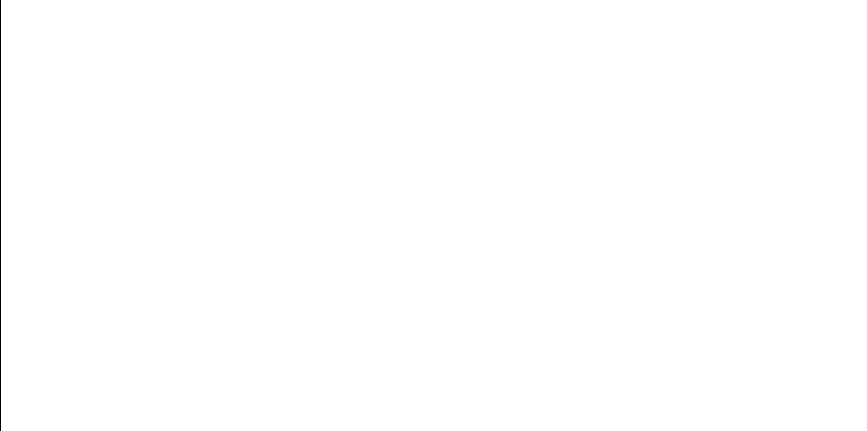

692.979042809 269.670169809
560.948932287 169.358676445
586.894906459 179.413745159
652.544686519 222.563417557
693.059299186 269.791197026
678.433684759 249.909853034
546.00666547 165.003770303
617.998802096 196.2106125
631.487982468 205.394206707
731.885823736 369.505104843


<IPython.core.display.Javascript object>


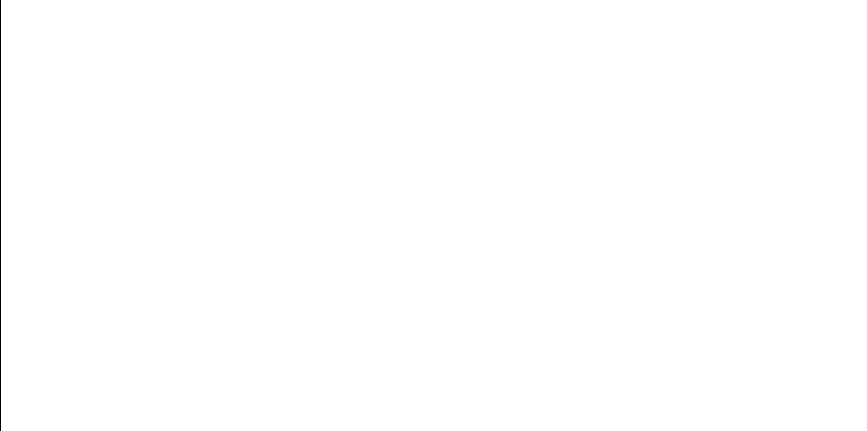

454.732603572 158.590426902
582.835450322 177.61961436
686.901241629 260.917983326
716.610755723 314.501244397
453.583853503 158.722773059
666.342683626 236.114314182
529.215713252 161.274127616
697.481096732 276.705407727
734.782729145 398.537815507
654.466143509 224.329044975


<IPython.core.display.Javascript object>


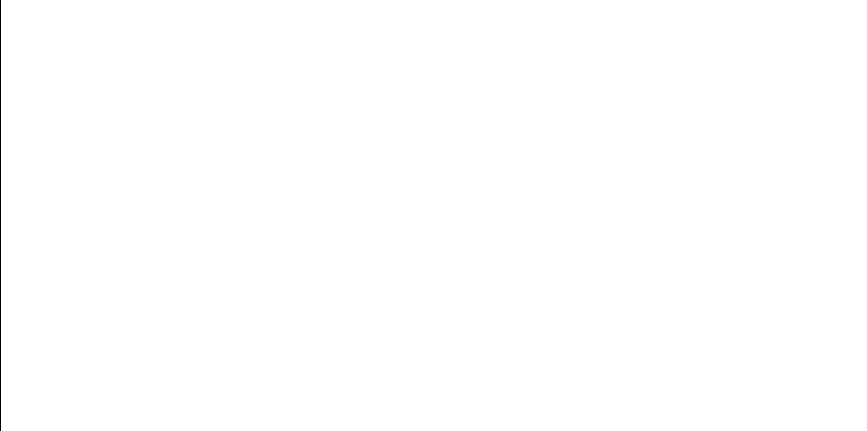

610.453336018 191.607159414
679.49155761 251.218290705
626.519226947 201.8618058
625.888970431 201.426537994
688.249323357 262.792218876
448.481754203 159.375300286
467.092157977 157.50260327
686.742117195 260.699124477
622.96459906 199.443537418
654.466143509 224.329044975


<IPython.core.display.Javascript object>


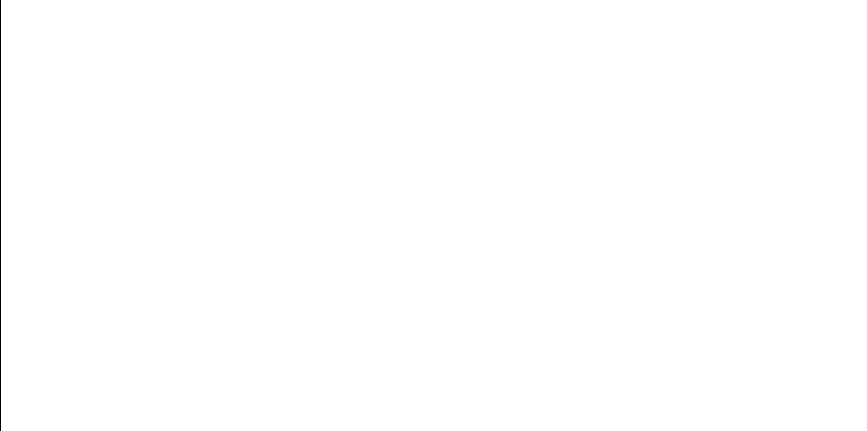

636.825711499 209.396266363
667.091060941 236.911414435
573.521237493 173.819419248
675.241380112 246.066726012
619.982976134 197.48247295
602.354816751 187.057602702
613.297927308 193.300092399
481.866501482 157.002549257
683.787823227 256.723113888
715.982455437 312.962635092


<IPython.core.display.Javascript object>


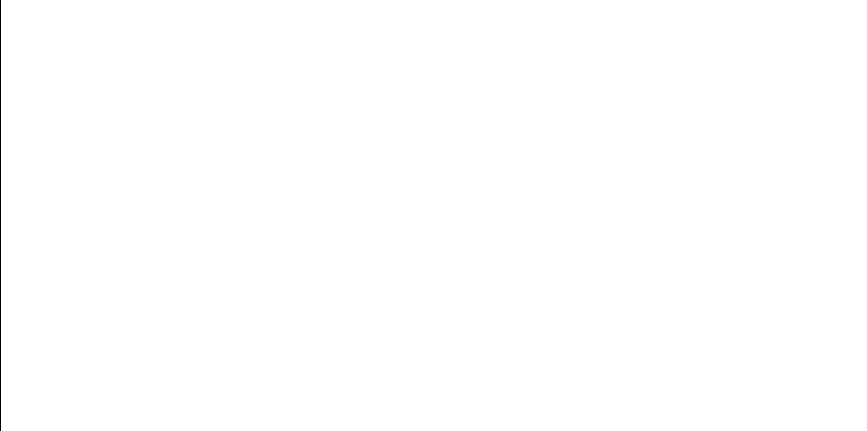

447.950585959 159.449326638
585.005016644 178.567848208
635.659777239 208.503136151
603.333358743 187.586624673
682.563246964 255.121767422
689.281996479 264.252848288
505.340209252 157.992201216
580.988012778 176.831205043
685.859362263 259.493882593
648.637435693 219.083597609


<IPython.core.display.Javascript object>


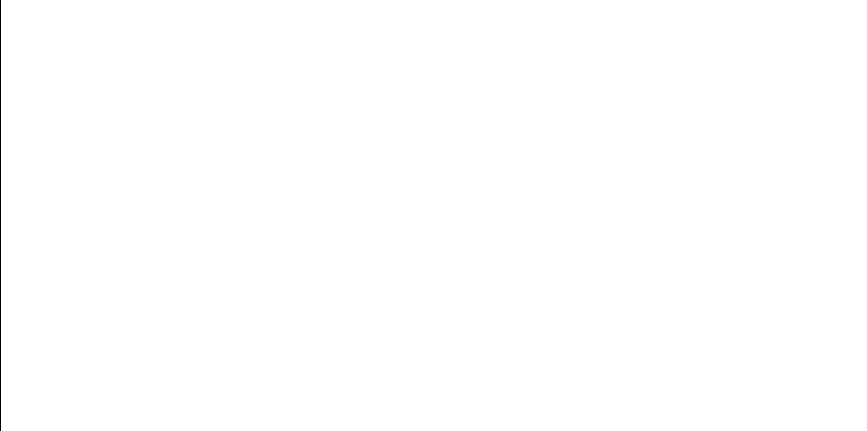

716.203864342 313.50153061
733.467474367 381.25032821
592.015465969 181.800466155
705.123891033 289.983290954
644.23597965 215.332865807
639.537746435 211.51599067
732.502528745 373.609490682
679.109726202 250.743956549
543.937015709 164.478671449
652.361864068 222.397323172


<IPython.core.display.Javascript object>


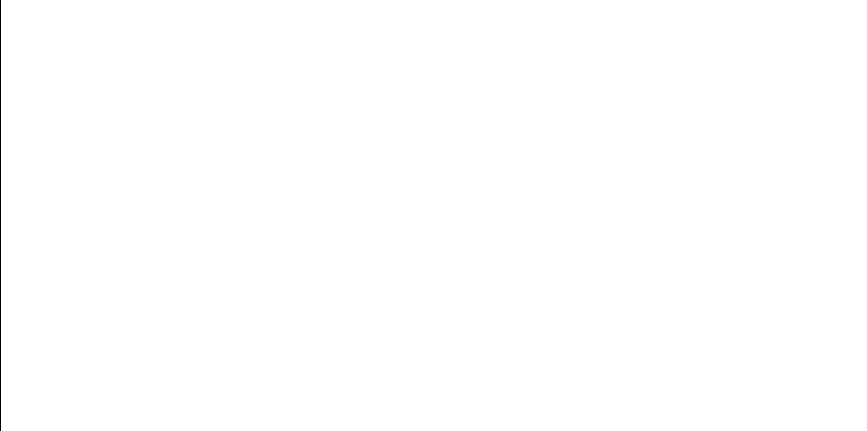

602.164977238 186.955616599
531.88679753 161.787376885
722.806778075 331.56157808
607.804108847 190.075505219
673.67855792 244.240516056
596.963964626 184.241874971
362.715726713 187.559954841
484.159884092 157.002669322
487.087845797 157.033157902
631.436441074 205.356627996


<IPython.core.display.Javascript object>


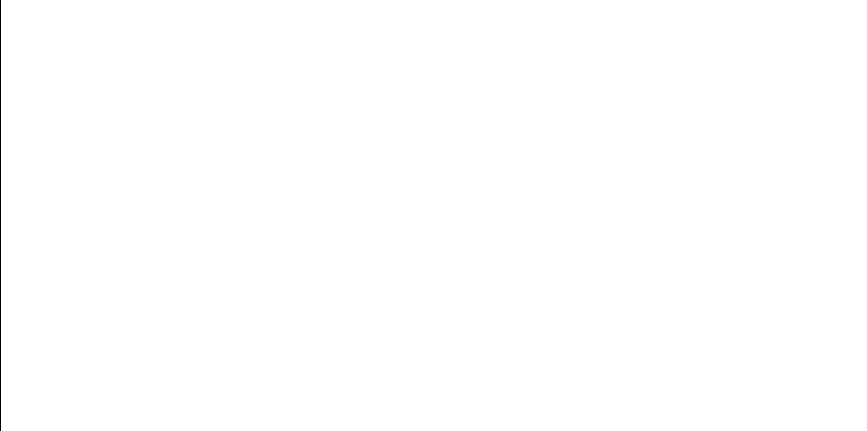

636.560952035 209.192507623
733.869288941 385.154667832
450.787512832 159.067297717
582.120189596 177.312305
516.446903754 159.229496078
734.87574195 401.0873129
649.999670852 220.280340358
402.580204013 170.176516202
563.894279952 170.336815845
667.143340573 236.967357392


<IPython.core.display.Javascript object>


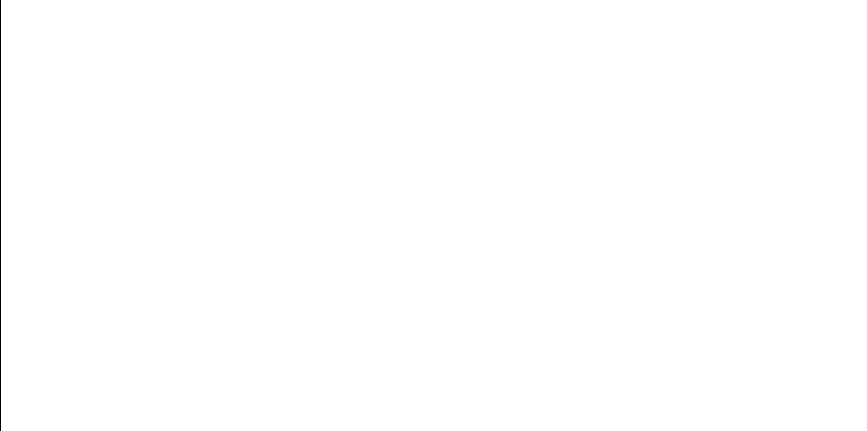

414.672895628 166.43989032
570.881576251 172.820346863
668.999298809 238.97570514
387.063014522 175.976192595
655.917638921 225.687452284
576.804090629 175.109443155
693.264557983 270.101419531
600.431741102 186.034114309
663.059464165 232.697449353
643.528358023 214.745923414


<IPython.core.display.Javascript object>


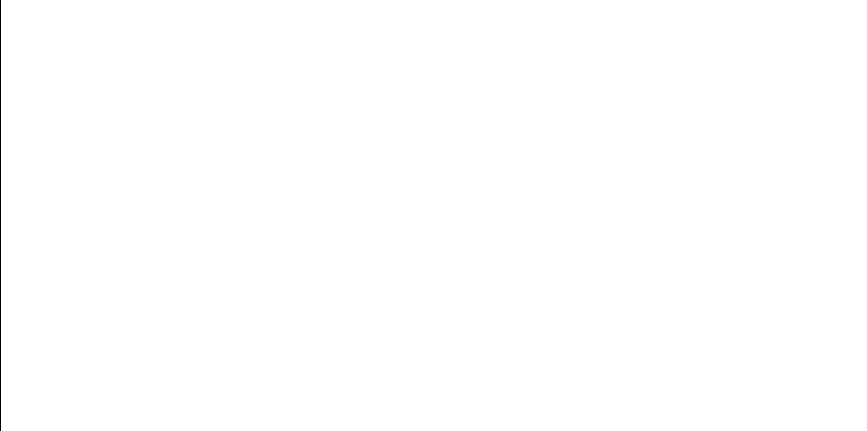

645.276335656 216.203758112
642.648126948 214.021858759
629.597227419 204.028653434
537.193942741 162.896329629
586.540183982 179.253552147
658.750972252 228.402115869
466.677406109 157.529180761
503.756858973 157.85631044
607.804108847 190.075505219
634.714515168 207.786914225


<IPython.core.display.Javascript object>


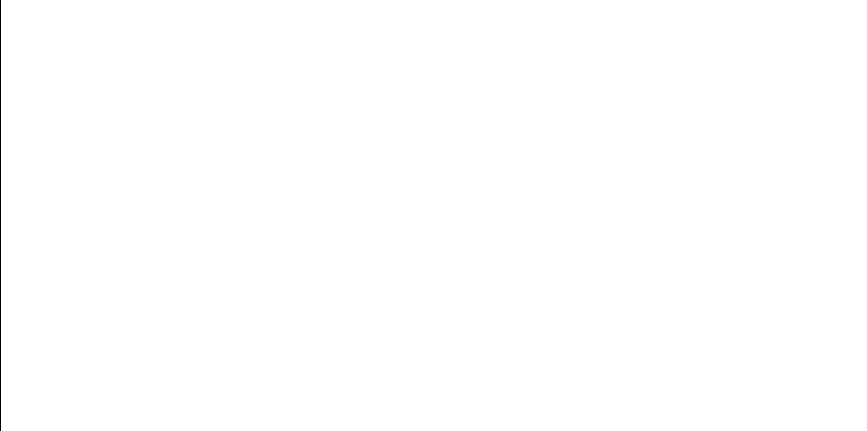

397.352387773 172.001083294
685.150740122 258.537119965
566.99142152 171.409088745
481.831814904 157.002707666
584.842113771 178.495805108
679.71613339 251.498371868
603.83519106 187.86009722
616.816835672 195.465331876
636.616125319 209.234922867
594.268577374 182.89537004


<IPython.core.display.Javascript object>


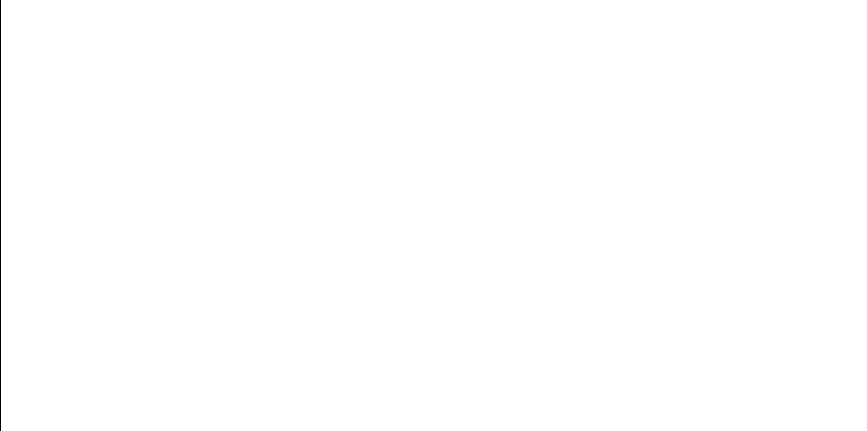

687.791862099 262.152142616
687.928122247 262.342355425
630.29904263 204.532418119
728.848719288 353.660979188
539.616723234 163.442376111
640.51897156 212.297753957
599.09093659 185.333072535
490.211441631 157.10320544
629.007899189 203.608438892
450.787512832 159.067297717


<IPython.core.display.Javascript object>


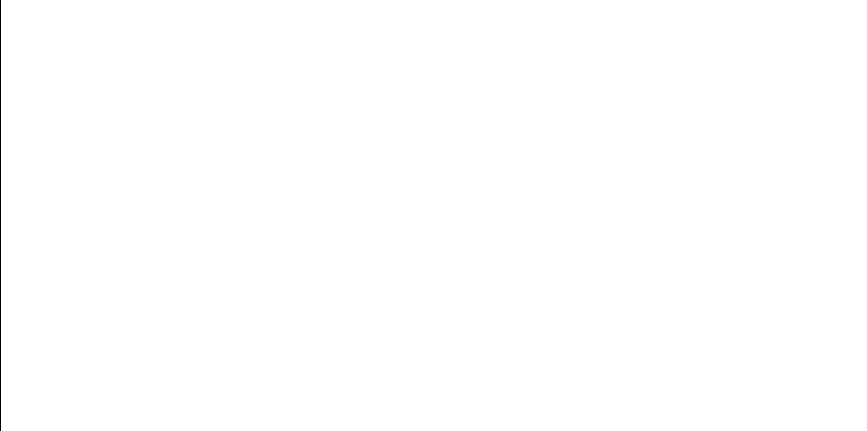

580.374343681 176.573157332
469.914149595 157.339990227
578.615482415 175.844087524
650.479321419 220.705876626
698.064798453 277.65643348
453.371087371 158.747872064
584.060938249 178.152243329
631.843749294 205.654141188
658.973148559 228.618595786
622.96459906 199.443537418


<IPython.core.display.Javascript object>


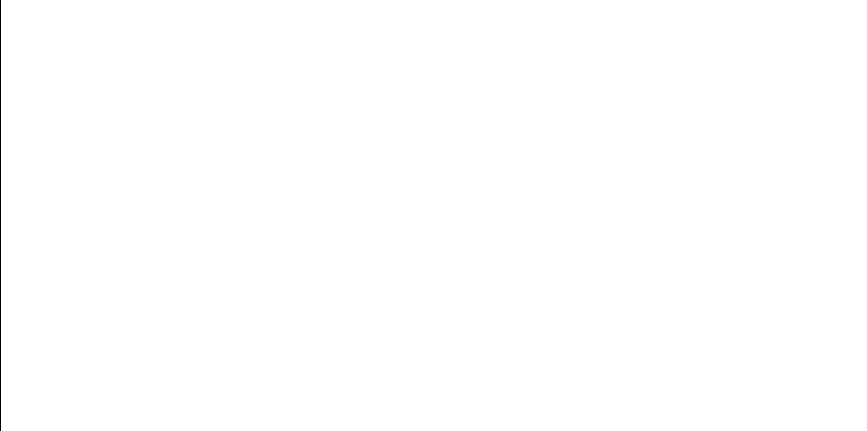

655.346528475 225.150403529
626.797419438 202.054832955
683.222822328 255.980976937
731.055692213 364.588587493
447.950585959 159.449326638
614.223299223 193.861798508
529.094863017 161.251612309
733.601712993 382.489974633
716.248178304 313.609815401
632.731180699 206.306700835


<IPython.core.display.Javascript object>


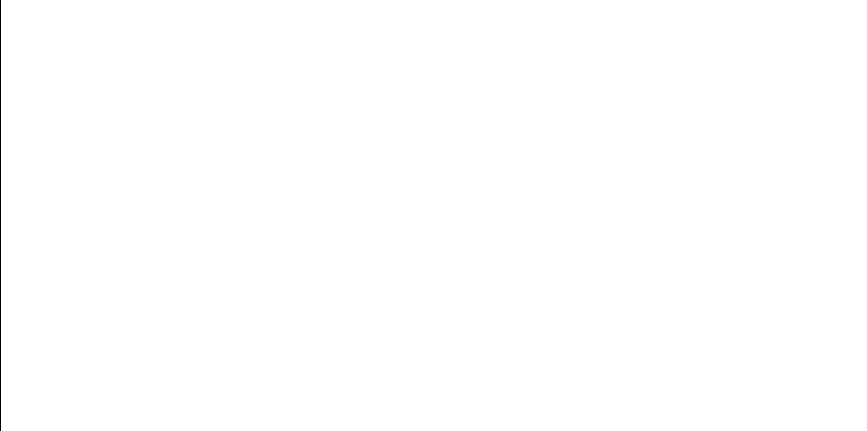

448.9413233 159.312181832
532.411628756 161.891742462
498.690552147 157.488953377
636.616125319 209.234922867
633.745582704 207.059985899
703.305241878 286.649681647
601.473875526 186.586104711
673.67855792 244.240516056
592.75692365 182.157725036
639.537746435 211.51599067


<IPython.core.display.Javascript object>


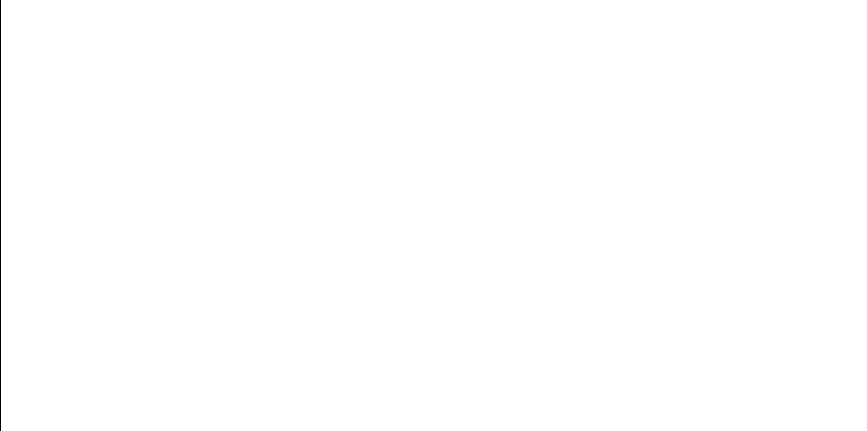

540.081077342 163.549901997
636.478979068 209.129534488
722.806778075 331.56157808
623.311861101 199.675893327
501.694504553 157.694378297
655.869881025 225.642414298
671.747716244 242.032040161
562.503806183 169.870025295
567.94926185 171.749872685
506.521547638 158.100145881


<IPython.core.display.Javascript object>


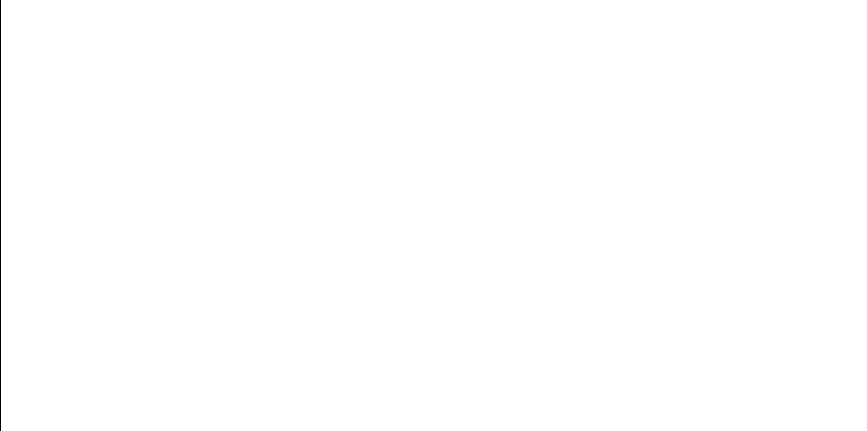

629.551739149 203.996127469
522.397667766 160.098767029
580.636902348 176.683329699
622.96459906 199.443537418
658.100867793 227.771729307
733.436912002 380.975847792
731.520553708 367.268304798
573.315075269 173.740170919
734.885551441 401.405990833
636.931285915 209.477672386


<IPython.core.display.Javascript object>


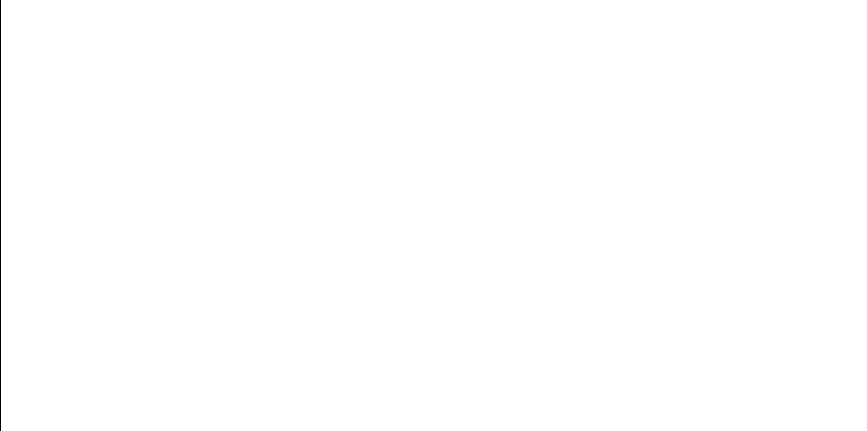

481.831814904 157.002707666
673.522075937 244.05959082
688.722698407 263.459038893
601.473875526 186.586104711
534.698113344 162.359968625
600.138943943 185.88014922
460.888674377 157.971935276
529.094863017 161.251612309
632.855450014 206.398558492
590.12076919 180.901028481


<IPython.core.display.Javascript object>


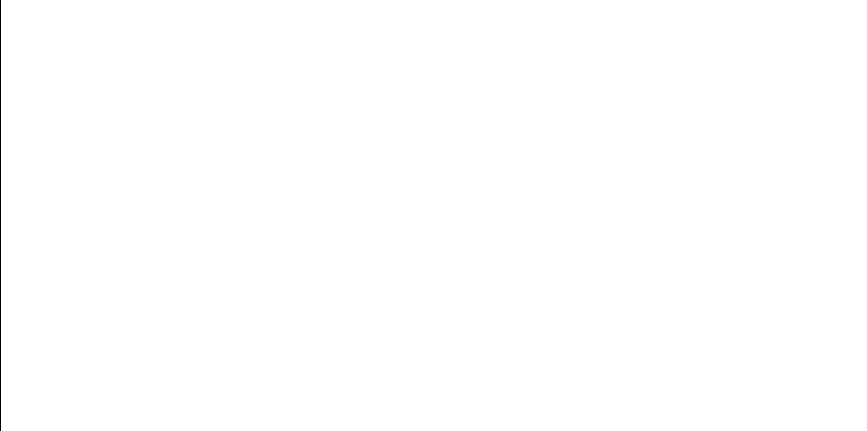

733.820499135 384.646823332
534.698113344 162.359968625
658.100867793 227.771729307
595.870463955 183.690749487
467.092157977 157.50260327
362.715726713 187.559954841
636.616125319 209.234922867
732.446341514 373.215608076
448.481754203 159.375300286
581.521813214 177.057221882


<IPython.core.display.Javascript object>


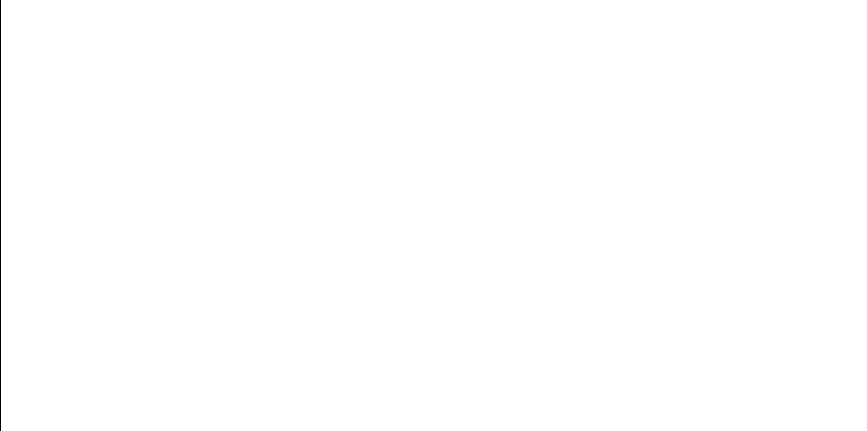

484.123215938 157.002503215
602.164977238 186.955616599
733.681199596 383.252453141
439.695324962 160.748705704
685.081865169 258.444628891
725.220572517 339.478821576
726.446804013 343.902737264
630.00766747 204.322825638
586.540183982 179.253552147
605.679657191 188.877984492


<IPython.core.display.Javascript object>


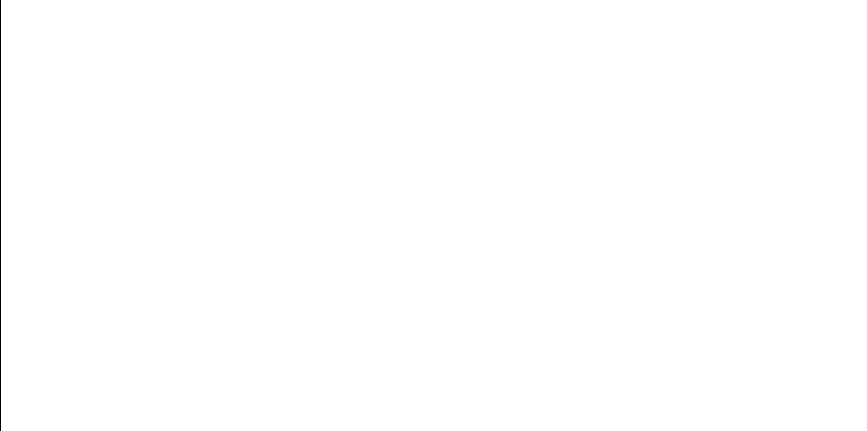

542.287081876 164.073394825
562.626254829 169.910770753
705.123891033 289.983290954
710.805749253 301.257062379
646.801837089 217.49815101
525.834380474 160.667126925
707.83786474 295.193433498
685.310013116 258.751344122
594.81734906 183.166254848
648.799045812 219.2246686


<IPython.core.display.Javascript object>


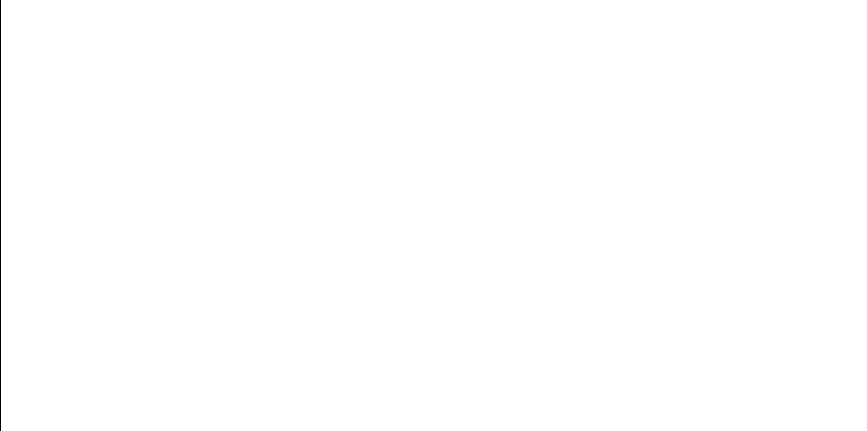

706.72014994 293.011662178
704.409666437 288.659817151
654.135834536 224.022903748
536.055374147 162.64836661
722.683332906 331.180337143
605.124416296 188.569450973
734.985157528 406.26497066
573.129370379 173.668963808
689.380041809 264.392675348
596.963964626 184.241874971


<IPython.core.display.Javascript object>


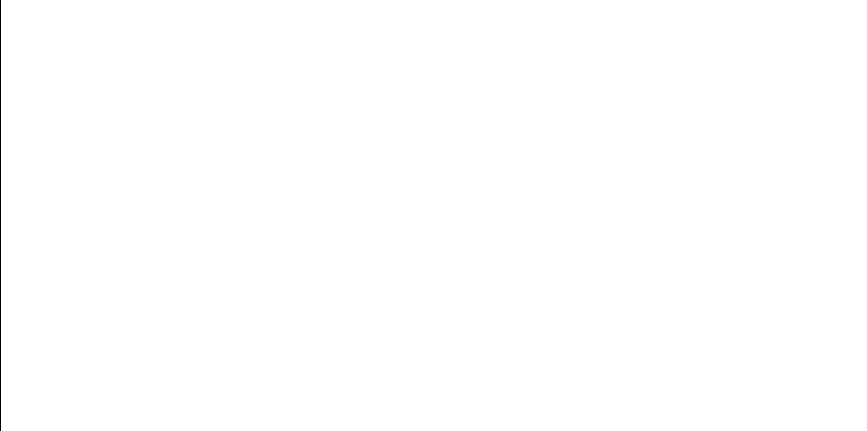

634.587712108 207.691367453
652.161753665 222.215897097
716.070870594 313.177407255
688.722698407 263.459038893
587.6041506 179.73602185
614.299323616 193.908187934
621.331416614 198.361876248
728.772502514 353.323460883
409.850662398 167.850307053
704.409666437 288.659817151


<IPython.core.display.Javascript object>


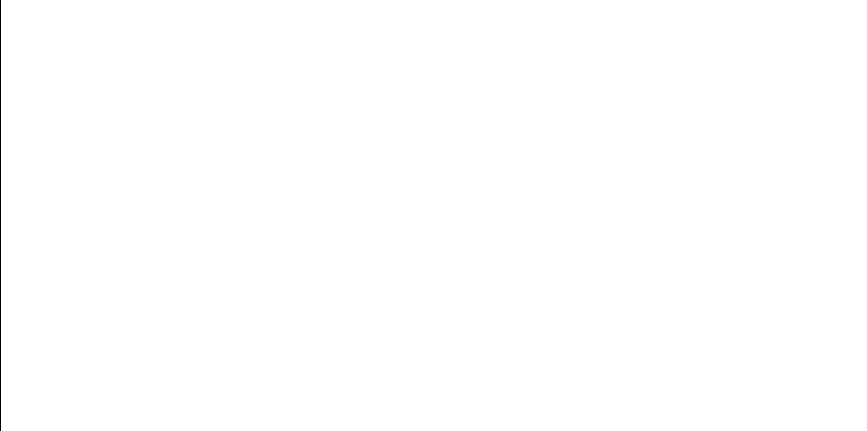

622.48522083 199.124148197
374.150331583 181.720987142
675.18353845 245.998504458
691.083980005 266.85550568
609.424646589 191.007319538
732.937920721 376.828027947
681.360754173 253.574740778
636.825711499 209.396266363
637.93832128 210.258669123
675.951318767 246.908085995


<IPython.core.display.Javascript object>


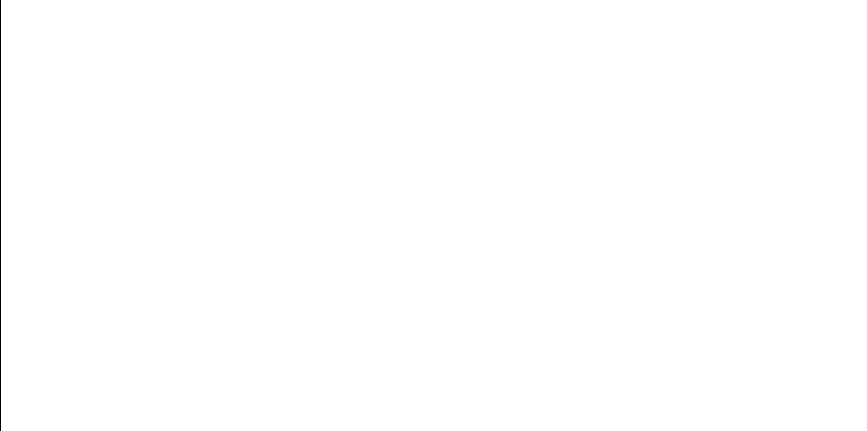

597.485933597 184.507302995
579.464972462 176.194267493
585.033927092 178.580648117
691.65006625 267.687757593
731.055692213 364.588587493
394.065692466 173.214739766
498.369226152 157.469113452
732.828322885 375.987743422
729.889984076 358.509052662
507.559900943 158.199658561


<IPython.core.display.Javascript object>


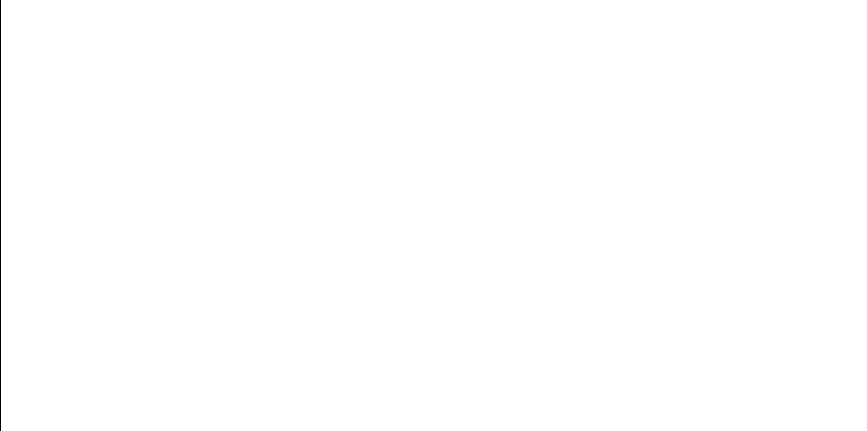

581.999750536 177.260816016
603.212880047 187.521189567
653.046380858 223.020892687
531.506839312 161.712542696
534.94755658 162.412386026
715.840437364 312.618825863
597.485933597 184.507302995
518.820779184 159.558881139
643.493542871 214.717157997
629.007899189 203.608438892


<IPython.core.display.Javascript object>


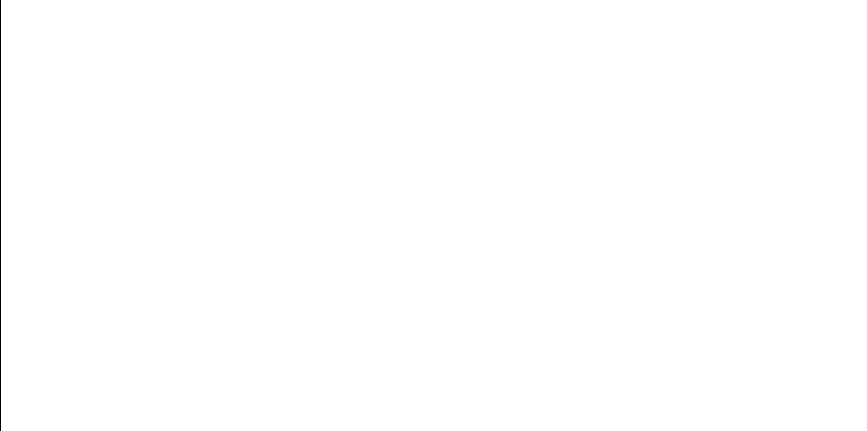

619.220602998 196.99069049
391.45654793 174.215425585
628.021746508 202.910958468
519.102819597 159.599546077
731.390977539 366.503855737
584.060938249 178.152243329
607.449945871 189.873983807
579.913103284 176.380459953
603.212880047 187.521189567
598.34603594 184.948014977


<IPython.core.display.Javascript object>


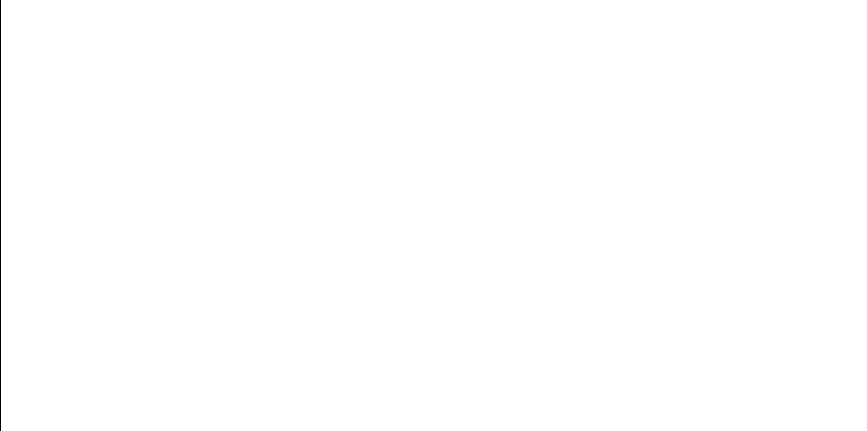

730.861023982 363.51469698
498.690552147 157.488953377
654.248214753 224.126938296
607.449945871 189.873983807
666.927367141 236.736470439
376.070177067 180.811453032
685.639737364 259.196339027
645.998004792 216.813500906
660.667488864 230.287204149
688.973051443 263.813560967


<IPython.core.display.Javascript object>


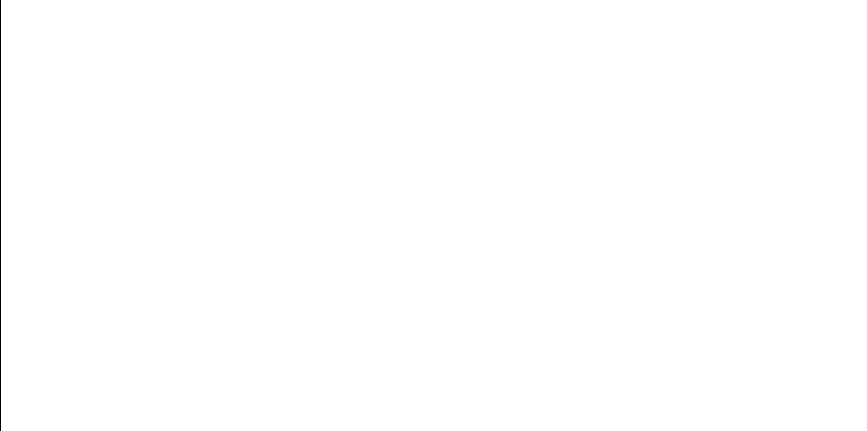

676.145278095 247.139252598
655.423497708 225.222587247
546.228290963 165.061107607
575.975667023 174.778896464
669.67128486 239.713758951
370.920292692 183.296346485
531.953474681 161.800571771
423.087825843 164.225549969
716.070870594 313.177407255
469.914149595 157.339990227


<IPython.core.display.Javascript object>


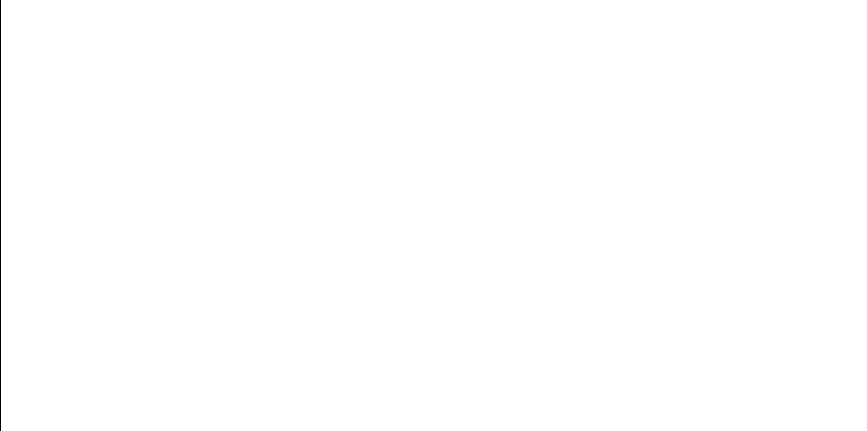

665.652974008 235.385798144
451.112620749 159.025611223
630.29904263 204.532418119
590.872260073 181.255459985
585.033927092 178.580648117
651.763696912 221.856165999
598.664136446 185.112064773
448.481754203 159.375300286
680.272392497 252.195653254
734.95305123 404.135847881


<IPython.core.display.Javascript object>


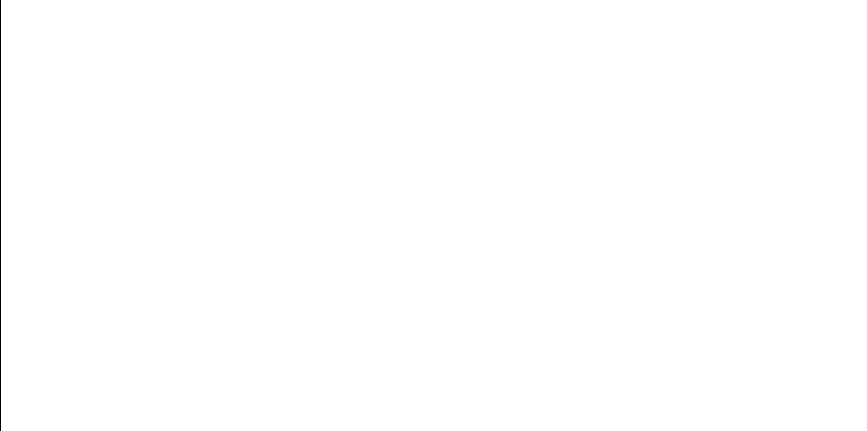

716.203864342 313.50153061
340.291030159 201.302744537
654.808475389 224.647490431
420.191466579 164.952692845
658.100867793 227.771729307
650.479321419 220.705876626
682.844441764 255.487137034
612.313046031 192.708215306
730.16985223 359.897411998
667.091060941 236.911414435


<IPython.core.display.Javascript object>


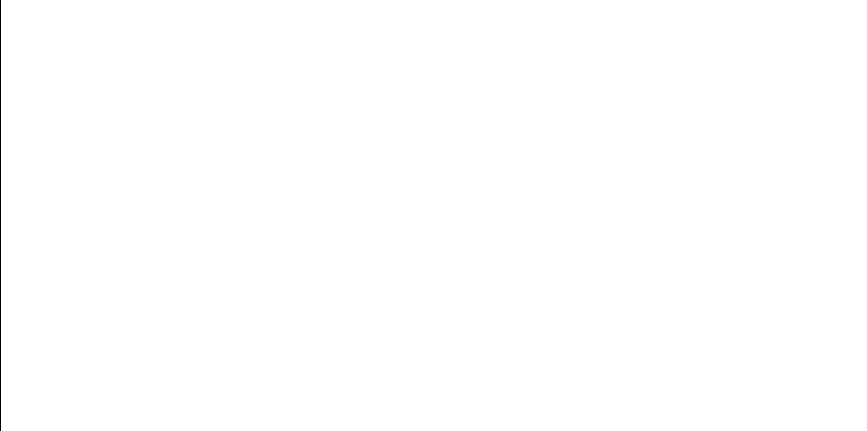

695.15989631 273.014050734
613.45583704 193.39555992
608.684406605 190.579694313
582.057981419 177.285701095
649.606342959 219.933010587
685.469046664 258.965720107
579.913103284 176.380459953
617.316173095 195.779068464
580.515987364 176.632549163
646.250596715 217.028015918


<IPython.core.display.Javascript object>


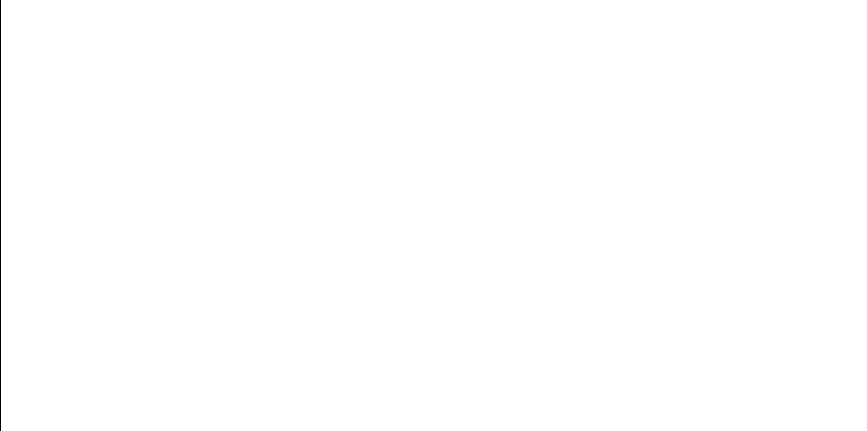

679.145768893 250.788630796
469.914149595 157.339990227
565.278744761 170.81056245
516.58629765 159.248201988
534.94755658 162.412386026
634.312893877 207.484719818
619.092046807 196.90814538
437.848138155 161.07801757
626.519226947 201.8618058
595.765090842 183.637992804


<IPython.core.display.Javascript object>


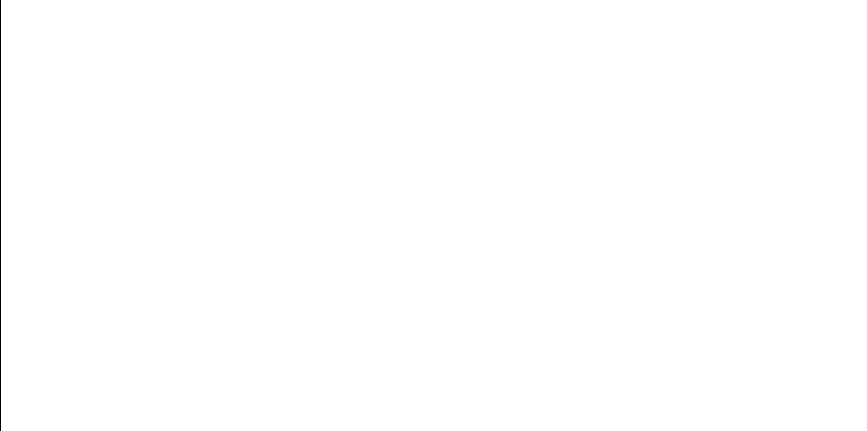

481.379279485 157.00521183
585.284487147 178.69176374
734.95305123 404.135847881
613.265041897 193.280230717
394.065692466 173.214739766
719.158100618 321.060523584
734.764793908 398.11475546
548.533740322 165.670328814
629.551739149 203.996127469
541.180938088 163.80828227


<IPython.core.display.Javascript object>


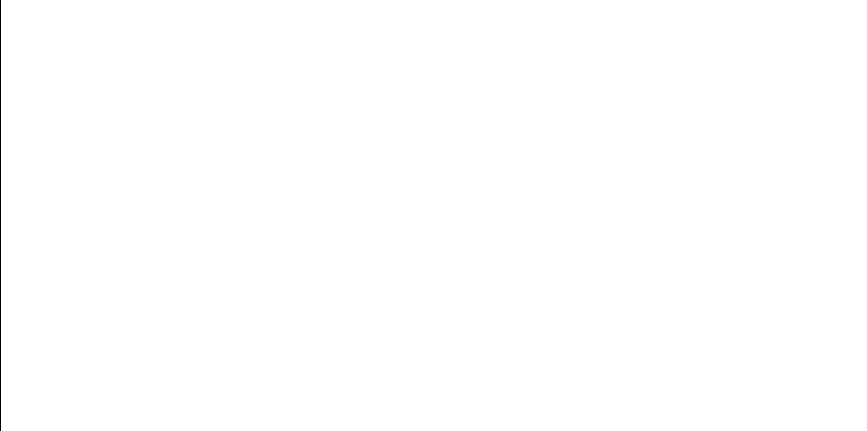

675.953263008 246.910400413
562.782697846 169.962929393
597.485933597 184.507302995
566.852491449 171.360020877
655.917638921 225.687452284
503.782210332 157.858407002
548.533740322 165.670328814
701.156951155 282.859028612
500.305857589 157.594933836
618.089448612 196.268147957


<IPython.core.display.Javascript object>


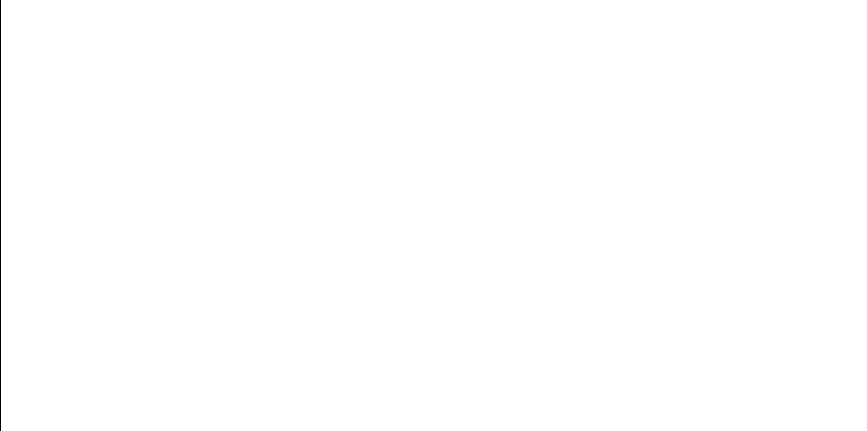

397.352387773 172.001083294
633.946788724 207.210339774
656.240677492 225.99271145
557.764240068 168.346081671
703.524600782 287.045498443
561.192047305 169.437891689
636.825711499 209.396266363
687.791862099 262.152142616
504.985863978 157.960915822
513.246193166 158.821727964


<IPython.core.display.Javascript object>


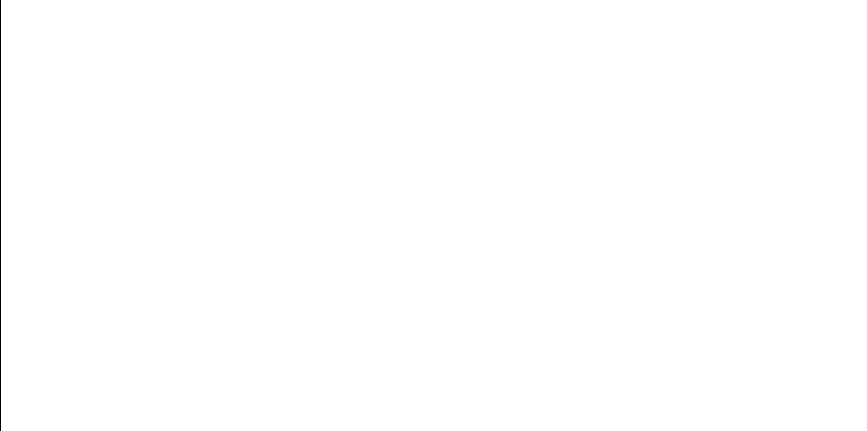

592.75692365 182.157725036
666.631604885 236.42122469
630.318402381 204.546366332
733.362556631 380.319166026
565.278744761 170.81056245
653.070182265 223.042657837
671.747716244 242.032040161
578.722303619 175.887922686
597.485933597 184.507302995
643.528358023 214.745923414


<IPython.core.display.Javascript object>


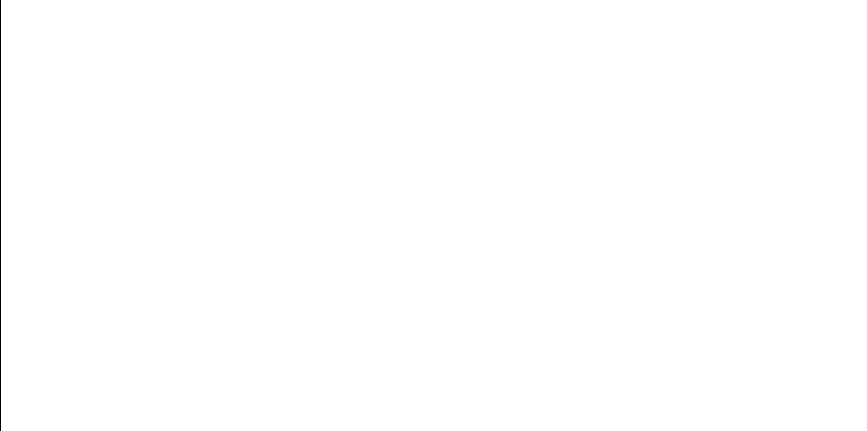

567.449671069 171.571583301
648.186870299 218.691571703
584.060938249 178.152243329
676.731756661 247.841672691
734.814513874 399.333014816
641.008530322 212.690794038
522.117781582 160.054626144
640.180838577 212.02745373
507.587145655 158.202328024
573.620634048 173.857701201


<IPython.core.display.Javascript object>


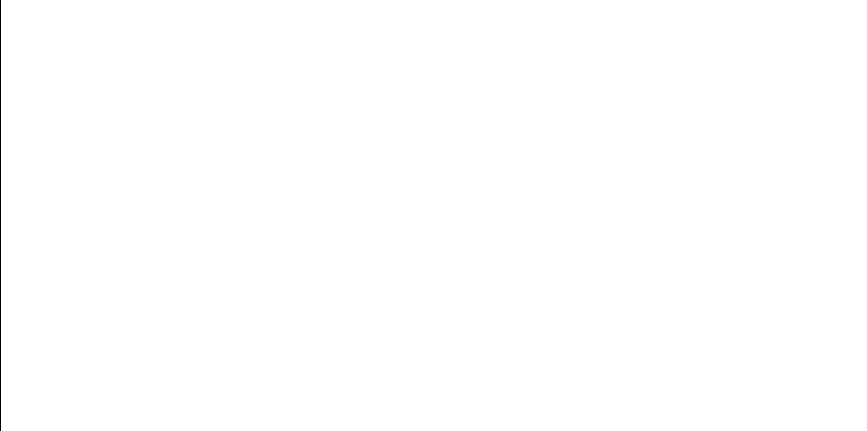

600.431741102 186.034114309
707.83786474 295.193433498
611.949907208 192.491521111
602.354816751 187.057602702
620.563352706 197.859468618
570.233840566 172.580336985
673.19204469 243.679141858
718.652838205 319.715399728
637.979979494 210.291152798
667.13405328 236.957416834


<IPython.core.display.Javascript object>


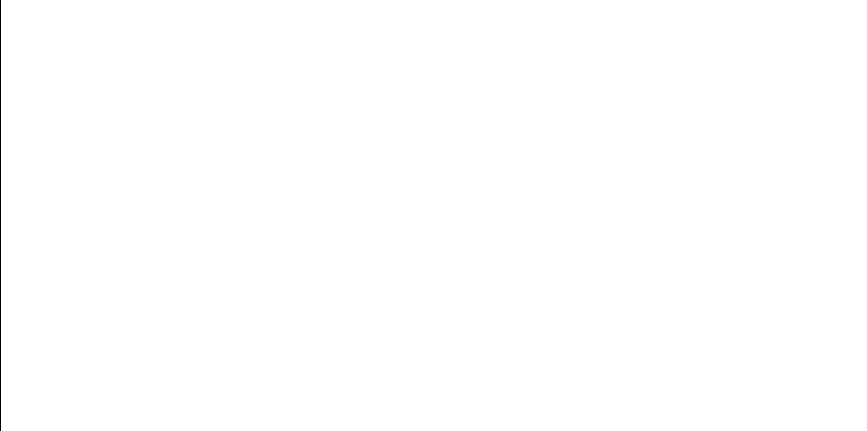

703.530839905 287.056781039
638.232693642 210.488512109
680.272392497 252.195653254
506.47193647 158.095499844
714.148529982 308.628903129
643.528358023 214.745923414
734.962240867 404.637755481
510.901467896 158.54938992
710.044920963 299.662888894
637.53706534 209.94650107


<IPython.core.display.Javascript object>


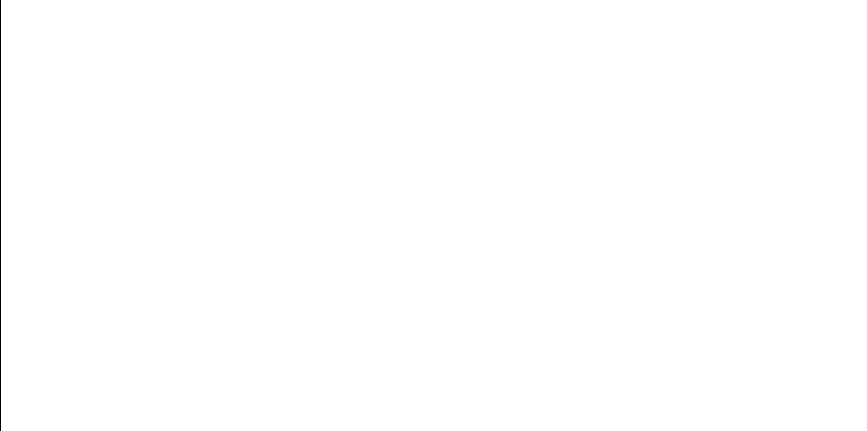

653.027191058 223.003348684
442.011281126 160.355826682
611.51443125 192.232749336
535.804801635 162.594535523
530.611248762 161.538550495
540.081077342 163.549901997
658.25979686 227.925419772
673.005818703 243.46514307
591.545958539 181.575782106
541.128827381 163.795922898


<IPython.core.display.Javascript object>


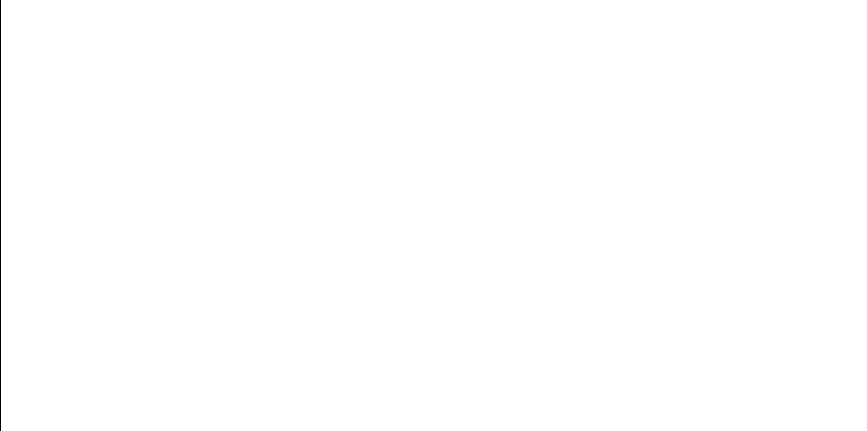

507.587145655 158.202328024
731.885823736 369.505104843
652.161753665 222.215897097
610.991383036 191.923502266
668.402072362 238.324660352
630.29904263 204.532418119
662.218131588 231.842269968
561.091196473 169.404997896
718.503026303 319.320991296
504.985863978 157.960915822


<IPython.core.display.Javascript object>


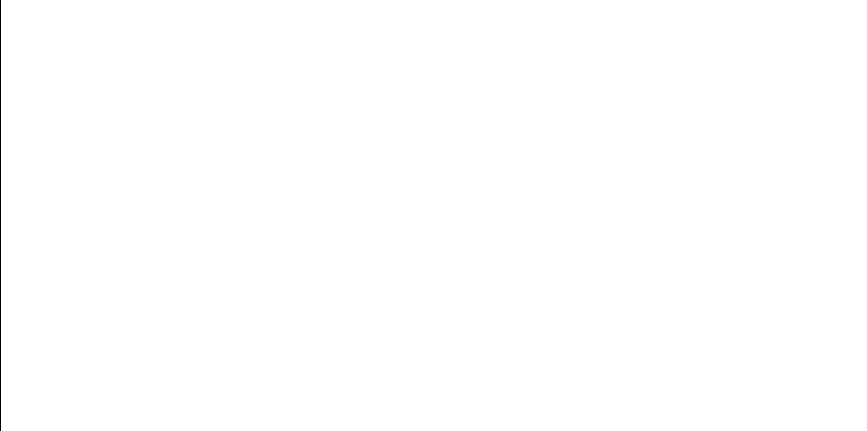

566.99142152 171.409088745
727.001148624 346.012386374
654.808475389 224.647490431
565.419853936 170.859353161
548.61690485 165.692741995
456.856568265 158.359777815
641.771735433 213.307547341
726.446804013 343.902737264
608.684406605 190.579694313
647.008793654 217.675365924


<IPython.core.display.Javascript object>


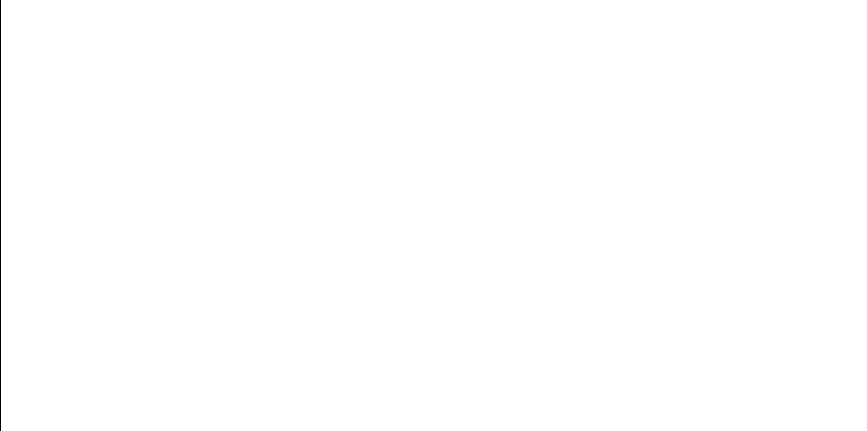

389.203180818 175.106527001
696.703341666 275.452698414
713.937117189 308.143429046
548.61690485 165.692741995
723.473792381 333.658410038
597.485933597 184.507302995
601.473875526 186.586104711
408.349921663 168.310644597
724.947030755 338.532743002
375.883630961 180.898962116


<IPython.core.display.Javascript object>


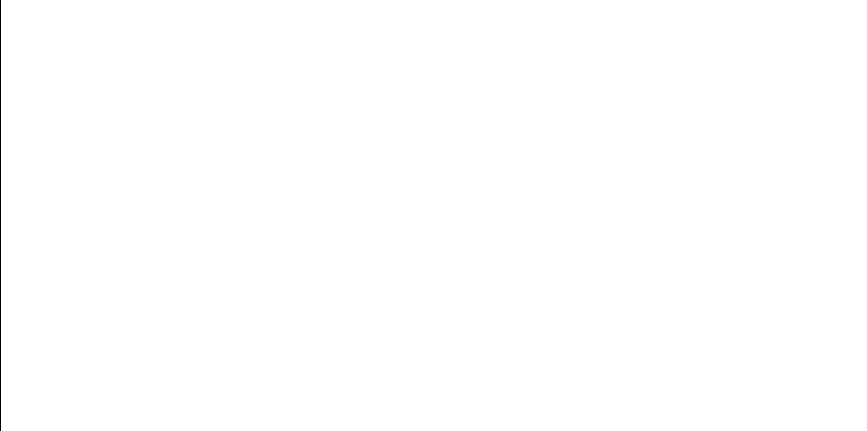

574.959629309 174.378119994
585.842406486 178.940356803
734.764793908 398.11475546
510.480888879 158.502892738
560.247590196 169.131682357
730.499583501 361.587383887
370.920292692 183.296346485
612.313046031 192.708215306
570.88371674 172.821143343
724.428860763 336.777391415


<IPython.core.display.Javascript object>


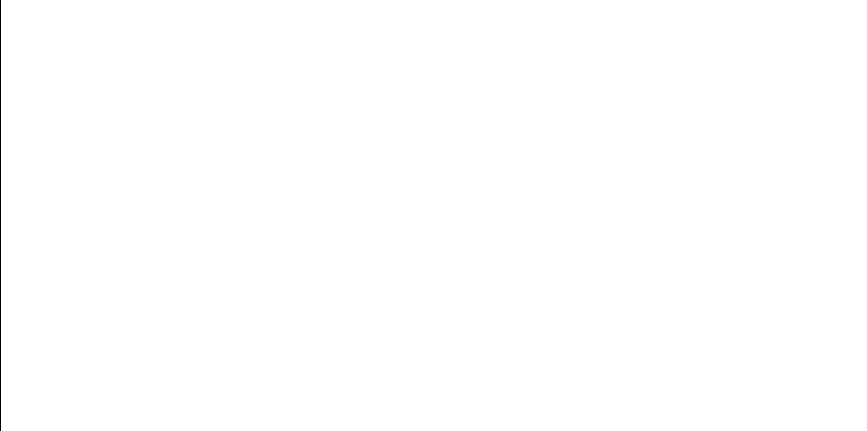

614.223299223 193.861798508
389.203180818 175.106527001
729.240972809 355.433375035
573.620634048 173.857701201
668.999298809 238.97570514
563.894279952 170.336815845
550.22999548 166.133518764
465.973668408 157.575848351
571.905829366 173.204000236
586.523200534 179.245898946


<IPython.core.display.Javascript object>


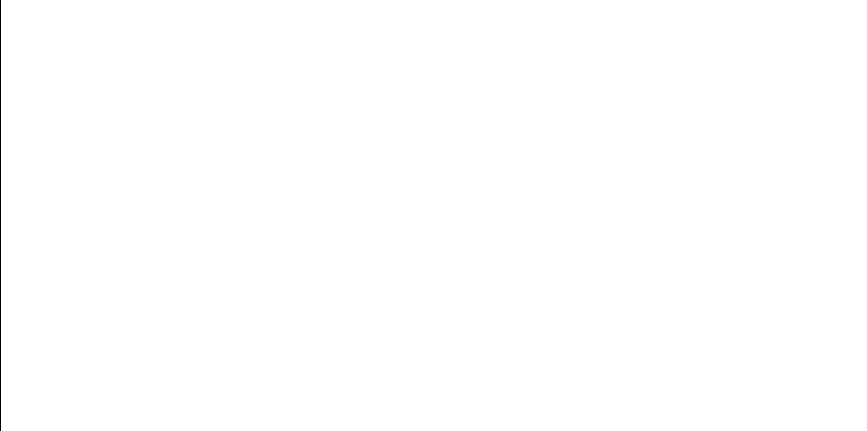

555.407348018 167.626480423
675.837123007 246.772246548
698.730141374 278.7521359
641.827877066 213.353110255
627.863669533 202.799812684
692.979042809 269.670169809
655.869881025 225.642414298
596.834382354 184.176217019
607.654571403 189.990324807
570.881576251 172.820346863


<IPython.core.display.Javascript object>


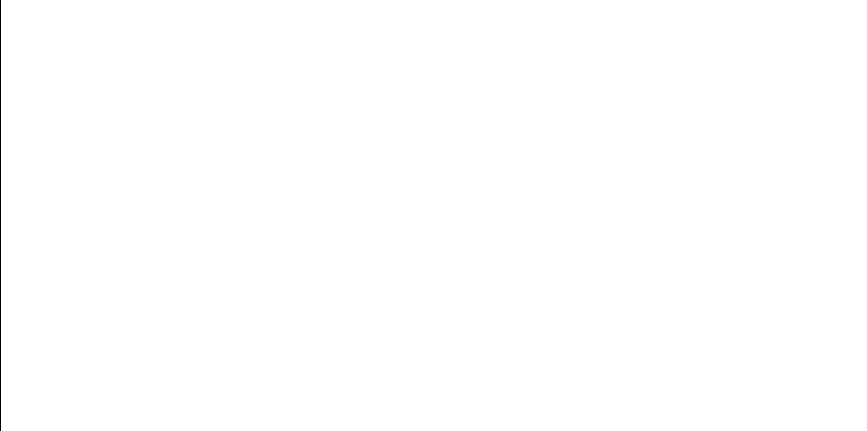

441.40548903 160.456449174
672.359496714 242.726186655
417.160337338 165.752926388
679.215393597 250.87498833
488.604019077 157.062319273
584.842113771 178.495805108
591.176327494 181.399731613
494.376273795 157.256915895
708.668448035 296.849424604
688.57638859 263.252449577


<IPython.core.display.Javascript object>


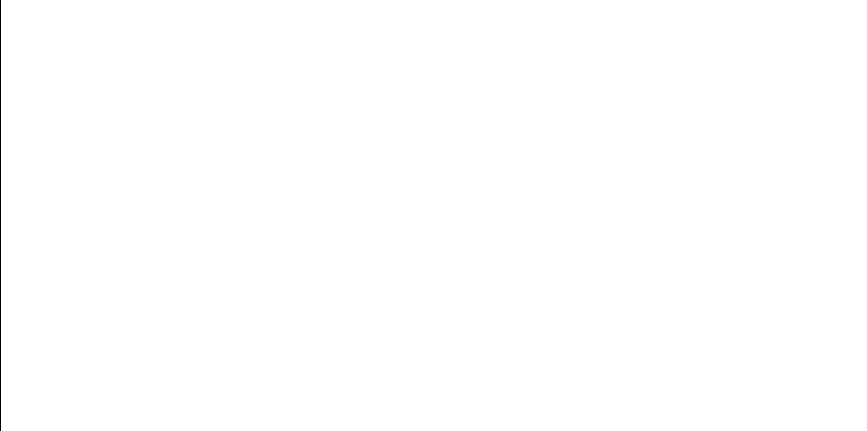

589.168791897 180.456376971
633.350451013 206.765626364
667.091060941 236.911414435
606.845804254 189.531968686
507.28900874 158.173278827
560.948932287 169.358676445
689.314725848 264.299502772
450.787512832 159.067297717
421.808430449 164.542249426
718.227083614 318.59967293


<IPython.core.display.Javascript object>


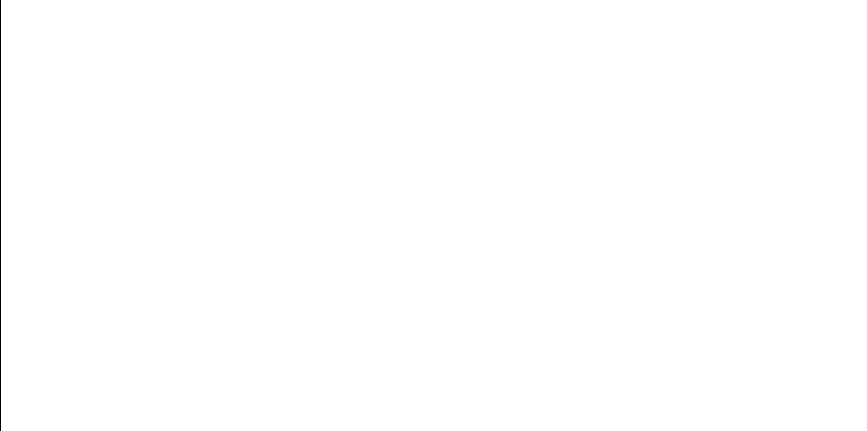

569.685632641 172.378781396
597.566591793 184.548455018
506.521547638 158.100145881
703.530839905 287.056781039
692.979042809 269.670169809
683.835227905 256.785640518
585.842406486 178.940356803
715.982455437 312.962635092
629.007899189 203.608438892
731.885823736 369.505104843


<IPython.core.display.Javascript object>


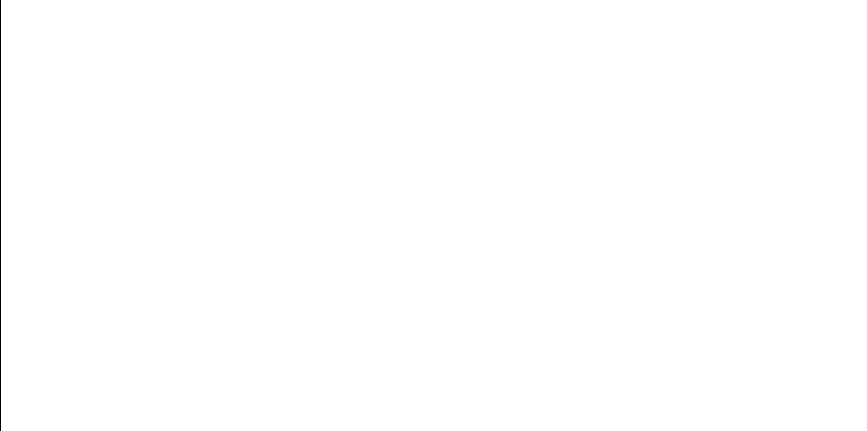

383.974213457 177.271940414
703.674888483 287.317652911
705.123891033 289.983290954
580.636902348 176.683329699
562.503806183 169.870025295
534.786282932 162.378466268
503.112403957 157.803878997
717.880382512 317.702651128
603.83519106 187.86009722
727.71244347 348.835059953


<IPython.core.display.Javascript object>


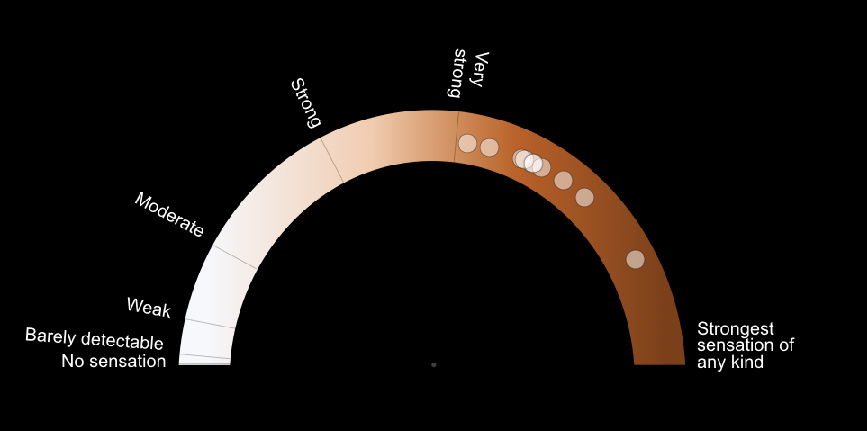

624.828892716 200.700779668
578.722303619 175.887922686
648.799045812 219.2246686
518.403791041 159.499355552
542.287081876 164.073394825
590.710679941 181.178996959
581.521813214 177.057221882
600.431741102 186.034114309
704.554104037 288.925943749
591.176327494 181.399731613


In [43]:
condition_list = ['cognitive', 'pain', 'vicarious']
for ind, condition in enumerate(condition_list):
    high_dir = os.sep.join([main_dir, 'stimuli', 'cue', 'task-'+ condition, 'sch'])

    if os.path.exists(high_dir): # if high_dir exists, wipe out every stimuli
        shutil.rmtree(high_dir) # we don't want multiple high cues than intended

    if not os.path.exists(high_dir):
        os.makedirs(high_dir)

    x0, y0 = 0.5, 0.5
    r = 252
    centerX = 483
    centerY = 409

    sample_data = pd.DataFrame()
    for fignum in range(1,57):

        # Read Images 
        plt.cla()
        img_scale = os.sep.join([main_dir, 'stimuli', 'ratingscale', 'task-'+ condition + '_scale.png'])
        display_image_in_actual_size(img_scale)

        # sample 10 radians
        high_sample = []
        high_sample = abs(np.random.choice(high_dist, 10, replace=True))
        # add sample to pd dataframe
        col_name = []
        col_name = 'figure' + '{:03d}'.format(fignum)
        sample_data[col_name] = high_sample

        for rad in range(10):
            if high_sample[rad]/pi > 1:
                # if the radians goes off the circular rating chart, 
                # flip the radians so that it's within the range of the circular rating image
                high_sample[rad] = (1 - (high_sample[rad]/pi-1))*pi
                x = centerX + r * cos(high_sample[rad])
                y = centerY - r * sin(high_sample[rad])
            else:
                x = centerX + r * cos(high_sample[rad])
                y = centerY - r * sin(high_sample[rad])
            print x,y
            plt.scatter( x,y,s=15**2, c='white', alpha=0.5, edgecolors='black', linewidths=.5)

        # calculate sample mean
        file_mean_original = np.mean(high_sample)
        file_mean_round = '{:.2f}'.format(round(file_mean_original, 2))
        file_mean = str(file_mean_round).replace(".", "")
        # calculate sample std
        file_std_original = np.std(high_sample)
        file_std_round = '{:.2f}'.format(round(file_std_original, 2))
        file_std = str(file_std_round).replace(".", "")
        # save image
        file_name = 'h' + '{:03d}'.format(fignum) + '_M' + str(file_mean) + '_STD'+ str(file_std) + '.png'
        file_fullname = os.path.join(high_dir, file_name)
        plt.savefig(file_fullname)

    # save pd dataframe
    sample_data.rename(index={0:'s01',1:'s02',2:'s03',3:'s04',4:'s05',5:'s06',6:'s07',7:'s08',8:'s09',9:'s10'}, inplace=True) 
    sample_data.loc['sample_mean'] = sample_data.mean()
    sample_data.loc['sample_std'] = sample_data.std()
    sample_data.to_csv(os.sep.join([main_dir, 'stimuli', 'cue', 'task-'+ condition, 'sch_data.csv']))

## low ratings

<IPython.core.display.Javascript object>


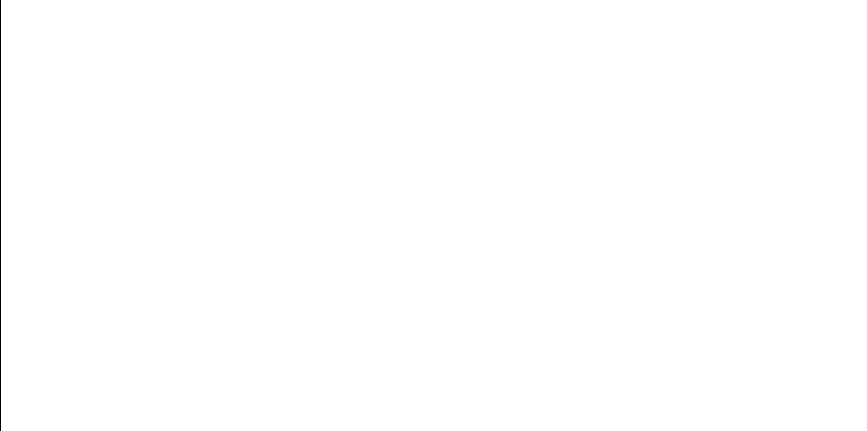

611.651150623 192.313864211
676.890570685 248.032777872
733.681177945 383.252242352
620.39544523 197.75016774
734.704505123 396.799913905
719.053456389 320.780015152
697.274345395 276.370799198
685.048799614 258.400257057
660.994906333 230.613303972
606.426791351 189.296046515


<IPython.core.display.Javascript object>


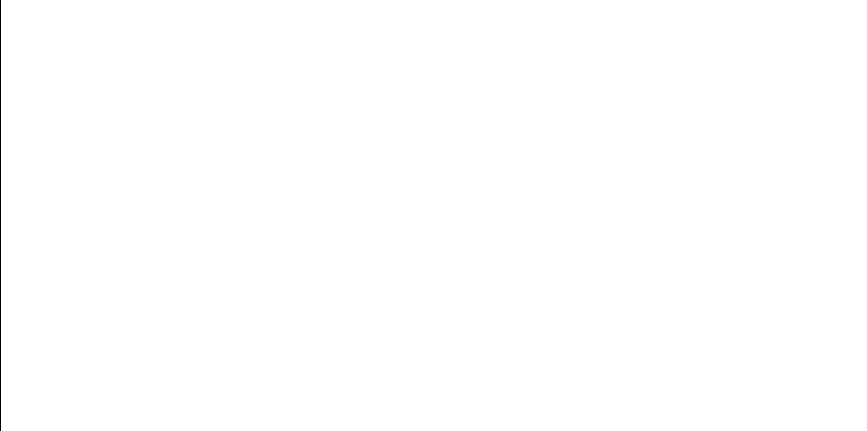

700.745479566 282.150064531
693.363345 270.251078994
645.982930463 216.800717021
715.786122766 312.487715562
655.167336031 224.982586683
563.024324113 170.043712051
387.977441929 175.601813508
715.628418104 312.108209377
594.281406721 182.901683955
543.84964908 164.456915439


<IPython.core.display.Javascript object>


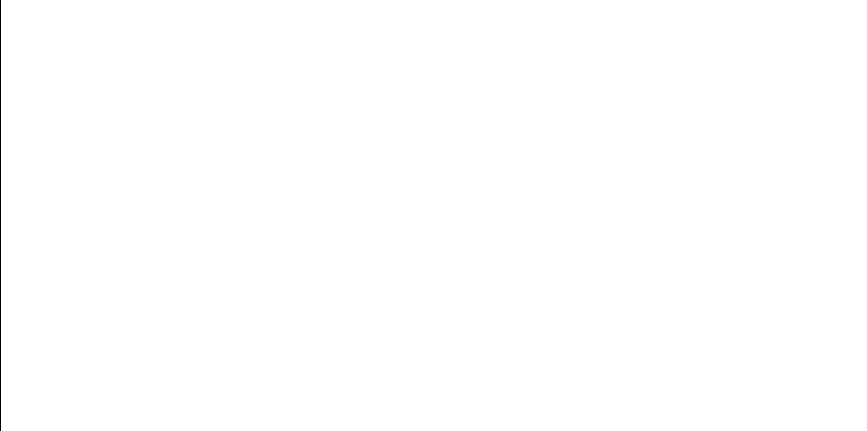

711.980405272 303.776552036
572.754166002 173.525607156
726.633972309 344.606774139
683.2895766 256.068363295
545.19276935 164.795046241
720.427871688 324.548796658
599.978689127 185.796088094
734.850109024 400.309626907
518.093157428 159.45547431
641.212008774 212.854746987


<IPython.core.display.Javascript object>


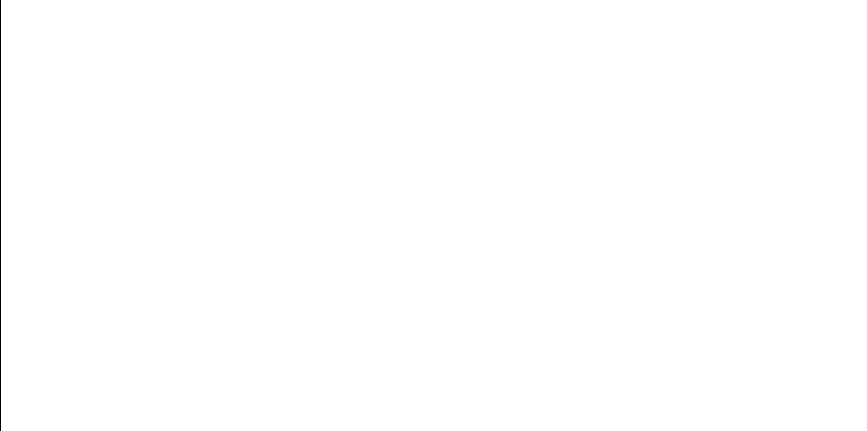

699.297759274 279.696947703
557.092737781 168.138491643
712.023740893 303.870907417
678.220948118 249.648873816
503.482569956 157.833791429
571.410767413 173.01793245
734.851639403 400.354091708
724.941873857 338.515039375
661.108746193 230.726966342
606.426791351 189.296046515


<IPython.core.display.Javascript object>


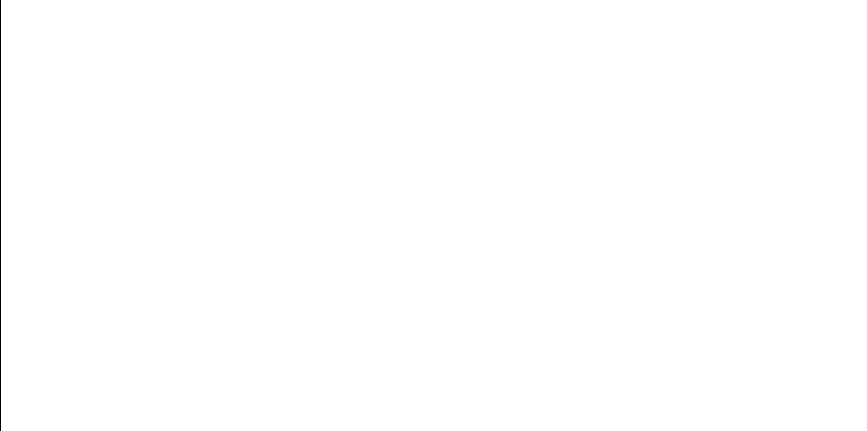

461.4683604 157.92154912
636.448237874 209.105932321
570.143148603 172.546893335
665.506545919 235.231876638
637.523915348 209.936292646
586.076415208 179.045107406
640.049027487 211.922342805
734.969739078 405.094799761
657.441992662 227.137438718
515.648181365 159.123838165


<IPython.core.display.Javascript object>


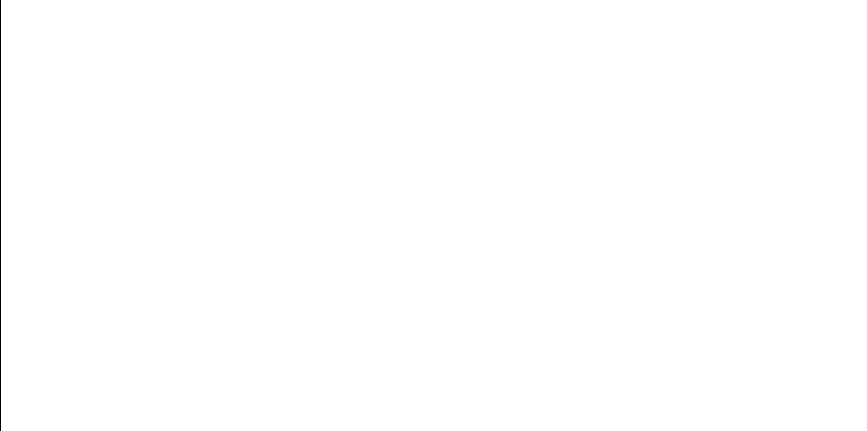

626.67799411 201.971900438
537.520517843 162.96847126
611.864390438 192.440611201
525.254813675 160.567854895
492.263170587 157.170308203
675.88347178 246.827356456
626.67799411 201.971900438
388.856555195 175.245830411
693.445282086 270.375387295
717.614232013 317.020860317


<IPython.core.display.Javascript object>


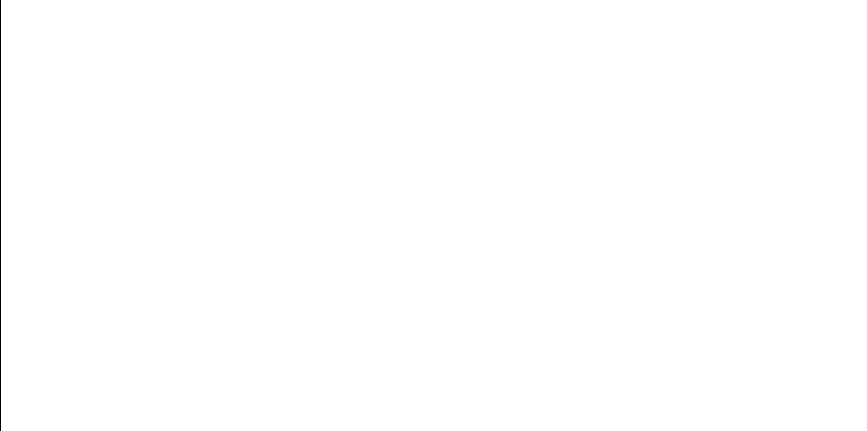

630.301558976 204.534230926
686.483792133 260.344874494
692.388242564 268.783867276
668.935425148 238.905856436
615.745486303 194.797675395
695.937111194 274.234326788
652.096095747 222.156454746
730.11378595 359.616026956
583.753972392 178.018102339
662.129458601 231.752610566


<IPython.core.display.Javascript object>


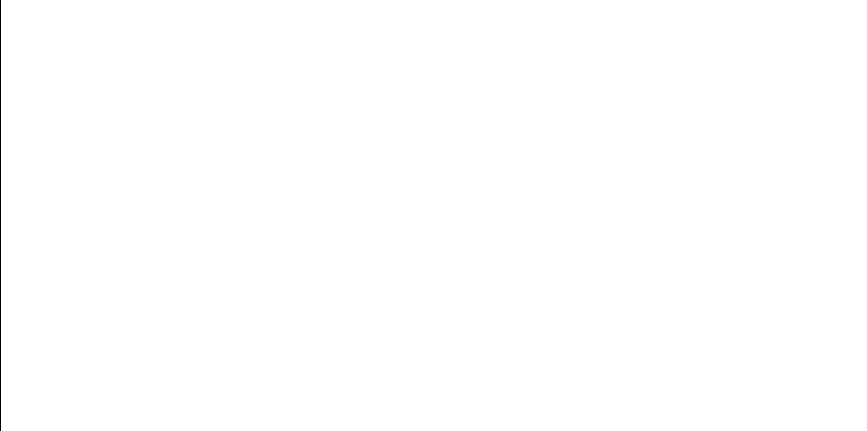

507.24757582 158.169270091
422.235746039 164.435682405
665.79755679 235.538035202
671.767968162 242.054936593
543.84964908 164.456915439
672.620329317 243.023704374
615.162032521 194.437195302
470.062492153 157.332320528
718.487092244 319.279158573
541.692866623 163.930321322


<IPython.core.display.Javascript object>


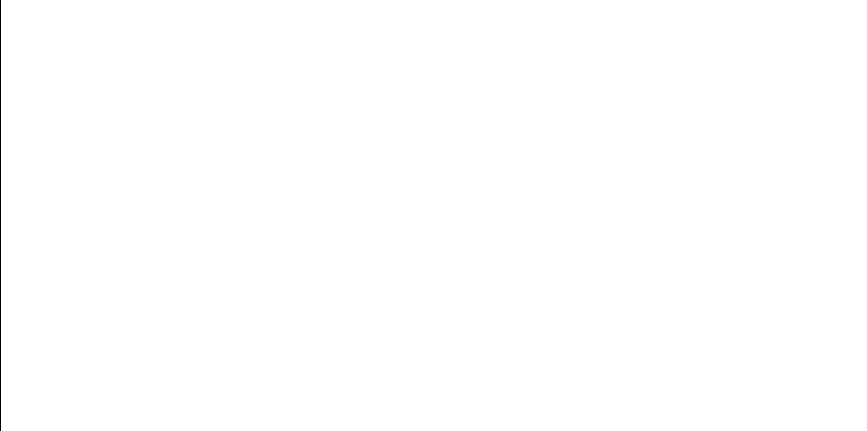

724.989915746 338.680154455
529.371455437 161.303233528
426.123332237 163.502454871
632.790789281 206.350747728
573.049747646 173.638484563
687.606330017 261.893746846
595.462960962 183.487068194
669.571827351 239.604152238
387.977441929 175.601813508
457.200645851 158.324126958


<IPython.core.display.Javascript object>

581.116765406 176.88558781
602.384074203 187.073339081
691.494836512 267.458828788
653.282521922 223.237079244
671.424480509 241.667351826
693.445282086 270.375387295
720.178048531 323.849701732
445.071743729 159.87062121
642.647490097 214.021337307
672.501993058 242.888607774


<IPython.core.display.Javascript object>

712.915575824 305.835917134
669.571827351 239.604152238
570.143148603 172.546893335
734.297553363 390.197349292
567.576676579 171.6167955
566.038132355 171.074237261
734.753168004 397.849107669
597.638293598 184.585068142
417.207705002 165.740110337
686.2516707 260.027659085


<IPython.core.display.Javascript object>

603.316008768 187.577196219
734.953108424 404.138811292
659.932896341 229.559898038
691.514147601 267.487278839
644.459938357 215.519540248
515.64354269 159.123232131
712.965056596 305.946262829
598.008884768 184.774764078
720.427871688 324.548796658
622.47337936 199.11627874


<IPython.core.display.Javascript object>

680.791033619 252.850369774
593.790037888 182.660503878
518.093157428 159.45547431
636.479646499 209.130047004
574.162797965 174.067362278
650.990350315 221.161659396
647.890540545 218.434762774
622.47337936 199.11627874
432.113295229 162.191282007
567.418382531 171.560456767


<IPython.core.display.Javascript object>


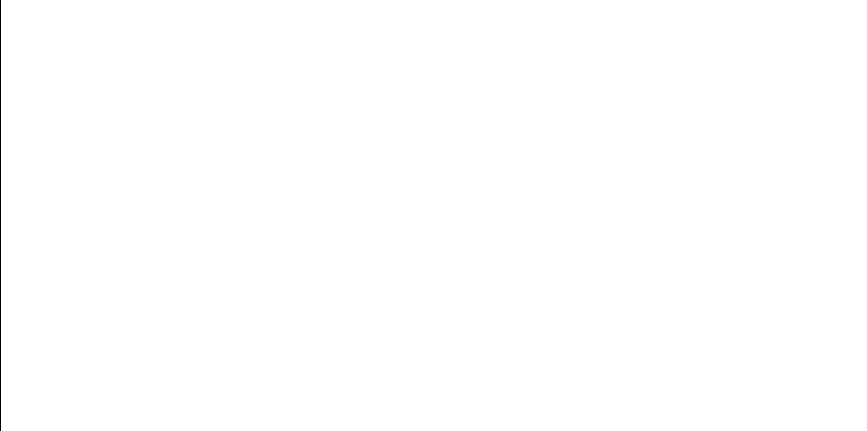

657.265866957 226.9686631
704.722233206 289.236686326
637.848529844 210.188700509
533.921725647 162.198505156
664.14201524 233.809902349
458.76825405 158.167740336
708.154231473 295.820620033
512.458349467 158.727736961
712.187153015 304.22763297
682.875071758 255.527019675


<IPython.core.display.Javascript object>


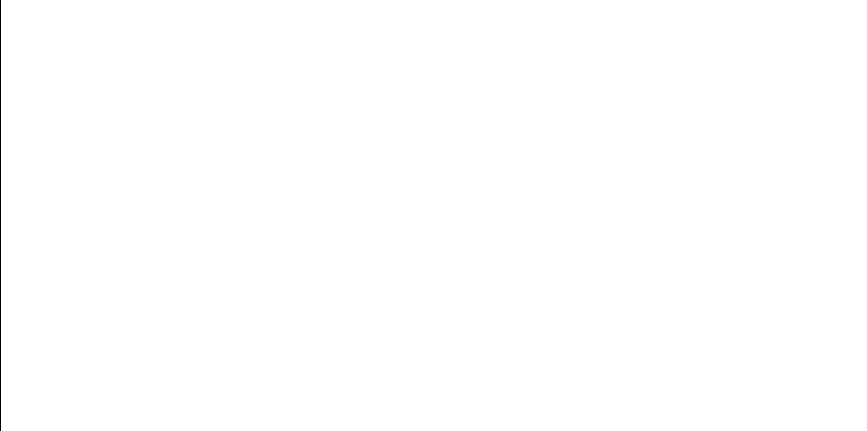

712.086913033 304.008637132
455.249808569 158.532583206
730.231742878 360.209987563
534.095197546 162.234360601
584.506112312 178.347644358
725.391294517 340.076416646
556.807777182 168.051017791
703.155466514 286.380382629
518.093157428 159.45547431
523.211454586 160.228942761


<IPython.core.display.Javascript object>


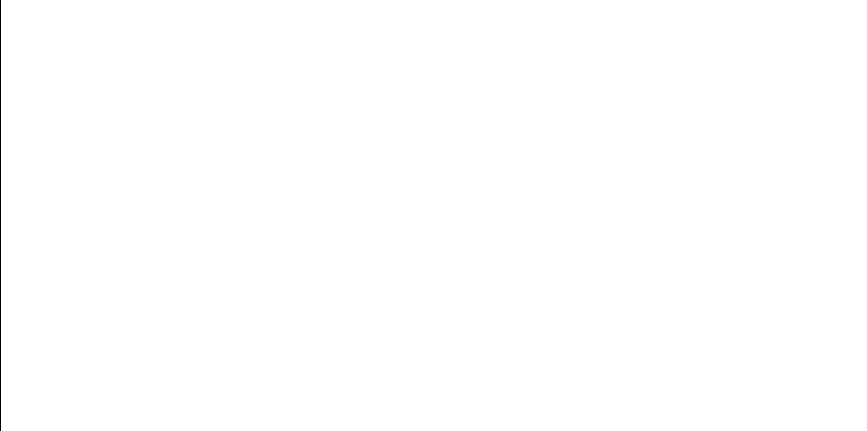

645.982930463 216.800717021
694.107515999 271.385986583
734.297553363 390.197349292
732.874401271 376.338346808
725.259801536 339.615646148
724.858526238 338.229573365
522.427273526 160.103455021
678.220948118 249.648873816
692.884632496 269.527991905
389.936740268 174.813685951


<IPython.core.display.Javascript object>


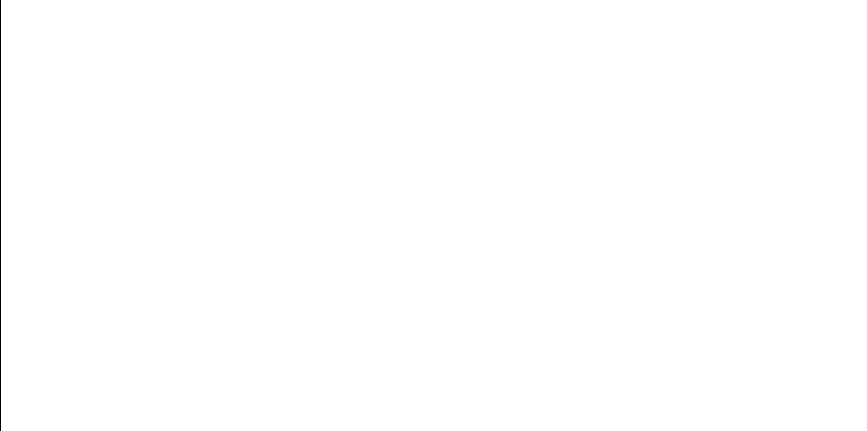

719.471816626 321.907635573
613.610480973 193.489206164
677.988375616 249.364373104
627.511419396 202.552792065
592.911052304 182.232364343
709.488427876 298.514742892
580.288951833 176.537401178
529.371455437 161.303233528
681.035118777 253.160044498
594.110279251 182.8175386


<IPython.core.display.Javascript object>


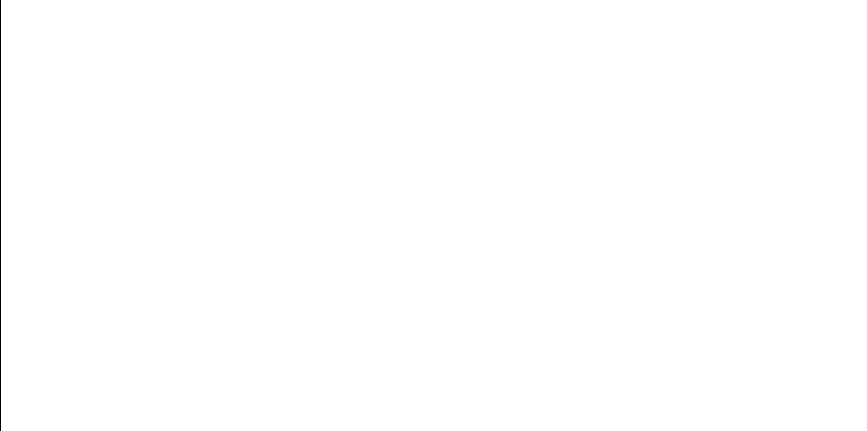

537.686191575 163.005243042
604.137968588 188.025810181
667.071211583 236.89018312
570.233052336 172.580046146
569.281661596 172.23117842
498.614675495 157.484231291
660.147853878 229.772106338
691.514147601 267.487278839
503.90604058 157.868684814
718.390086347 319.024963186


<IPython.core.display.Javascript object>


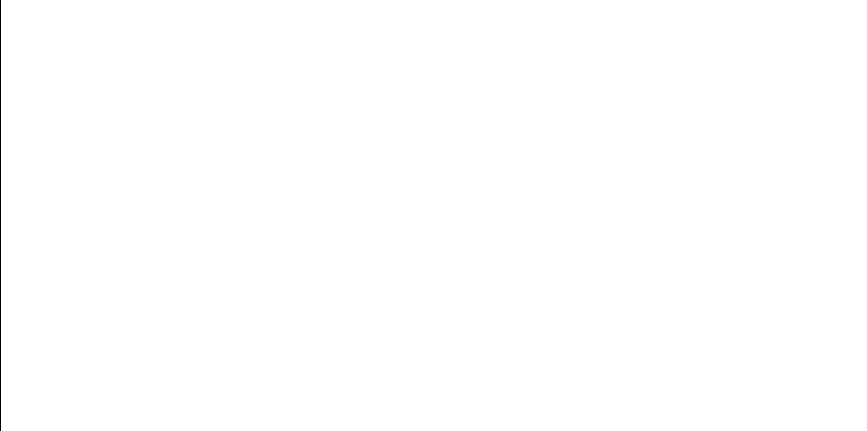

572.754166002 173.525607156
694.107515999 271.385986583
615.150087408 194.429838053
407.614510386 168.539965991
581.431831642 177.019021212
621.744517013 198.633750333
725.935570334 342.020087588
572.222500289 173.32364259
608.978101667 190.748956703
622.741935595 199.294989482


/Users/h/anaconda2/lib/python2.7/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


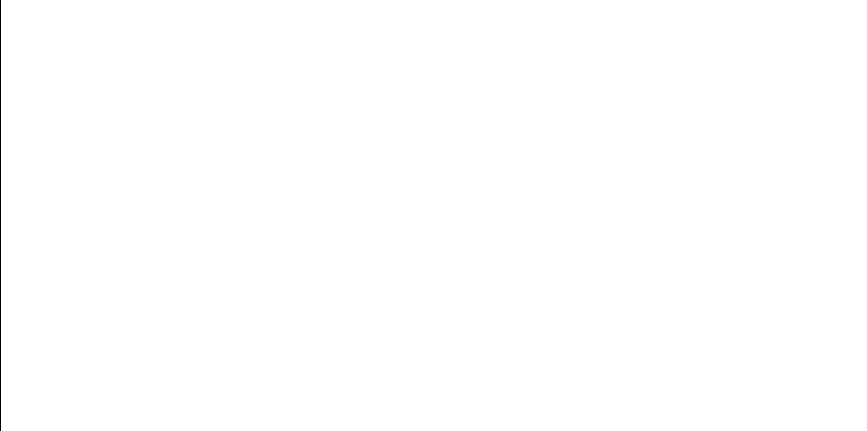

656.351196625 226.097395785
455.175599076 158.540816273
651.369743176 221.501654453
399.449593179 171.25364457
734.200389875 388.940983908
399.449593179 171.25364457
641.212008774 212.854746987
576.223448411 174.877406758
732.40000167 372.894056346
589.220641864 180.480470765


<IPython.core.display.Javascript object>


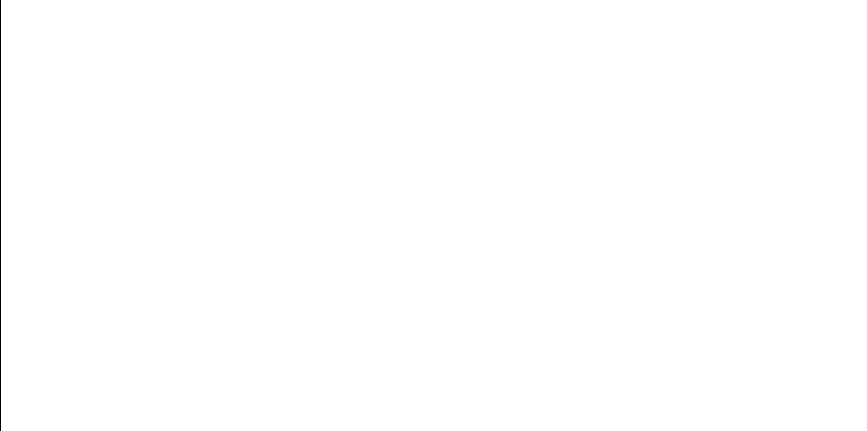

683.758532276 256.684499415
682.770145533 255.390465942
512.458349467 158.727736961
574.870216398 174.343094415
609.992672317 191.337735981
712.965056596 305.946262829
448.460860761 159.378190335
523.106167105 160.21194691
687.003339969 261.058669461
620.160982078 197.59785953


<IPython.core.display.Javascript object>


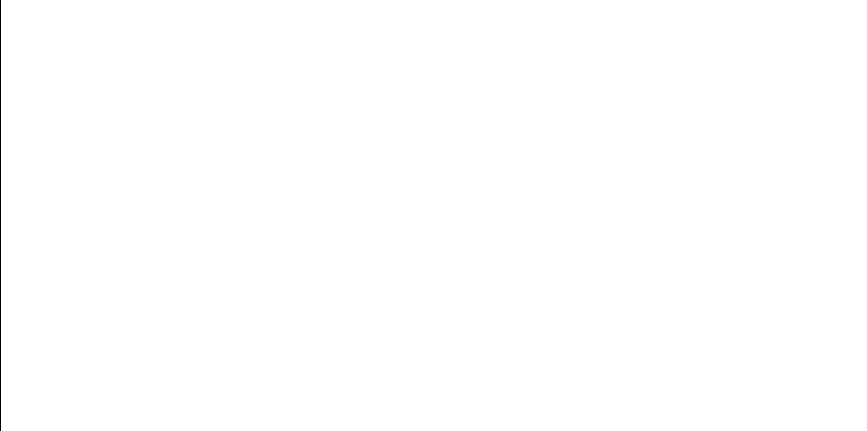

698.39888322 278.205041734
732.270799573 372.012590249
443.078019237 160.18232488
568.388463583 171.90759125
680.303399427 252.234670368
666.277649038 236.045371953
651.300788186 221.439757156
700.667932514 282.017043839
686.86228895 260.864362343
548.830947137 165.750567526


<IPython.core.display.Javascript object>

726.516009318 344.162100545
580.101276805 176.458945468
415.019640229 166.342482735
553.496800566 167.061575788
379.617893588 179.182376494
675.88347178 246.827356456
522.427273526 160.103455021
734.753168004 397.849107669
541.692866623 163.930321322
681.984988414 254.374729149


<IPython.core.display.Javascript object>

734.373629249 391.243352843
680.303399427 252.234670368
608.22783744 190.317607636
734.198534799 388.917766186
565.784483857 170.985863377
734.270245465 389.835873521
605.136693921 188.576253552
727.028130684 346.11700202
722.738644062 331.350901206
717.591971866 316.964100829


<IPython.core.display.Javascript object>

602.384074203 187.073339081
571.173824978 172.929297479
611.130392223 192.005524059
580.101276805 176.458945468
696.07214895 274.447930741
630.301558976 204.534230926
519.375015315 159.639100377
569.798730474 172.420245185
637.207566385 209.691127971
647.890540545 218.434762774


<IPython.core.display.Javascript object>

646.829347598 217.521685652
716.164727111 313.40601467
415.505670824 166.206846206
709.486396073 298.51057791
620.391752288 197.747765921
668.949069763 238.920773008
656.815703225 226.538767645
734.786071441 398.618563275
557.822362973 168.36414648
713.561022666 307.286604484


<IPython.core.display.Javascript object>

688.576598745 263.252746001
692.388242564 268.783867276
668.949069763 238.920773008
724.989915746 338.680154455
640.049027487 211.922342805
533.909479577 162.195978782
583.753972392 178.018102339
608.22783744 190.317607636
591.070096526 181.34927139
669.629955889 239.66819683


<IPython.core.display.Javascript object>

659.549750831 229.182911041
573.296972556 173.733222177
590.291206746 180.981147808
568.388463583 171.90759125
451.504493638 158.975935
522.106560984 160.052863266
669.048777237 239.029848242
689.757650359 264.933091871
613.113358249 193.18870742
734.297553363 390.197349292


<IPython.core.display.Javascript object>

620.399671068 197.752916256
620.391752288 197.747765921
716.170822071 313.420882328
452.902712915 158.803770392
600.419652718 186.027748014
733.143185223 378.464989171
591.070096526 181.34927139
470.062492153 157.332320528
714.198232262 308.743442116
515.64354269 159.123232131


<IPython.core.display.Javascript object>


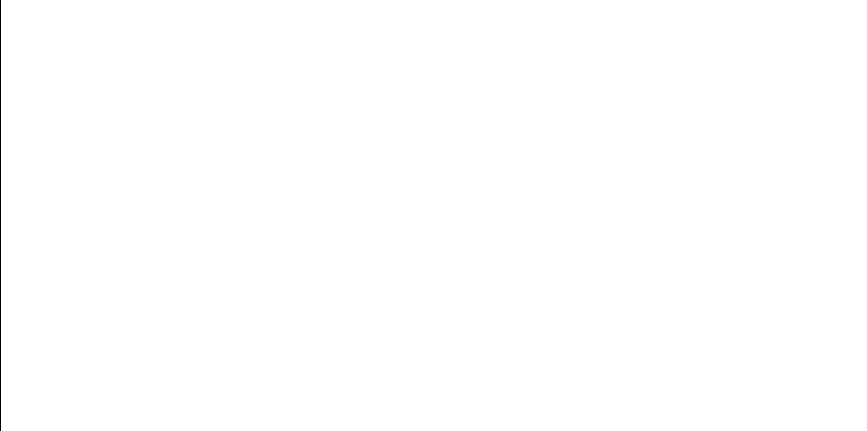

468.4964277 157.417714474
591.070096526 181.34927139
581.431831642 177.019021212
412.52951563 167.053909243
629.492001155 203.953435538
699.861303977 280.644342401
658.069990997 227.741901554
719.807952736 322.825795501
400.664654874 170.830121672
717.360304884 316.375772637


<IPython.core.display.Javascript object>


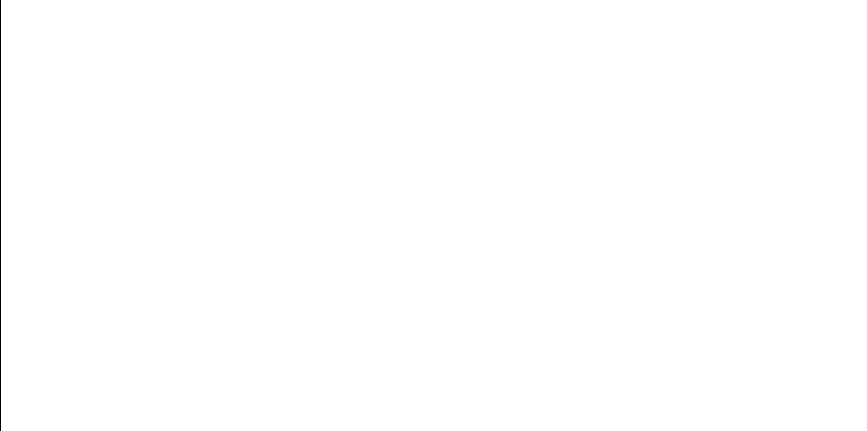

647.811710458 218.366581902
622.741935595 199.294989482
671.320493772 241.550331067
722.196164919 329.695556945
531.720366249 161.754522968
541.744477855 163.94268768
594.48648209 183.002733841
701.133420324 282.818341517
578.146342757 175.652247793
670.459323691 240.586811795


<IPython.core.display.Javascript object>


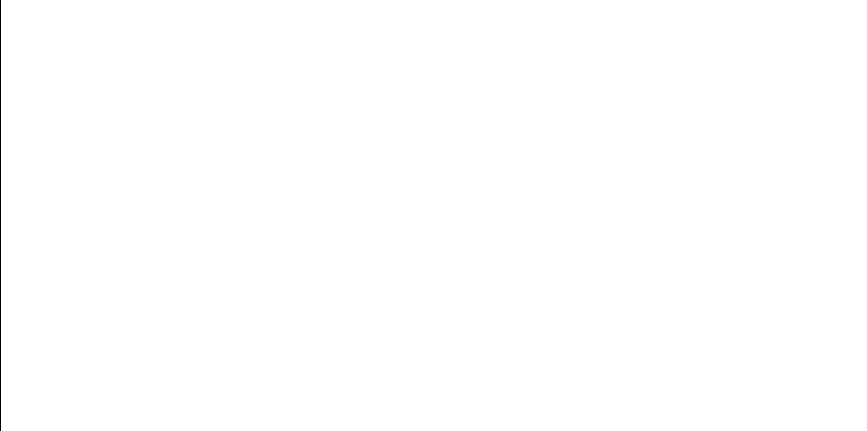

569.587275814 172.342771783
570.367751581 172.629790406
415.019640229 166.342482735
661.847720568 231.468332831
548.278164097 165.601640737
597.638293598 184.585068142
702.150779831 284.593666964
652.591531146 222.606028629
611.88152866 192.450810276
578.343967805 175.73292602


<IPython.core.display.Javascript object>


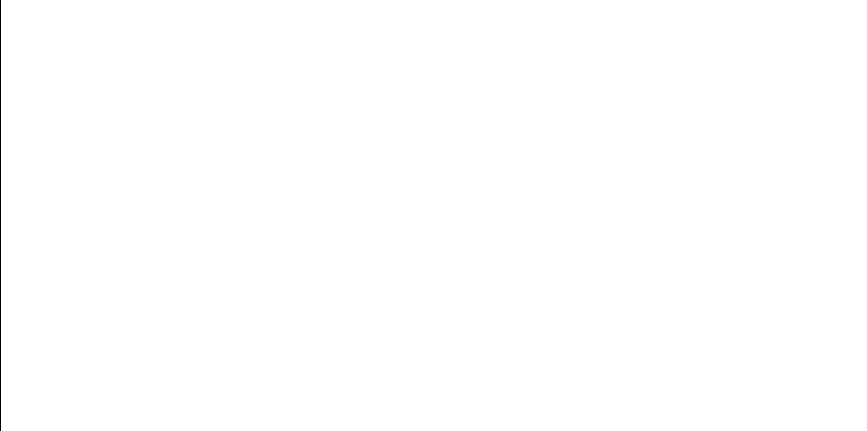

422.065949255 164.477932571
699.297759274 279.696947703
720.792603049 325.581309437
594.110279251 182.8175386
701.519138366 283.487505929
607.28661791 189.781304154
666.718756233 236.514004603
616.148691497 195.048075604
569.806335014 172.423035353
635.042740568 208.034816347


<IPython.core.display.Javascript object>


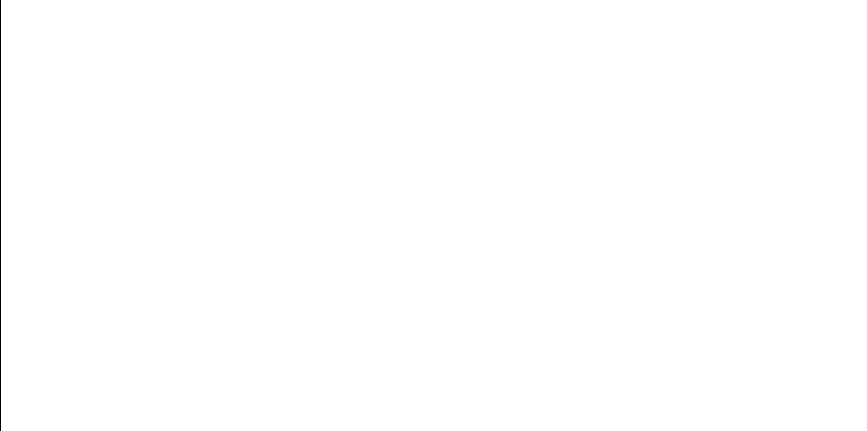

623.779563111 199.990156666
669.571827351 239.604152238
468.819375148 157.399304693
733.346638124 380.180548579
711.091936549 301.864252084
621.565154206 198.515563426
589.703175953 180.705382802
654.622416528 224.474266984
626.079863057 201.558073698
541.933599992 163.988100713


<IPython.core.display.Javascript object>


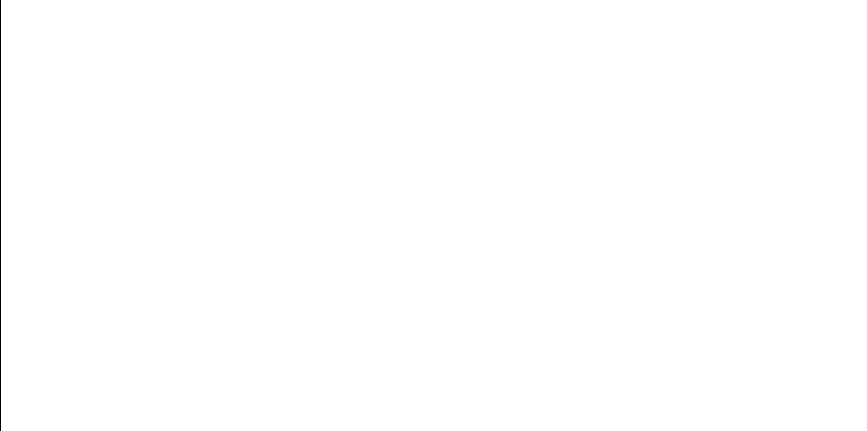

430.805958547 162.464440624
553.153803142 166.961895759
537.686191575 163.005243042
734.969386964 405.07214652
390.014370848 174.782851244
680.405596131 252.363380347
523.89710511 160.340741589
627.486893389 202.535626224
708.154231473 295.820620033
720.28181865 324.139299212


<IPython.core.display.Javascript object>

501.365541992 157.670123409
481.770319645 157.003000244
526.643694651 160.80808249
638.287023233 210.531008933
505.826037103 158.03591486
522.427273526 160.103455021
453.744508908 158.703942818
685.048799614 258.400257057
522.427273526 160.103455021
679.194643154 250.849242817


<IPython.core.display.Javascript object>


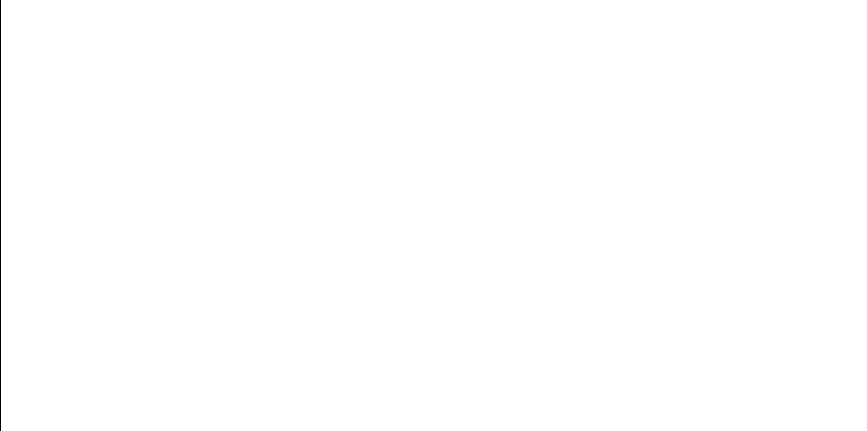

455.090190727 158.550319333
676.457709199 247.512803134
615.745486303 194.797675395
543.84964908 164.456915439
721.179010171 326.691075126
678.583495607 250.094064787
491.922219157 157.157997933
507.24757582 158.169270091
734.060032824 387.254657545
423.875480612 164.034101951


<IPython.core.display.Javascript object>

498.614675495 157.484231291
734.753168004 397.849107669
554.506930557 167.358201293
639.365895233 211.379892703
508.831196479 158.327406188
492.305481319 157.171868098
605.993014054 189.052918879
618.164286185 196.315689953
734.949897724 403.975158024
712.965056596 305.946262829


<IPython.core.display.Javascript object>


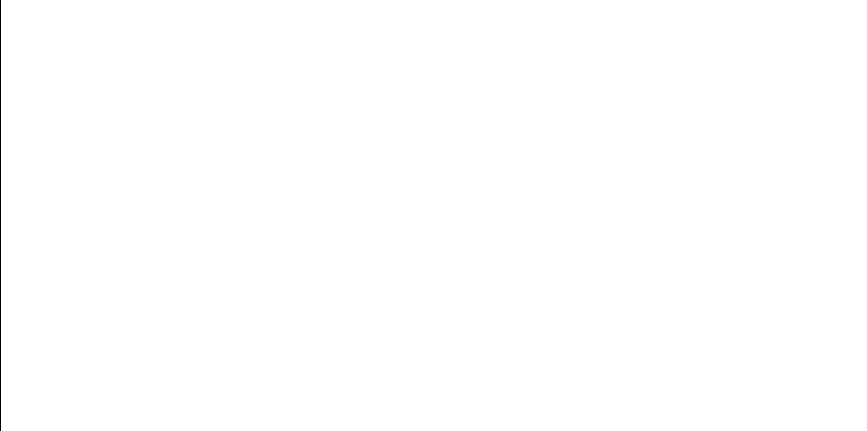

708.626851292 296.765762906
734.373629249 391.243352843
604.87975453 188.434079161
720.792603049 325.581309437
452.902712915 158.803770392
689.993622926 265.27234063
483.837761365 157.001392552
567.522121258 171.597365183
551.990344299 166.627698791
613.445960439 193.389584191


<IPython.core.display.Javascript object>


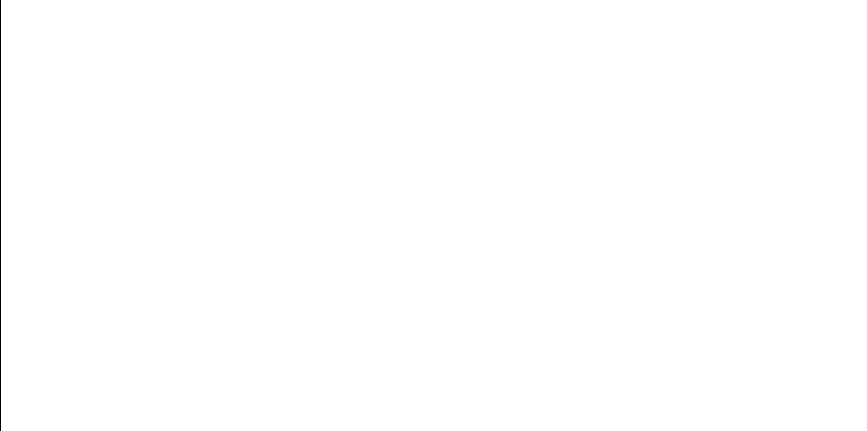

604.552053116 188.253316257
515.64354269 159.123232131
652.951446044 222.934135351
576.544747955 175.00559808
719.132940644 320.992986968
711.980405272 303.776552036
622.434753084 199.090615664
718.390086347 319.024963186
686.86228895 260.864362343
652.318481738 222.357958268


<IPython.core.display.Javascript object>

541.744477855 163.94268768
569.587275814 172.342771783
725.935570334 342.020087588
593.790037888 182.660503878
683.758532276 256.684499415
388.856555195 175.245830411
645.540036686 216.426023373
531.789299088 161.768116347
699.297759274 279.696947703
719.923133359 323.142974198


<IPython.core.display.Javascript object>

608.625375411 190.545736931
576.223448411 174.877406758
554.506930557 167.358201293
717.817989329 317.542294543
570.143148603 172.546893335
652.096095747 222.156454746
712.858526397 305.708868518
666.277649038 236.045371953
621.520466419 198.486151564
506.339728099 158.083166981


<IPython.core.display.Javascript object>

666.277649038 236.045371953
648.310009961 218.798526277
734.851639403 400.354091708
658.946847822 228.592941542
558.350632839 168.529040983
633.823035596 207.117826607
554.268250761 167.287699044
512.255080506 158.703894827
467.002739465 157.508275175
733.056133375 377.760119057


<IPython.core.display.Javascript object>


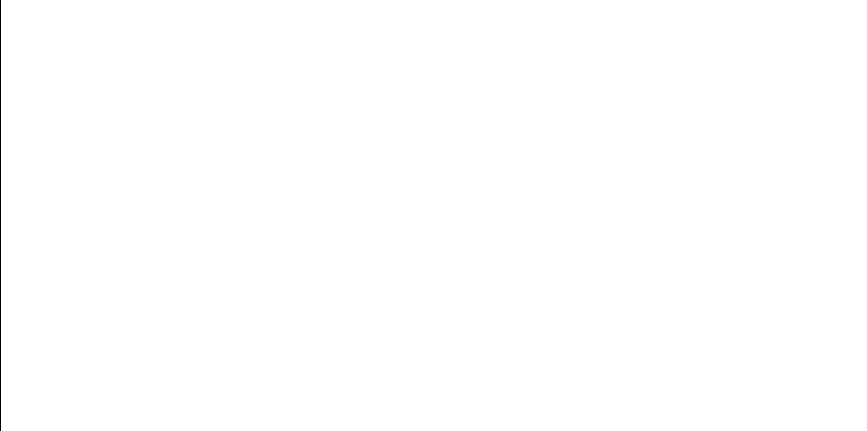

733.143185223 378.464989171
587.099245465 179.506324502
683.753029387 256.677246638
452.442250584 158.859591528
604.552053116 188.253316257
606.68270132 189.440009578
726.73526152 344.991232696
669.590220919 239.624413042
636.733305674 209.325087388
430.805958547 162.464440624


<IPython.core.display.Javascript object>

720.28181865 324.139299212
620.569023216 197.863163206
719.923133359 323.142974198
632.2291649 205.936816869
547.19172003 165.312858198
569.806335014 172.423035353
504.794242014 157.944207366
720.178048531 323.849701732
704.33633666 288.524998137
634.601612892 207.701835655


<IPython.core.display.Javascript object>

455.249808569 158.532583206
549.603980871 165.961094201
548.033709049 165.536210727
711.091936549 301.864252084
444.627766371 159.938618637
692.362953408 268.746109715
694.107515999 271.385986583
620.569023216 197.863163206
594.008227172 182.767434925
593.756845973 182.644259914


<IPython.core.display.Javascript object>

730.231742878 360.209987563
625.702676803 201.298420725
632.2291649 205.936816869
651.369743176 221.501654453
424.068480614 163.987600267
674.033292905 244.651951634
607.28661791 189.781304154
658.946847822 228.592941542
652.992536587 222.971675531
624.483148454 200.465785293


<IPython.core.display.Javascript object>

566.666674951 171.294536237
698.578546086 278.501377526
344.796148576 198.278156207
606.958126124 189.595389821
503.451387684 157.831250467
594.788727464 183.152085659
732.018340298 370.349434734
652.163732521 222.217689276
676.731151339 247.840945023
717.817989329 317.542294543


<IPython.core.display.Javascript object>

605.136693921 188.576253552
571.173824978 172.929297479
676.15034901 247.145303814
529.371455437 161.303233528
654.024669208 223.920118537
719.643282222 322.374617005
733.143185223 378.464989171
734.969739078 405.094799761
599.978689127 185.796088094
612.504992559 192.823088878


<IPython.core.display.Javascript object>

695.937111194 274.234326788
561.340313067 169.486335779
448.460860761 159.378190335
648.323059591 218.809868901
605.136693921 188.576253552
557.822362973 168.36414648
625.099455569 200.885260669
656.351196625 226.097395785
483.837761365 157.001392552
618.962976477 196.825380812


<IPython.core.display.Javascript object>

676.457709199 247.512803134
620.470624477 197.799082848
660.994906333 230.613303972
514.041505085 158.919163145
733.971382147 386.254333533
676.890570685 248.032777872
599.574634212 185.584793135
733.05542972 377.754487244
501.77175983 157.700137221
594.834335972 183.174666395


<IPython.core.display.Javascript object>

634.976074137 207.984396402
689.483763322 264.540817237
617.201780325 195.707050849
635.042740568 208.034816347
717.360304884 316.375772637
697.485018512 276.711766079
566.628248116 171.281014395
571.410767413 173.01793245
734.053869031 387.183610647
662.555598634 232.184313481


<IPython.core.display.Javascript object>

699.861303977 280.644342401
619.302905799 197.04359441
632.924437086 206.449603396
614.51349365 194.03907102
683.758532276 256.684499415
505.826037103 158.03591486
588.679905722 180.229902464
696.775114579 275.567618672
654.700305053 224.546739674
558.860126944 168.689282095


<IPython.core.display.Javascript object>

454.1423466 158.657762572
661.846288389 231.466890048
644.352388413 215.42984023
559.491406047 168.889473781
594.008227172 182.767434925
715.099995778 310.849136735
659.932896341 229.559898038
714.285747643 308.945500166
730.11378595 359.616026956
552.240977751 166.699180769


<IPython.core.display.Javascript object>

616.949494685 195.548523375
582.190359002 177.342337314
713.561022666 307.286604484
732.992621728 377.255881153
541.744477855 163.94268768
656.734068806 226.461036115
620.391752288 197.747765921
423.875480612 164.034101951
685.72489741 259.311603756
671.424480509 241.667351826


<IPython.core.display.Javascript object>

676.729552754 247.839023366
582.054111975 177.284046944
572.06290863 173.263286045
531.262327357 161.664705798
621.741156677 198.631534103
679.07736698 250.703865625
576.076820122 174.819075166
700.745479566 282.150064531
606.958126124 189.595389821
455.175599076 158.540816273


<IPython.core.display.Javascript object>

524.645478286 160.46498408
526.643694651 160.80808249
659.746212495 229.376013938
733.554038503 382.043112389
558.622589817 168.614426578
620.39544523 197.75016774
600.560879186 186.102176581
581.910485098 177.22270185
492.305481319 157.171868098
709.696337689 298.941967679


<IPython.core.display.Javascript object>

647.498031864 218.095842075
529.815357232 161.386748482
715.404307946 311.571884714
725.259801536 339.615646148
461.349508382 157.931769806
512.458349467 158.727736961
724.959441028 338.575367255
650.990350315 221.161659396
600.419652718 186.027748014
567.576676579 171.6167955


<IPython.core.display.Javascript object>

659.746212495 229.376013938
428.214449535 163.027352211
580.101276805 176.458945468
614.636921482 194.114633112
503.404990879 157.827476926
569.281661596 172.23117842
688.070739434 262.54184274
680.303399427 252.234670368
676.15034901 247.145303814
642.647490097 214.021337307


<IPython.core.display.Javascript object>

678.583495607 250.094064787
658.069990997 227.741901554
566.164422456 171.118351196
720.28181865 324.139299212
623.779563111 199.990156666
584.506112312 178.347644358
430.805958547 162.464440624
590.147738399 180.913695817
611.651150623 192.313864211
679.942391032 251.781379555


<IPython.core.display.Javascript object>

711.091936549 301.864252084
676.890570685 248.032777872
344.796148576 198.278156207
577.298006073 175.308138672
388.856555195 175.245830411
615.405530676 194.587371066
734.704505123 396.799913905
569.798730474 172.420245185
560.245556012 169.131027274
636.479646499 209.130047004


<IPython.core.display.Javascript object>

659.932896341 229.559898038
613.549142693 193.452043985
711.310092901 302.329941036
734.198534799 388.917766186
666.677172752 236.469723788
587.912751689 179.877075496
670.375921388 240.494023596
685.048799614 258.400257057
732.756271628 375.446985496
557.822362973 168.36414648


<IPython.core.display.Javascript object>

709.7004149 298.950366269
615.949587509 194.924295677
531.405226975 161.692632537
417.207705002 165.740110337
587.912751689 179.877075496
732.018340298 370.349434734
629.437084166 203.914212143
651.369743176 221.501654453
604.87975453 188.434079161
506.938700804 158.139603357


<IPython.core.display.Javascript object>

657.729178893 227.413342882
700.68048788 282.038568076
618.164286185 196.315689953
570.233052336 172.580046146
508.831196479 158.327406188
457.216053099 158.322541735
566.038132355 171.074237261
597.873447589 184.705347725
468.4964277 157.417714474
571.706885725 173.12908525


<IPython.core.display.Javascript object>

681.895868305 254.260109954
406.064776168 169.031311763
548.278164097 165.601640737
620.399671068 197.752916256
719.923133359 323.142974198
675.010686855 245.794926141
493.411828806 157.215183498
528.698475591 161.178190369
609.992672317 191.337735981
690.953805851 266.665132058


<IPython.core.display.Javascript object>

676.176691598 247.17674511
653.991797744 223.889748786
660.994906333 230.613303972
553.153803142 166.961895759
717.591971866 316.964100829
615.949587509 194.924295677
704.869759539 289.510210468
645.540036686 216.426023373
607.244091221 189.757198986
627.486893389 202.535626224


<IPython.core.display.Javascript object>

406.064776168 169.031311763
734.200389875 388.940983908
660.994906333 230.613303972
593.790037888 182.660503878
731.983131526 370.123268973
632.790789281 206.350747728
498.190602407 157.458262711
553.496800566 167.061575788
697.274345395 276.370799198
425.506059781 163.6462822


<IPython.core.display.Javascript object>

558.860126944 168.689282095
507.24757582 158.169270091
617.504132809 195.897587397
606.426791351 189.296046515
666.277649038 236.045371953
685.72489741 259.311603756
549.603980871 165.961094201
503.404990879 157.827476926
520.907682668 159.867489888
683.758532276 256.684499415


<IPython.core.display.Javascript object>

572.222500289 173.32364259
644.203715568 215.306009161
700.68048788 282.038568076
542.076296462 164.022467977
650.739871688 220.937947884
732.992621728 377.255881153
697.485018512 276.711766079
728.677052707 352.903781115
676.729552754 247.839023366
637.207566385 209.691127971


<IPython.core.display.Javascript object>

608.269563248 190.341507085
662.830626517 232.464038319
647.498031864 218.095842075
558.811222069 168.673849512
549.785275852 166.010850182
645.982930463 216.800717021
651.369743176 221.501654453
620.399671068 197.752916256
646.910089571 217.590798192
730.11378595 359.616026956


<IPython.core.display.Javascript object>

733.583760938 382.320817965
613.510255579 193.428496344
501.365541992 157.670123409
586.076415208 179.045107406
524.645478286 160.46498408
543.028675218 164.25409472
692.835419414 269.453961865
390.89942369 174.433412773
671.775126876 242.063031437
734.200389875 388.940983908


<IPython.core.display.Javascript object>

598.268327969 184.908026545
483.894568765 157.001587809
674.033292905 244.651951634
706.039365503 291.707879906
647.811710458 218.366581902
545.19276935 164.795046241
711.091936549 301.864252084
682.426381351 254.944430736
685.048799614 258.400257057
732.379765436 372.754550756


<IPython.core.display.Javascript object>

568.388463583 171.90759125
487.930669 157.048241714
641.212008774 212.854746987
606.426791351 189.296046515
662.555598634 232.184313481
570.705535266 172.754917334
594.281406721 182.901683955
734.953108424 404.138811292
486.011192701 157.01799128
526.936178283 160.859692436


<IPython.core.display.Javascript object>

666.982651069 236.795516593
649.308154098 219.670662916
612.504992559 192.823088878
566.847870801 171.358390507
416.855652256 165.835600341
657.306053938 227.007144204
670.375921388 240.494023596
690.681912685 266.268703
672.501993058 242.888607774
592.911052304 182.232364343


<IPython.core.display.Javascript object>

457.200645851 158.324126958
636.733305674 209.325087388
476.435537547 157.085514841
601.536255422 186.619344028
692.835419414 269.453961865
676.731151339 247.840945023
604.87975453 188.434079161
637.523915348 209.936292646
556.807777182 168.051017791
687.445413157 261.670189578


<IPython.core.display.Javascript object>

652.248702388 222.294679401
640.049027487 211.922342805
702.150779831 284.593666964
701.276491918 283.065997142
632.924437086 206.449603396
498.614675495 157.484231291
422.235746039 164.435682405
681.984988414 254.374729149
656.815703225 226.538767645
733.346638124 380.180548579


<IPython.core.display.Javascript object>

668.949069763 238.920773008
641.871450862 213.388491901
678.165554736 249.581035492
612.872651672 193.043767518
468.55569541 157.414304729
652.992536587 222.971675531
611.165196839 192.026079173
534.095197546 162.234360601
733.896528812 385.443008896
718.390086347 319.024963186


<IPython.core.display.Javascript object>

670.459323691 240.586811795
675.515983516 246.391279168
670.459323691 240.586811795
691.514147601 267.487278839
715.404307946 311.571884714
665.323501111 235.039829436
453.744508908 158.703942818
580.192387775 176.497011291
411.638133026 167.315321251
598.268327969 184.908026545


<IPython.core.display.Javascript object>

599.978689127 185.796088094
530.10934563 161.442512627
606.32198023 189.237197888
571.470397506 173.040281478
665.506545919 235.231876638
676.890570685 248.032777872
693.363345 270.251078994
619.302905799 197.04359441
724.96034934 338.578488036
676.731151339 247.840945023


<IPython.core.display.Javascript object>

577.298006073 175.308138672
684.019058843 257.028496152
676.731151339 247.840945023
613.610480973 193.489206164
642.510277722 213.909069147
614.636921482 194.114633112
493.411828806 157.215183498
558.758163057 168.657118412
581.116765406 176.88558781
722.293019178 329.988285853


<IPython.core.display.Javascript object>

726.516009318 344.162100545
734.198534799 388.917766186
642.827410297 214.168793779
537.222167755 162.902546694
615.979100929 194.942627513
719.230351892 321.254795886
452.442250584 158.859591528
732.756271628 375.446985496
573.333430952 173.747218396
714.648701186 309.788714156


<IPython.core.display.Javascript object>

680.405596131 252.363380347
625.202760813 200.955834455
503.918593653 157.869730141
622.47337936 199.11627874
528.229291628 161.092131672
515.50862192 159.105643319
716.988113621 315.439523922
633.820931434 207.116254638
714.198232262 308.743442116
657.574111081 227.264258495


<IPython.core.display.Javascript object>

675.010686855 245.794926141
594.110279251 182.8175386
580.047852159 176.43664435
647.457915569 218.061282065
678.165554736 249.581035492
565.822552416 170.999107541
607.28661791 189.781304154
613.445960439 193.389584191
731.983131526 370.123268973
724.989915746 338.680154455


<IPython.core.display.Javascript object>

483.189665661 157.000071375
701.146564342 282.841066643
654.112055162 224.000906547
440.573477222 160.597121263
694.107515999 271.385986583
669.629955889 239.66819683
654.426174145 224.291941654
448.460860761 159.378190335
730.009611696 359.097577919
580.047852159 176.43664435


<IPython.core.display.Javascript object>

558.758163057 168.657118412
507.24757582 158.169270091
541.725366965 163.938107257
699.297759274 279.696947703
686.86228895 260.864362343
589.220641864 180.480470765
583.753972392 178.018102339
488.689106878 157.064226314
473.732290186 157.170475212
660.994906333 230.613303972


<IPython.core.display.Javascript object>

607.10737018 189.679775974
686.907982322 260.927265354
692.362953408 268.746109715
546.844642137 165.221695653
719.139296261 321.010041702
681.895868305 254.260109954
712.965056596 305.946262829
627.486893389 202.535626224
669.189194472 239.183676103
719.471816626 321.907635573


<IPython.core.display.Javascript object>

523.969841853 160.352715562
576.076820122 174.819075166
729.631964287 357.263415344
734.998462899 408.119831524
566.666674951 171.294536237
484.134067442 157.002551816
382.470772347 177.920199092
659.746212495 229.376013938
701.276491918 283.065997142
570.367751581 172.629790406


<IPython.core.display.Javascript object>

717.591971866 316.964100829
708.154231473 295.820620033
617.570115183 195.939247866
615.949587509 194.924295677
720.792603049 325.581309437
557.013120764 168.114014615
650.121993575 220.388655528
725.935570334 342.020087588
577.05262511 175.209273687
529.815357232 161.386748482


<IPython.core.display.Javascript object>

448.460860761 159.378190335
611.165196839 192.026079173
605.455685964 188.753308822
685.72489741 259.311603756
595.278249354 183.395047213
698.253153538 277.965348507
592.722497181 182.14107112
430.805958547 162.464440624
524.407237585 160.42518093
556.807777182 168.051017791


<IPython.core.display.Javascript object>

597.873447589 184.705347725
652.073959692 222.136423682
406.064776168 169.031311763
700.68048788 282.038568076
575.238847174 174.487750699
571.173824978 172.929297479
734.953108424 404.138811292
682.426381351 254.944430736
634.666303489 207.750571712
569.281661596 172.23117842


<IPython.core.display.Javascript object>

501.77175983 157.700137221
675.819421302 246.751207188
653.148104611 223.113952925
664.284209501 233.957047027
682.770145533 255.390465942
522.435476116 160.104754518
657.817194387 227.498075639
719.639820779 322.365161617
552.240977751 166.699180769
594.110279251 182.8175386


<IPython.core.display.Javascript object>

455.175599076 158.540816273
719.230351892 321.254795886
716.164727111 313.40601467
537.222167755 162.902546694
620.391752288 197.747765921
567.576676579 171.6167955
659.4993603 229.133449986
700.745479566 282.150064531
606.32198023 189.237197888
666.718756233 236.514004603


<IPython.core.display.Javascript object>

668.949069763 238.920773008
498.614675495 157.484231291
709.486396073 298.51057791
636.448237874 209.105932321
722.196164919 329.695556945
620.391752288 197.747765921
458.76825405 158.167740336
572.06290863 173.263286045
660.104414725 229.729181725
618.627294943 196.610647945


<IPython.core.display.Javascript object>

675.88347178 246.827356456
701.696193679 283.796266548
570.367751581 172.629790406
716.988113621 315.439523922
734.753168004 397.849107669
499.344815047 157.530624089
419.211121546 165.207098164
688.070739434 262.54184274
656.812925222 226.536121313
580.288951833 176.537401178


<IPython.core.display.Javascript object>

569.806335014 172.423035353
612.872651672 193.043767518
733.346638124 380.180548579
515.648181365 159.123838165
685.048799614 258.400257057
571.173824978 172.929297479
709.488427876 298.514742892
667.474973324 237.323023626
715.956774816 312.90035865
720.427871688 324.548796658


<IPython.core.display.Javascript object>

599.978689127 185.796088094
458.76825405 158.167740336
647.457915569 218.061282065
683.097340504 255.816925468
385.250152418 176.730830075
530.893465121 161.593015461
387.977441929 175.601813508
582.054111975 177.284046944
539.616596856 163.442346972
719.053456389 320.780015152


<IPython.core.display.Javascript object>

649.744056299 220.054453112
660.104414725 229.729181725
452.902712915 158.803770392
570.233052336 172.580046146
721.115937726 326.50878713
556.807777182 168.051017791
726.633972309 344.606774139
620.39544523 197.75016774
598.008884768 184.774764078
584.582389272 178.381227586


<IPython.core.display.Javascript object>

406.064776168 169.031311763
576.076820122 174.819075166
688.710943769 263.44242509
420.858489739 164.781997587
566.666674951 171.294536237
666.677172752 236.469723788
676.15034901 247.145303814
582.054111975 177.284046944
680.405596131 252.363380347
719.639820779 322.365161617


<IPython.core.display.Javascript object>

530.10934563 161.442512627
541.692866623 163.930321322
725.637696749 340.948930088
632.677697761 206.26720346
586.188588721 179.095421625
560.72413158 169.285671329
705.075430073 289.892891237
595.103828241 183.308326043
428.214449535 163.027352211
570.233052336 172.580046146


<IPython.core.display.Javascript object>

655.167336031 224.982586683
615.70477196 194.772449253
541.933599992 163.988100713
614.092010181 193.781773851
734.297553363 390.197349292
645.928311383 216.754413965
423.875480612 164.034101951
641.212008774 212.854746987
648.859233778 219.277269231
680.952144759 253.054662187


<IPython.core.display.Javascript object>

733.066669 377.844566199
679.194643154 250.849242817
592.508187101 182.037542845
734.985028221 406.253083082
734.060032824 387.254657545
694.856048611 272.541161272
553.877094815 167.172711568
722.738644062 331.350901206
344.796148576 198.278156207
671.424480509 241.667351826


<IPython.core.display.Javascript object>

722.196164919 329.695556945
638.287023233 210.531008933
731.983131526 370.123268973
681.895868305 254.260109954
724.858526238 338.229573365
613.113358249 193.18870742
615.745486303 194.797675395
647.890540545 218.434762774
734.200389875 388.940983908
711.310092901 302.329941036


<IPython.core.display.Javascript object>

428.192826002 163.032169424
670.98864841 241.177867762
444.627766371 159.938618637
656.812925222 226.536121313
379.617893588 179.182376494
731.329297296 366.14489407
645.982930463 216.800717021
608.269563248 190.341507085
506.198152834 158.070038248
620.327997707 197.706315651


<IPython.core.display.Javascript object>

605.906429776 189.004523866
733.346638124 380.180548579
448.460860761 159.378190335
645.928311383 216.754413965
701.696193679 283.796266548
636.745745186 209.334665409
700.698119717 282.068803395
611.130392223 192.005524059
617.570115183 195.939247866
698.591505899 278.522789023


<IPython.core.display.Javascript object>

568.546140904 171.964437739
721.115937726 326.50878713
597.638293598 184.585068142
724.941873857 338.515039375
708.154231473 295.820620033
687.003339969 261.058669461
551.022873875 166.354397052
659.932896341 229.559898038
642.510277722 213.909069147
715.404307946 311.571884714


<IPython.core.display.Javascript object>

640.049027487 211.922342805
595.231524773 183.371799531
608.625375411 190.545736931
654.083433296 223.974437302
608.978101667 190.748956703
641.755664159 213.294509281
653.991797744 223.889748786
604.159770194 188.037763212
629.437084166 203.914212143
558.811222069 168.673849512


<IPython.core.display.Javascript object>

584.506112312 178.347644358
712.915575824 305.835917134
624.483148454 200.465785293
733.971382147 386.254333533
688.739431879 263.482694602
546.844642137 165.221695653
626.079863057 201.558073698
631.466365002 205.378443029
730.639366804 362.322982007
579.41662835 176.174241593


<IPython.core.display.Javascript object>

730.11378595 359.616026956
644.352388413 215.42984023
701.789243043 283.958938229
548.701619741 165.715604357
732.018340298 370.349434734
686.86228895 260.864362343
531.789299088 161.768116347
577.298006073 175.308138672
701.696193679 283.796266548
511.829492583 158.654518001


<IPython.core.display.Javascript object>

554.506930557 167.358201293
647.498031864 218.095842075
656.815703225 226.538767645
600.560879186 186.102176581
428.214449535 163.027352211
503.918593653 157.869730141
665.323501111 235.039829436
679.07736698 250.703865625
704.33633666 288.524998137
652.096095747 222.156454746


<IPython.core.display.Javascript object>

593.756845973 182.644259914
606.32198023 189.237197888
531.720366249 161.754522968
685.721251977 259.306666826
587.502445946 179.689645259
425.032309608 163.757779184
734.672420641 396.15505202
645.928311383 216.754413965
593.756845973 182.644259914
711.980405272 303.776552036


<IPython.core.display.Javascript object>

603.59103321 187.726859494
580.288951833 176.537401178
679.106434221 250.739877237
553.877094815 167.172711568
551.022873875 166.354397052
522.106560984 160.052863266
473.732290186 157.170475212
515.50862192 159.105643319
649.636473611 219.959566065
571.706885725 173.12908525


<IPython.core.display.Javascript object>

701.125601727 282.804826276
560.245556012 169.131027274
693.445282086 270.375387295
549.785275852 166.010850182
649.308154098 219.670662916
691.514147601 267.487278839
730.009611696 359.097577919
732.756271628 375.446985496
710.529681842 300.675284995
696.07214895 274.447930741


<IPython.core.display.Javascript object>

611.983506644 192.511536072
524.911240127 160.509662258
687.606330017 261.893746846
633.820931434 207.116254638
624.617354014 200.556902148
591.070096526 181.34927139
665.78119945 235.52079915
620.470624477 197.799082848
690.953805851 266.665132058
733.583794391 382.321132175


<IPython.core.display.Javascript object>

621.741156677 198.631534103
435.075735699 161.598979608
430.260841215 162.580477375
689.757650359 264.933091871
713.259816063 306.606557306
621.520466419 198.486151564
649.462734458 219.806559213
424.068480614 163.987600267
597.638293598 184.585068142
734.12517036 388.020276172


<IPython.core.display.Javascript object>

520.907682668 159.867489888
732.40000167 372.894056346
546.844642137 165.221695653
485.203360907 157.009632722
701.696193679 283.796266548
556.61612505 167.992394036
674.205443272 244.852266348
594.834335972 183.174666395
682.770145533 255.390465942
724.989915746 338.680154455


<IPython.core.display.Javascript object>

598.124275422 184.833987392
640.049027487 211.922342805
708.626851292 296.765762906
561.340313067 169.486335779
697.274345395 276.370799198
678.165554736 249.581035492
680.303399427 252.234670368
687.445413157 261.670189578
652.073959692 222.136423682
606.68270132 189.440009578


<IPython.core.display.Javascript object>

659.932896341 229.559898038
712.915575824 305.835917134
656.812925222 226.536121313
649.636473611 219.959566065
551.022873875 166.354397052
719.807952736 322.825795501
457.216053099 158.322541735
379.617893588 179.182376494
630.301558976 204.534230926
690.681912685 266.268703


<IPython.core.display.Javascript object>

660.147853878 229.772106338
571.173824978 172.929297479
659.549750831 229.182911041
611.651150623 192.313864211
558.622589817 168.614426578
554.506930557 167.358201293
644.768870714 215.777764044
654.10401716 223.993472245
604.137968588 188.025810181
645.540036686 216.426023373


<IPython.core.display.Javascript object>

693.580902921 270.581492116
668.507149345 238.438874471
580.101276805 176.458945468
601.085292753 186.379552522
608.269563248 190.341507085
692.881062962 269.522620436
712.187153015 304.22763297
539.616596856 163.442346972
613.113358249 193.18870742
553.153803142 166.961895759


<IPython.core.display.Javascript object>

565.822552416 170.999107541
649.592351581 219.920682266
579.345244916 176.144693464
548.830947137 165.750567526
514.558810004 158.983917495
524.407237585 160.42518093
631.265072906 205.231827421
520.907682668 159.867489888
646.721532417 217.429491249
611.864390438 192.440611201


<IPython.core.display.Javascript object>

649.636473611 219.959566065
630.16686333 204.437260632
416.855652256 165.835600341
568.152504433 171.822743526
638.287023233 210.531008933
615.405530676 194.587371066
707.893967403 295.304338579
631.238249846 205.212313221
560.098605828 169.083754241
719.643282222 322.374617005


<IPython.core.display.Javascript object>

566.666674951 171.294536237
579.41662835 176.174241593
689.396150139 264.415667489
683.753029387 256.677246638
689.101351754 263.99574901
638.072447358 210.363306334
582.054111975 177.284046944
683.139011014 255.871373447
701.133420324 282.818341517
700.667932514 282.017043839


<IPython.core.display.Javascript object>

537.222167755 162.902546694
657.574111081 227.264258495
726.516009318 344.162100545
543.84964908 164.456915439
645.928311383 216.754413965
733.143185223 378.464989171
734.672420641 396.15505202
615.949587509 194.924295677
634.223543225 207.417659567
726.633972309 344.606774139


<IPython.core.display.Javascript object>

670.375921388 240.494023596
711.37282435 302.464310683
675.010686855 245.794926141
700.667932514 282.017043839
470.062492153 157.332320528
608.625375411 190.545736931
648.624506066 219.072321684
683.412176555 256.229062029
565.822552416 170.999107541
498.614675495 157.484231291


<IPython.core.display.Javascript object>

657.306053938 227.007144204
574.870216398 174.343094415
662.481501163 232.109099329
559.819270244 168.994167323
421.961468474 164.503992529
545.924713291 164.982622633
662.236643359 231.860998994
675.515983516 246.391279168
730.231742878 360.209987563
520.907682668 159.867489888


<IPython.core.display.Javascript object>

615.979100929 194.942627513
689.101351754 263.99574901
603.674018331 187.772105511
581.116765406 176.88558781
665.323501111 235.039829436
631.265072906 205.231827421
676.176691598 247.17674511
646.553557557 217.286062556
469.769901278 157.347532323
566.038132355 171.074237261


<IPython.core.display.Javascript object>

581.431831642 177.019021212
604.159770194 188.037763212
503.404990879 157.827476926
557.592787166 168.292883149
734.850109024 400.309626907
734.704505123 396.799913905
719.899766439 323.078520374
468.55569541 157.414304729
594.008227172 182.767434925
701.146564342 282.841066643


<IPython.core.display.Javascript object>

657.729178893 227.413342882
551.559435248 166.505456064
637.523915348 209.936292646
724.858526238 338.229573365
681.435533481 253.670224837
605.136693921 188.576253552
523.969841853 160.352715562
634.976074137 207.984396402
553.877094815 167.172711568
692.45253046 268.879917628


<IPython.core.display.Javascript object>

603.59103321 187.726859494
607.10737018 189.679775974
710.731140761 301.099455387
604.87975453 188.434079161
647.890540545 218.434762774
673.254742059 243.751299176
604.87975453 188.434079161
714.198232262 308.743442116
647.890540545 218.434762774
724.96034934 338.578488036


<IPython.core.display.Javascript object>

616.64384202 195.357018626
715.786122766 312.487715562
707.623071879 294.770075815
691.514147601 267.487278839
567.576676579 171.6167955
719.230351892 321.254795886
525.254813675 160.567854895
449.072188158 159.294366136
559.491406047 168.889473781
551.427639815 166.468232783


<IPython.core.display.Javascript object>

559.819270244 168.994167323
524.645478286 160.46498408
712.086913033 304.008637132
672.140026088 242.476576629
515.50862192 159.105643319
587.099245465 179.506324502
683.097340504 255.816925468
585.622259308 178.842071841
616.97005164 195.561425081
618.945944419 196.814467515


<IPython.core.display.Javascript object>

681.049121885 253.177840727
590.147738399 180.913695817
523.106167105 160.21194691
629.942621281 204.27612242
712.858526397 305.708868518
578.146342757 175.652247793
653.680141429 223.602348122
620.39544523 197.75016774
726.458242222 343.945528255
673.538146661 244.078155883


<IPython.core.display.Javascript object>

701.125601727 282.804826276
659.4993603 229.133449986
674.498197807 245.193894385
645.928311383 216.754413965
692.07159451 268.312159839
416.855652256 165.835600341
704.869759539 289.510210468
512.255080506 158.703894827
690.535418347 266.05577965
506.198152834 158.070038248


<IPython.core.display.Javascript object>

701.146564342 282.841066643
644.530886737 215.578768926
634.601612892 207.701835655
730.009611696 359.097577919
630.16686333 204.437260632
712.694004114 305.343526617
558.622589817 168.614426578
704.722233206 289.236686326
633.288627802 206.719678779
659.746212495 229.376013938


<IPython.core.display.Javascript object>

724.989915746 338.680154455
662.129458601 231.752610566
625.702676803 201.298420725
483.189665661 157.000071375
648.054855265 218.577063479
594.008227172 182.767434925
651.300788186 221.439757156
605.136693921 188.576253552
665.506545919 235.231876638
711.980405272 303.776552036


<IPython.core.display.Javascript object>

654.700305053 224.546739674
719.639820779 322.365161617
557.822362973 168.36414648
629.492001155 203.953435538
685.72489741 259.311603756
666.393880218 236.168623512
730.661055827 362.438197773
480.32480143 157.014200177
586.188588721 179.095421625
667.168348779 236.994130019


<IPython.core.display.Javascript object>

678.583495607 250.094064787
489.785304162 157.091366469
693.580902921 270.581492116
442.517278956 160.27294217
679.106434221 250.739877237
615.150087408 194.429838053
581.431831642 177.019021212
529.371455437 161.303233528
580.192387775 176.497011291
730.231742878 360.209987563


<IPython.core.display.Javascript object>

726.73526152 344.991232696
657.265866957 226.9686631
614.636921482 194.114633112
725.391294517 340.076416646
589.201932133 180.471775023
390.89942369 174.433412773
662.815321407 232.448448924
709.486396073 298.51057791
498.614675495 157.484231291
457.200645851 158.324126958


<IPython.core.display.Javascript object>

670.375921388 240.494023596
493.411828806 157.215183498
662.129458601 231.752610566
611.165196839 192.026079173
615.405530676 194.587371066
567.522121258 171.597365183
665.323501111 235.039829436
678.583495607 250.094064787
631.466365002 205.378443029
452.442250584 158.859591528


<IPython.core.display.Javascript object>

711.091936549 301.864252084
646.829347598 217.521685652
697.274345395 276.370799198
690.681912685 266.268703
567.418382531 171.560456767
713.259816063 306.606557306
674.033292905 244.651951634
730.231742878 360.209987563
734.12517036 388.020276172
618.962976477 196.825380812


<IPython.core.display.Javascript object>

657.574111081 227.264258495
719.923133359 323.142974198
719.639820779 322.365161617
716.969152177 315.392116627
503.482569956 157.833791429
558.811222069 168.673849512
572.06290863 173.263286045
589.201932133 180.471775023
666.718756233 236.514004603
550.150464214 166.111517038


<IPython.core.display.Javascript object>

483.837761365 157.001392552
687.445413157 261.670189578
641.345583362 212.962564214
507.24757582 158.169270091
388.856555195 175.245830411
581.431831642 177.019021212
704.869759539 289.510210468
711.980405272 303.776552036
646.829347598 217.521685652
726.516009318 344.162100545


<IPython.core.display.Javascript object>

655.167336031 224.982586683
727.028130684 346.11700202
645.540036686 216.426023373
572.754166002 173.525607156
661.846288389 231.466890048
590.147738399 180.913695817
660.239069318 229.862309082
574.870216398 174.343094415
734.672420641 396.15505202
507.24757582 158.169270091


<IPython.core.display.Javascript object>

676.176691598 247.17674511
690.681912685 266.268703
725.967005522 342.134207343
714.648701186 309.788714156
526.643694651 160.80808249
692.835419414 269.453961865
733.554038503 382.043112389
658.946847822 228.592941542
734.969739078 405.094799761
459.26108437 158.120618853


<IPython.core.display.Javascript object>

657.574111081 227.264258495
574.599193025 174.237166832
709.488427876 298.514742892
508.831196479 158.327406188
726.633972309 344.606774139
550.150464214 166.111517038
644.203715568 215.306009161
574.870216398 174.343094415
667.474973324 237.323023626
700.801561568 282.246381595


<IPython.core.display.Javascript object>

620.470624477 197.799082848
557.956069781 168.405761492
701.519604776 283.48831796
725.685408821 341.119278545
483.837761365 157.001392552
705.647413671 290.965559325
650.990350315 221.161659396
605.455685964 188.753308822
595.103828241 183.308326043
682.875071758 255.527019675


<IPython.core.display.Javascript object>

701.789243043 283.958938229
586.188588721 179.095421625
573.480620763 173.803789856
607.284891398 189.780325312
666.277649038 236.045371953
415.505670824 166.206846206
560.72413158 169.285671329
422.065949255 164.477932571
501.365541992 157.670123409
655.109457255 224.928452162


<IPython.core.display.Javascript object>

718.487092244 319.279158573
459.26108437 158.120618853
719.821273823 322.86241085
659.4993603 229.133449986
573.296972556 173.733222177
426.123332237 163.502454871
642.010344464 213.501380175
637.841722455 210.183398613
620.391752288 197.747765921
712.187153015 304.22763297


<IPython.core.display.Javascript object>

595.809535549 183.660237221
566.666674951 171.294536237
667.615757994 237.474427853
432.182475024 162.177028712
616.949494685 195.548523375
632.790789281 206.350747728
620.569023216 197.863163206
350.261343605 194.793442915
636.745745186 209.334665409
641.755664159 213.294509281


<IPython.core.display.Javascript object>

594.008227172 182.767434925
661.821475232 231.441896845
644.352388413 215.42984023
531.405226975 161.692632537
720.178048531 323.849701732
430.260841215 162.580477375
548.278164097 165.601640737
446.74875257 159.621077355
580.047852159 176.43664435
657.695115909 227.380572411


<IPython.core.display.Javascript object>

693.269441471 270.108812434
518.093157428 159.45547431
519.375015315 159.639100377
709.7004149 298.950366269
568.152504433 171.822743526
713.32981944 306.764124316
541.933599992 163.988100713
382.470772347 177.920199092
541.744477855 163.94268768
685.72489741 259.311603756


<IPython.core.display.Javascript object>

557.592787166 168.292883149
552.240977751 166.699180769
708.154231473 295.820620033
713.561022666 307.286604484
508.207589283 158.263928717
644.530886737 215.578768926
681.984988414 254.374729149
364.64287017 186.523956754
692.362953408 268.746109715
520.907682668 159.867489888


<IPython.core.display.Javascript object>

699.861303977 280.644342401
734.969739078 405.094799761
723.092671157 332.452568581
529.366982144 161.302396122
599.978689127 185.796088094
637.207566385 209.691127971
611.165196839 192.026079173
537.222167755 162.902546694
642.286515739 213.726330746
579.110600178 176.047746237


<IPython.core.display.Javascript object>

665.323501111 235.039829436
678.173645423 249.590940871
560.245556012 169.131027274
601.085292753 186.379552522
698.369551977 278.15674996
713.259816063 306.606557306
615.162032521 194.437195302
688.576598745 263.252746001
700.667932514 282.017043839
734.924489278 402.831393819


<IPython.core.display.Javascript object>

616.502928945 195.268935428
492.305481319 157.171868098
652.992536587 222.971675531
734.060032824 387.254657545
504.794242014 157.944207366
641.871450862 213.388491901
611.130392223 192.005524059
688.739431879 263.482694602
691.514147601 267.487278839
575.255940617 174.494474647


<IPython.core.display.Javascript object>

680.303399427 252.234670368
647.498031864 218.095842075
683.201172028 255.952652037
661.846288389 231.466890048
637.207566385 209.691127971
683.412176555 256.229062029
592.911052304 182.232364343
503.918593653 157.869730141
734.200389875 388.940983908
637.207566385 209.691127971


<IPython.core.display.Javascript object>

508.207589283 158.263928717
722.196164919 329.695556945
669.629955889 239.66819683
719.139296261 321.010041702
388.856555195 175.245830411
725.967005522 342.134207343
620.569023216 197.863163206
734.953108424 404.138811292
631.466365002 205.378443029
605.906429776 189.004523866


<IPython.core.display.Javascript object>

588.426506358 180.113015317
717.591971866 316.964100829
421.976122109 164.50033471
592.508187101 182.037542845
588.679905722 180.229902464
641.098867597 212.76354043
734.200389875 388.940983908
720.28181865 324.139299212
644.768870714 215.777764044
733.583760938 382.320817965


<IPython.core.display.Javascript object>

523.89710511 160.340741589
734.763731822 398.090218194
675.819421302 246.751207188
537.222167755 162.902546694
461.349508382 157.931769806
734.198534799 388.917766186
652.096095747 222.156454746
566.439764087 171.214790685
734.672420641 396.15505202
649.592351581 219.920682266


<IPython.core.display.Javascript object>

636.745745186 209.334665409
715.233793966 311.166136026
576.223448411 174.877406758
613.417894968 193.37260686
666.607575647 236.395660063
693.311152364 270.171979804
686.2516707 260.027659085
490.979981623 157.126381109
487.930669 157.048241714
608.269563248 190.341507085


<IPython.core.display.Javascript object>

703.155466514 286.380382629
721.115937726 326.50878713
637.841722455 210.183398613
671.010534603 241.20238715
734.851639403 400.354091708
604.87975453 188.434079161
602.384074203 187.073339081
566.628248116 171.281014395
546.844642137 165.221695653
603.59103321 187.726859494


<IPython.core.display.Javascript object>

726.885994796 345.567976997
686.86228895 260.864362343
576.25812998 174.891219317
693.363345 270.251078994
585.622259308 178.842071841
430.260841215 162.580477375
467.112240618 157.501333797
693.958396457 271.157499427
733.681177945 383.252242352
604.137968588 188.025810181


<IPython.core.display.Javascript object>

625.702676803 201.298420725
711.37282435 302.464310683
704.869759539 289.510210468
490.979981623 157.126381109
534.095197546 162.234360601
522.427273526 160.103455021
725.935570334 342.020087588
659.549750831 229.182911041
572.754166002 173.525607156
618.945944419 196.814467515


<IPython.core.display.Javascript object>

629.437084166 203.914212143
674.033292905 244.651951634
633.823035596 207.117826607
684.678582519 257.904833455
661.108746193 230.726966342
452.902712915 158.803770392
734.704505123 396.799913905
589.220641864 180.480470765
587.470190403 179.674948344
653.991797744 223.889748786


<IPython.core.display.Javascript object>

672.620329317 243.023704374
710.731140761 301.099455387
585.622259308 178.842071841
719.923133359 323.142974198
700.745479566 282.150064531
593.790037888 182.660503878
700.801561568 282.246381595
644.203715568 215.306009161
695.937111194 274.234326788
640.049027487 211.922342805


<IPython.core.display.Javascript object>

683.758532276 256.684499415
528.229291628 161.092131672
595.462960962 183.487068194
717.591971866 316.964100829
733.681177945 383.252242352
701.696193679 283.796266548
695.937111194 274.234326788
551.022873875 166.354397052
582.224842198 177.357105244
652.096095747 222.156454746


<IPython.core.display.Javascript object>

624.791928844 200.67561613
529.371455437 161.303233528
484.134067442 157.002551816
654.112055162 224.000906547
536.457190969 162.735246668
605.906429776 189.004523866
658.069990997 227.741901554
561.340313067 169.486335779
654.10401716 223.993472245
586.216777267 179.10807563


<IPython.core.display.Javascript object>

605.993014054 189.052918879
502.308930381 157.74084055
707.623071879 294.770075815
683.139011014 255.871373447
451.504493638 158.975935
503.451387684 157.831250467
734.060032824 387.254657545
633.056946071 206.547751467
681.035118777 253.160044498
684.019058843 257.028496152


In [7]:
condition_list = ['cognitive', 'pain', 'vicarious']
for ind, condition in enumerate(condition_list):
    low_dir = os.sep.join([main_dir, 'stimuli', 'cue', 'task-'+ condition, 'scl'])

    if os.path.exists(low_dir): # if low_dir exists, wipe out every stimuli
        shutil.rmtree(low_dir) # we don't want multiple high cues than intended

    if not os.path.exists(low_dir):
        os.makedirs(low_dir)

    x0, y0 = 0.5, 0.5
    r = 252
    centerX = 483
    centerY = 409

    sample_data = pd.DataFrame()
    for fignum in range(1,57):

        # Read Images 
        plt.cla()
        img_scale = os.sep.join([main_dir, 'stimuli', 'ratingscale', 'task-'+ condition + '_scale.png'])
        display_image_in_actual_size(img_scale)

        # sample 10 radians
        high_sample = []
        high_sample = abs(np.random.choice(high_dist, 10, replace=True))
        # add sample to pd dataframe
        col_name = []
        col_name = 'figure' + '{:03d}'.format(fignum)
        sample_data[col_name] = high_sample

        for rad in range(10):
            if high_sample[rad]/pi > 1:
                # if the radians goes off the circular rating chart, 
                # flip the radians so that it's within the range of the circular rating image
                high_sample[rad] = (1 - (high_sample[rad]/pi-1))*pi
                x = centerX + r * cos(high_sample[rad])
                y = centerY - r * sin(high_sample[rad])
            else:
                x = centerX + r * cos(high_sample[rad])
                y = centerY - r * sin(high_sample[rad])
            print x,y
            plt.scatter( x,y,s=15**2, c='white', alpha=0.5, edgecolors='black', linewidths=.5)

        # calculate sample mean
        file_mean_original = np.mean(high_sample)
        file_mean_round = '{:.2f}'.format(round(file_mean_original, 2))
        file_mean = str(file_mean_round).replace(".", "")
        # calculate sample std
        file_std_original = np.std(high_sample)
        file_std_round = '{:.2f}'.format(round(file_std_original, 2))
        file_std = str(file_std_round).replace(".", "")
        # save image
        file_name = 'h' + '{:03d}'.format(fignum) + '_M' + str(file_mean) + '_STD'+ str(file_std) + '.png'
        file_fullname = os.path.join(low_dir, file_name)
        plt.savefig(file_fullname)

    # save pd dataframe
    sample_data.rename(index={0:'s01',1:'s02',2:'s03',3:'s04',4:'s05',5:'s06',6:'s07',7:'s08',8:'s09',9:'s10'}, inplace=True) 
    sample_data.loc['sample_mean'] = sample_data.mean()
    sample_data.loc['sample_std'] = sample_data.std()
    sample_data.to_csv(os.sep.join([main_dir, 'stimuli', 'cue', 'task-'+ condition, 'scl_data.csv']))